# pancreas.plasma.ev.long.RNA.TE.biomarkers

ref:
- [https://machinelearningmastery.com/binary-classification-tutorial-with-the-keras-deep-learning-library/](https://machinelearningmastery.com/binary-classification-tutorial-with-the-keras-deep-learning-library/)
- [https://machinelearningmastery.com/how-to-make-classification-and-regression-predictions-for-deep-learning-models-in-keras/](https://machinelearningmastery.com/how-to-make-classification-and-regression-predictions-for-deep-learning-models-in-keras/)
    * section 2 predict_class()
- [https://machinelearningmastery.com/how-to-improve-neural-network-stability-and-modeling-performance-with-data-scaling/](https://machinelearningmastery.com/how-to-improve-neural-network-stability-and-modeling-performance-with-data-scaling/)

## <span style="color:red">TODO 11/18</span>
- does tunning alpha, batch size or optimizer help. test on bestTopN. If you get improvement see if we get different features use additional tunning
- graph confusion matrix
    * [https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html](https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html)


## <span style="color:red">TODO</span>
- feature selection
- hyper parmeter tunning check out pipelines in [https://machinelearningmastery.com/binary-classification-tutorial-with-the-keras-deep-learning-library/](https://machinelearningmastery.com/binary-classification-tutorial-with-the-keras-deep-learning-library/)
    * alpha,
    * lambda
    * batch size
- validation data set performance

## <span style="color:red">TODO</span>
- look at transcript name, transcript count, weight, and elementwise values
- look at distirbutions element wise values. histogram? swarm plot
    - PDAC
    - healthy
- label the top genes on plot, what bin? where on volcano plot?
    panel = plot volcannot
    panel add transcript labels

In [1]:
from   bme263DataVis.utilities import MatPlotLibUtilities
from keras.utils import to_categorical
from keras.utils import plot_model
from pathlib import Path

from machineLearning.machineLearningData import MachineLearningData
from machineLearning.bioMarkerModel import BioMarkerModel

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import StratifiedShuffleSplit

In [2]:
mplu = MatPlotLibUtilities()
mplu.loadStyle() # load our custom matplotlib style settings

dataDir = Path("../../data/R/output/normalizedCounts.gencode.v35.ucsc.rmsk.tx.to.gene.csv")

outputDir = Path(".").joinpath("output")
outputDir.mkdir(exist_ok=True)

imgOutputDir = outputDir.joinpath("img")
imgOutputDir.mkdir(exist_ok=True)

imgDir = imgOutputDir.joinpath("pancreas.plasma.ev.long.RNA.TE.logisticRegression")
imgDir.mkdir(exist_ok=True)

# 
# tx2geneFile: file used to map transcript ids to gene ids and bio types
# rmsk == repeat mask, i.e. T.E 
# note there are two file formats
#
# top of file, 
# example from top of file has two cols separated by ','
# the first column can be split by "|" to get gene id, transcript id, .. maping
# ENST00000606857.1|ENSG00000268020.3|OTTHUMG00000185779.1|OTTHUMT00000471235.1|OR4G4P-201|OR4G4P|840|unprocessed_pseudogene|,OR4G4P
# 
# bottom of file, two columns separated by a ','
# example from bottom of file
# hg38_rmsk_ALR/Alpha_range=chr22_KI270739v1_random:50071-73985_5'pad=0_3'pad=0_strand=-_repeatMasking=none,ALR/Alpha
#
# probably easier to use 'grep'
tx2geneFile = "gencode.v35.ucsc.rmsk.tx.to.gene.csv"
annotationDir = Path("../../data/kimlab/genomes.annotations/gencode.35/")

tx2GenePath = annotationDir.joinpath(tx2geneFile)


# fix random seed for reproducibility
theMeaningOfLife = 42
np.random.seed(theMeaningOfLife)

# pancreas.plasma.ev.long.RNA.normalized.deseq.BIO_TYPE.counts.csv
#dataFile = "pancreas.plasma.ev.long.RNA.normalized.deseq.ENST.counts.csv"
dataFile = "pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv"
dataPath = dataDir.joinpath(dataFile)
assert dataPath.exists()

# Load data

In [3]:
rawDF = pd.read_csv(dataPath)
rawDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 578 entries, 0 to 577
Columns: 402 entries, Unnamed: 0 to PDAC_SRR9625101
dtypes: float64(401), object(1)
memory usage: 1.8+ MB


In [4]:
# fix col names
newNames = rawDF.columns.to_list()
# print(newNames)
newNames[0] = 'gene'
rawDF.columns = newNames
rawDF.head().iloc[0:4, 0:3]

,gene,healthy_SRR10080507,healthy_SRR10080508
0,(AAAG)n,29.346773,58.562794
1,(AAG)n,78.374182,117.647072
2,(AAGA)n,565.543811,114.348918
3,(AAGAAG)n,2.314036,0.376546


In [5]:
df = rawDF.transpose()
df.shape

(402, 578)

In [6]:
# select X
tmpNP = df.to_numpy()
featureList = tmpNP[0,:]
print("featureList.shape:{}".format(featureList.shape))
print("featureList:\n{}".format(featureList))

XNP = tmpNP[1:,:].astype('float64')
print("\nXNP.shape:{}".format(XNP.shape))
XNP[0:3,0:3]

featureList.shape:(578,)
featureList:
['(AAAG)n' '(AAG)n' '(AAGA)n' '(AAGAAG)n' '(AATGG)n' '(AATGGAATGG)n'
 '(AC)n' '(ACCAC)n' '(AG)n' '(AGA)n' '(AGAA)n' '(AGAAGA)n' '(AGAGAC)n'
 '(AGCCAAGCC)n' '(AGG)n' '(AGGA)n' '(AGGGTT)n' '(AGTG)n' '(AGTGATGG)n'
 '(AGTGG)n' '(ATG)n' '(ATGAA)n' '(ATGG)n' '(ATGGTG)n' '(CA)n' '(CAAC)n'
 '(CAC)n' '(CAGAGG)n' '(CAGCTC)n' '(CCAAGCCAG)n' '(CCAT)n' '(CCATCA)n'
 '(CCGCGC)n' '(CT)n' '(CTCT)n' '(G)n' '(GA)n' '(GAA)n' '(GAAA)n'
 '(GAAAGGA)n' '(GAAGAA)n' '(GAAGAC)n' '(GAATG)n' '(GAGA)n' '(GAGACA)n'
 '(GAGAGA)n' '(GAGGAAG)n' '(GATG)n' '(GATGGAT)n' '(GATGGT)n' '(GGAA)n'
 '(GGAAT)n' '(GGAATGGAAT)n' '(GGAGAA)n' '(GGAT)n' '(GGT)n' '(GGTGTGT)n'
 '(GT)n' '(GTG)n' '(GTGAGTG)n' '(GTGGTG)n' '(GTGTGTT)n' '(T)n' '(TC)n'
 '(TCTC)n' '(TG)n' '(TGAGGA)n' '(TGAGGAG)n' '(TGAGTG)n' '(TGATGG)n'
 '(TGG)n' '(TGGA)n' '(TGGAA)n' '(TGGCCC)n' '(TGGTGA)n' '(TGGTGG)n'
 '(TGGTGTG)n' '(TGTG)n' '(TGTGTG)n' '(TGTTGG)n' '(TTAGGG)n' '7SK' '7SLRNA'
 'A-rich' 'ALR/Alpha' 'AluJb' 'AluJo' 'AluJr' 'A

array([[ 29.3467735 ,  78.37418242, 565.54381096],
       [ 58.5627937 , 117.64707193, 114.34891781],
       [ 35.95633781,  85.4867443 ,  35.81617432]])

In [7]:
# select labels
# the labels are in the format disease_sampleID
# we want to skip the first string. it is 'transcriptId'
# labelList = hackDF.index.to_list()[1:]
labelList = df.index.to_list()[1:]
labelStr = [s.split('_')[0] for s in labelList]
print(len(labelStr))
print(labelStr[0:3])
print(labelStr[-3:])

401
['healthy', 'healthy', 'healthy']
['PDAC', 'PDAC', 'PDAC']


In [8]:
encoder = LabelEncoder()
yNP = encoder.fit_transform(labelStr)
print(yNP[0:3])
print(encoder.inverse_transform(yNP[0:3]))
print(yNP[-3:])
print(encoder.inverse_transform(yNP[-3:]))

[1 1 1]
['healthy' 'healthy' 'healthy']
[0 0 0]
['PDAC' 'PDAC' 'PDAC']


In [9]:
print("number of PDAC examples   :{}".format( sum(yNP)))
print("number of healthy examples:{}".format(len(yNP) - sum(yNP)))

number of PDAC examples   :117
number of healthy examples:284


# create 60/20/20 train/validation/test data set
- fit model using training data set
- use validation data set to tune hyper parameters
- use test data to evalute model

In [10]:
def splitData(XNP, yNP, testSize=0.4):
    # TODO use keras functions
    spliter = StratifiedShuffleSplit(
                            n_splits=1, 
                            test_size=testSize, 
                            random_state=theMeaningOfLife)

    for trainIndex, testIndex in spliter.split(XNP, yNP):
        XTrainNP = XNP[trainIndex]
        XTestNP =  XNP[testIndex]

        yTrainNP = yNP[trainIndex]
        yTestNP = yNP[testIndex]
            
    return (XTrainNP, yTrainNP, XTestNP, yTestNP)

XTrainNP, yTrainNP, XTestNP, yTestNP = splitData(XNP, yNP, testSize=0.4)
XValNP, yValNP, XTestNP, yTestNP = splitData(XTestNP, yTestNP, testSize=0.5)

## Scale data
benifits of scaling
1. scaled data tends to train faster. 
2. easier to do feature analysis. I.E. the learned weights are directly comparable.
3. often improves model stablity and performance
once we scale we get a nice learning curve. With scaling the loss and accuracy bounce all over the place

We only use the test data to set to fix the scaler. We must make sure we scale the test and validation input before making predictions using the scaler we trained on the test set

In [11]:
# normalize XNP
scaler = MinMaxScaler()

# # fit scaler on data
scaler.fit(XTrainNP)

# # apply transform
XTrainNP = scaler.transform(XTrainNP)

# inverse transform
# recover original input
#inverse = scaler.inverse_transform(XTrainNP)

XValNP = scaler.transform(XValNP)
XTestNP = scaler.transform(XTestNP)

## Train model

In [12]:
mlData = MachineLearningData(XTrainNP, yTrainNP,  XValNP, yValNP, XTestNP, yTestNP,)
mlData.name = dataFile
mlData.source = dataPath
mlData.notes = "DESeq normalized and minMax scaled transcript counts.\nref: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE133684\n"
print( mlData )

print("\n")
mlData.debug()

data set name:
pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

source:
../../data/R/output/normalizedCounts.gencode.v35.ucsc.rmsk.tx.to.gene.csv/pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

notes:
DESeq normalized and minMax scaled transcript counts.
ref: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE133684



XTrain.shape:(240, 578) yTrain.shape:(240,)
XVal.shape:(80, 578) yVal.shape:(80,)
XTest.shape:(81, 578) yTest.shape:(81,)


In [13]:
bioMarkerModel = BioMarkerModel(mlData, alpha=0.01, lambdaPenalty=0.0, name='simple logistitic regression')
print(bioMarkerModel)

model name:simple logistitic regression alpha:0.01 lambda:0.0
data set:
data set name:
pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

source:
../../data/R/output/normalizedCounts.gencode.v35.ucsc.rmsk.tx.to.gene.csv/pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

notes:
DESeq normalized and minMax scaled transcript counts.
ref: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE133684



In [14]:
bioMarkerModel.run()

In [15]:
bioMarkerModel.model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
logisticRegressionNeuron (De (None, 1)                 579       
Total params: 579
Trainable params: 579
Non-trainable params: 0
_________________________________________________________________


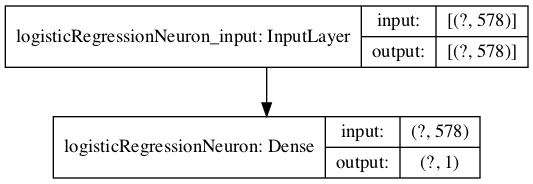

In [16]:
# https://www.tensorflow.org/api_docs/python/tf/keras/utils/plot_model
# returns a "jupyter notebook image" type IPython.core.display.Image

mo = imgDir.joinpath("tmp.png")
jupyterImg = plot_model(bioMarkerModel.model, to_file=mo, show_shapes=True, 
                        show_layer_names=True)
jupyterImg

## Evaluate model

In [17]:
def createPanel():
    figureWidthInInches = 8
    figureHeightInInches = 3
    fig = plt.figure(figsize=(figureWidthInInches,figureHeightInInches))
    panel = mplu.createPanelSameSizeAsFig(fig)
    return panel

def createFigureAndPanel(widthInInches=8, heightInInches=3):
    '''
    makes it possible to write model evaluation function that genertes
    multiple images with out having to save images to disk
    '''
    fig = plt.figure(figsize=(widthInInches, heightInInches))
    panel = mplu.createPanelSameSizeAsFig(fig)
    return (fig, panel)

In [18]:
def plotLearnCurves(model):
    '''
    todo
    '''
    
    # group data sets by metric
    # i.e. plot loss, val_loss, test_loss on same plot
    metricKeys = model.history.history.keys()
    # metricKeys: dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])
 
    valKeys = filter(lambda m: 'val' in m, metricKeys)
    valKeys = list(valKeys)
    # print(valKeys)
    # ['val_loss', 'val_binary_accuracy']

    
    prefixLength = len(valKeys[0].split('_')[0]) + 1
    metrics = [vk[prefixLength:] for vk in valKeys]
    #print("metrics " + str(list(metrics)))
    # metrics ['loss', 'binary_accuracy']
    
    plotGroupedList = []
    for metric in metrics:
        groupedKeys = list(filter(lambda x: metric in x, metricKeys))
#         print('groupedKeys: ' + str(groupedKeys))
#         groupedKeys: ['loss', 'val_loss']
#         groupedKeys: ['binary_accuracy', 'val_binary_accuracy']
        plotGroupedList.append(groupedKeys)
        
    for plotGroup in plotGroupedList:
        fig, panel = createFigureAndPanel(widthInInches=4, 
                                          heightInInches=3)  
        for historyKey in plotGroup:
            panel.plot( model.history.history[historyKey], 
                       label=historyKey 
                      )
            panel.legend()
            title = "{} {}".format(model.name, plotGroup[0])
            panel.set_title(title)
            panel.set_xlabel('epochs')

   

In [19]:
def calculateResults(bioMarkerModel, X, y):
    '''
    TODO
    '''
    # evalate model on test set
    # https://www.tensorflow.org/api_docs/python/tf/keras/Model#evaluate
    # returns Scalar test loss (if the model has a single output and no metrics) or 
    # list of scalars (if the model has multiple outputs and/or metrics). The attribute 
    # model.metrics_names will give you the display labels for the scalar outputs.
    testResults = bioMarkerModel.model.evaluate(X, y, verbose=0)
    
    ret = dict()
    for i in range(len(bioMarkerModel.model.metrics_names)):
        metricName = bioMarkerModel.model.metrics_names[i]
        value = testResults[i]
        ret[metricName] = value
        
    return ret

trainingResults = calculateResults(bioMarkerModel, 
                                   mlData.XTrain, mlData.yTrain)
validationResults = calculateResults(bioMarkerModel, 
                                     mlData.XVal, mlData.yVal)
testResults = calculateResults(bioMarkerModel, 
                               mlData.XTest, mlData.yTest)

print("\ntraining results:\n{}".format(trainingResults))
print("\nvalidation results:\n{}".format(validationResults))
print("\ntest results:\n{}".format(testResults))


training results:
{'loss': 0.24253830313682556, 'binary_accuracy': 0.9208333492279053}

validation results:
{'loss': 0.5557814836502075, 'binary_accuracy': 0.75}

test results:
{'loss': 0.609562873840332, 'binary_accuracy': 0.654321014881134}


In [20]:
def calculateConfusionMatrix(bioMarkerModel,X, y):
    '''
    TODO
    '''
    # if multi-classification
    # e.g. uses softmax in last layer activation
    # use np.argmax(model.predict(x), axis=-1)
    #
    # if binary-classification
    # e.g. uses sigmoid in last layer activation
    # use (model.predict(x) > 0.5).astype("int32")
    predicted = (bioMarkerModel.model.predict(X) > 0.5).astype("int32")

    # Compute confusion matrix
    # whose i-th row and j-th column entry indicates 
    # the number of samples with true label being i-th class and 
    # prediced label being j-th class.
    truth = y
    cm = confusion_matrix(truth, predicted)
    
    return cm

In [21]:
cmTrain = calculateConfusionMatrix(bioMarkerModel,
                                   mlData.XTrain, 
                                   mlData.yTrain)
print("training data set confusion_matrix:\ntrue label being i-th class and prediced label being j-th class\n{}".format(cmTrain))

cmVal = calculateConfusionMatrix(bioMarkerModel,
                                   mlData.XVal, 
                                   mlData.yVal)
print("\nvalidation data set confusion_matrix:\n{}".format(cmVal))

cmTest = calculateConfusionMatrix(bioMarkerModel,
                                   mlData.XTest, 
                                   mlData.yTest)
print("\ntest data set confusion_matrix:\n{}".format(cmTest))

training data set confusion_matrix:
true label being i-th class and prediced label being j-th class
[[166   4]
 [ 15  55]]

validation data set confusion_matrix:
[[46 11]
 [ 9 14]]

test data set confusion_matrix:
[[42 15]
 [13 11]]


In [22]:
def plotTunningLearningCurves(modelsList, getPlotLabel, legendTitle):
    '''
    the models in modelList have been trained by changing a the value of
    a single paramter. for example alpha
    
    produces plots showing change over epoc in metric. 
    '''
    figList = []

    # create images but do not automatically display them
    # https://stackoverflow.com/a/35949684/4586180
    #plt.ioff()
    
    # keys are used to access model traning history
    # i.e. get loss values for each epoch, ...
    metrics = modelsList[0].history.history.keys()
        
    for currentMetric in metrics:
        fig, panel = createFigureAndPanel(widthInInches=4, 
                                          heightInInches=3)
        figList.append(fig)  
        
        for currentModel in modelsList:
            plotLabel = getPlotLabel(currentModel)
            panel.plot( currentModel.history.history[currentMetric], 
                       label=plotLabel )

            title = "{} {}".format(currentModel.name, currentMetric)
            panel.set_title(title)
            panel.set_xlabel('epochs')
            panel.legend(title=legendTitle)
            
    # reset automatically display of plots
    # https://stackoverflow.com/a/35949684/4586180
    #plt.ion()
    
    return figList

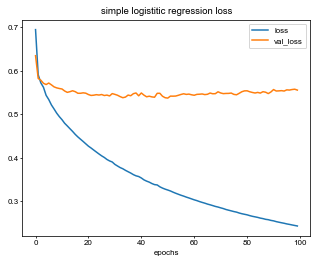

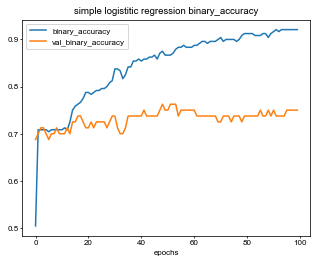

In [23]:
plotLearnCurves(bioMarkerModel)

# Tune  Model

## find best alpha

In [24]:
alphaList = [0.0001, 0.001, 0.01, 0.1]

bioMarkerModelList = []
for alpha in alphaList:
    bioMarkerModel = BioMarkerModel(mlData, 
                                    alpha=alpha, 
                                    lambdaPenalty=0.0, 
                                    name='simple logistitic regression')
    #print(bioMarkerModel)
    bioMarkerModel.run()
    bioMarkerModelList.append( bioMarkerModel ) 

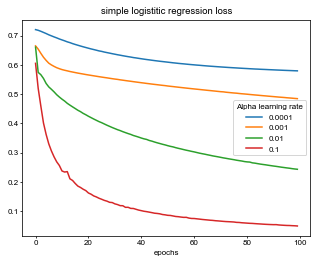

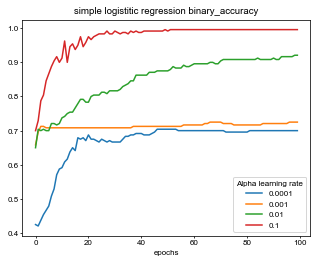

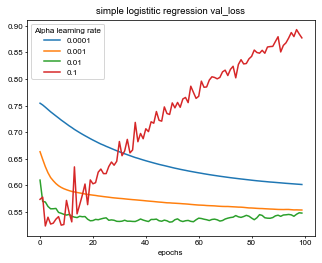

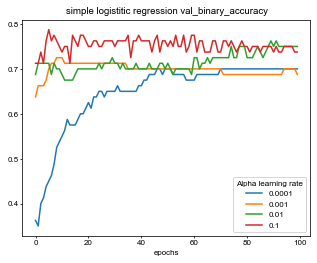

In [25]:
def getPlotAlphaLabel(bioMarkerModel):
    return bioMarkerModel.alpha

figList = plotTunningLearningCurves(modelsList=bioMarkerModelList,
                        getPlotLabel=getPlotAlphaLabel,
                        legendTitle="Alpha learning rate")

# Tune lambda the regularization penality

In [26]:
lamdaList = [0.0001, 0.001, 0.01, 0.1, 10]

bioMarkerModelList = []
for lamdaPenalty in lamdaList:
    bioMarkerModel = BioMarkerModel(mlData, 
                                    alpha=0.01, 
                                    lambdaPenalty=lamdaPenalty, 
                                    name='simple logistitic regression')
    #print(bioMarkerModel)
    bioMarkerModel.run()
    bioMarkerModelList.append( bioMarkerModel )

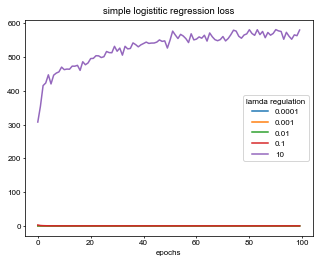

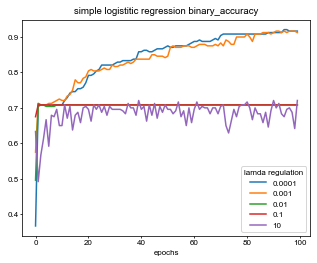

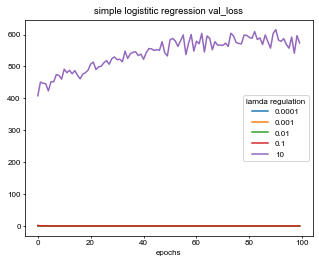

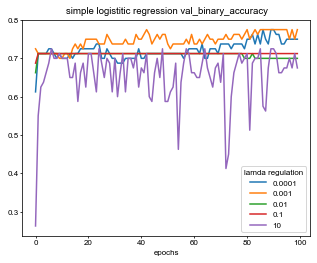

In [27]:
def getPlotLambdaLabel(bioMarkerModel):
    return bioMarkerModel.lambdaPenalty

figList = plotTunningLearningCurves(modelsList=bioMarkerModelList,
                        getPlotLabel=getPlotLambdaLabel,
                        legendTitle="lamda regulation")

# Best model
TODO:
- does batch size matter?
- try different random seeds
- try cross validation
    [https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/](https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/)

model name:simple logistitic regression alpha:0.01 lambda:0.0001
data set:
data set name:
pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

source:
../../data/R/output/normalizedCounts.gencode.v35.ucsc.rmsk.tx.to.gene.csv/pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

notes:
DESeq normalized and minMax scaled transcript counts.
ref: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE133684



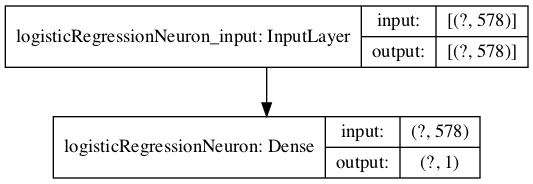

In [28]:
bestAlpha = 0.01
#bestLambdaPenalty = 0.001
bestLambdaPenalty = 0.0001
# use minMax scaling, 
bestBioMarkerModel = BioMarkerModel(mlData, 
                                alpha=bestAlpha, 
                                lambdaPenalty=bestLambdaPenalty, 
                                name='simple logistitic regression')

print(bestBioMarkerModel)
bestBioMarkerModel.run()

# https://www.tensorflow.org/api_docs/python/tf/keras/utils/plot_model
# returns a "jupyter notebook image" type IPython.core.display.Image

mo = imgDir.joinpath("bestBioMarkerModel.png")
jupyterImg = plot_model(bestBioMarkerModel.model, to_file=mo, show_shapes=True, 
                        show_layer_names=True)

# display the architecture image
jupyterImg

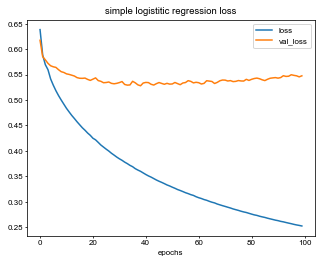

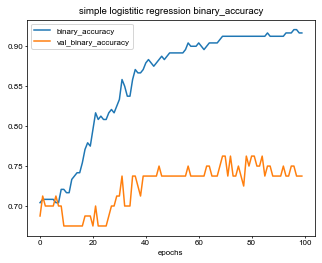

In [29]:
plotLearnCurves(bestBioMarkerModel)

In [30]:
bestTrainResults = calculateResults(bestBioMarkerModel, 
                                    mlData.XTrain, mlData.yTrain)
bestValResults = calculateResults(bestBioMarkerModel, 
                                  mlData.XVal, mlData.yVal)
bestTestResults = calculateResults(bestBioMarkerModel, 
                                   mlData.XTest, mlData.yTest)

print("\nbest training results:\n{}".format(bestTrainResults))
print("\nbest validation results:\n{}".format(bestValResults))
print("\nbest test results:\n{}".format(bestTestResults))


best training results:
{'loss': 0.2514650225639343, 'binary_accuracy': 0.9208333492279053}

best validation results:
{'loss': 0.5475003123283386, 'binary_accuracy': 0.737500011920929}

best test results:
{'loss': 0.6070223450660706, 'binary_accuracy': 0.654321014881134}


In [31]:
bestCMTrain = calculateConfusionMatrix(bestBioMarkerModel,
                                   mlData.XTrain, 
                                   mlData.yTrain)
print("best training data set confusion_matrix:\ntrue label being i-th class and prediced label being j-th class\n{}".format(bestCMTrain))

bestCMVal = calculateConfusionMatrix(bestBioMarkerModel,
                                   mlData.XVal, 
                                   mlData.yVal)
print("\nbest validation data set confusion_matrix:\n{}".format(bestCMVal))

bestCMTest = calculateConfusionMatrix(bestBioMarkerModel,
                                   mlData.XTest, 
                                   mlData.yTest)
print("\nbest test data set confusion_matrix:\n{}".format(bestCMTest))

best training data set confusion_matrix:
true label being i-th class and prediced label being j-th class
[[166   4]
 [ 15  55]]

best validation data set confusion_matrix:
[[46 11]
 [10 13]]

best test data set confusion_matrix:
[[44 13]
 [15  9]]


## <span style="color:red">TODO</span>
get accuracy, f1, ... recal from confusion matrix

prediction probalbities

https://machinelearningmastery.com/how-to-make-classification-and-regression-predictions-for-deep-learning-models-in-keras/

## Feature analysis
find which featues push sigmoid activation function

### explore learned weights

In [32]:
sigmoidLayer = bestBioMarkerModel.model.get_layer(name="logisticRegressionNeuron")

In [33]:
weightsList = sigmoidLayer.get_weights()
# if we do not flatten the weights we get unexpected results from np.argsort()
weightsNP = weightsList[0].flatten()
biasNP = weightsList[1]

In [34]:
print("bias:{}".format(biasNP))

bias:[0.22682162]


In [35]:
print("len(weights):{}".format(len(weightsNP)))
print("weights.shape{}".format(weightsNP.shape))
print("weights.flatten()shape{}".format(weightsNP.flatten().shape))
print("w[0:3]:{}".format(weightsNP[0:3]))
print("max:{}".format(np.max(weightsNP)))
print("min:{}".format(np.min(weightsNP)))
print("type(weightsNP):{}".format(type(weightsNP)))

len(weights):578
weights.shape(578,)
weights.flatten()shape(578,)
w[0:3]:[-0.0848168  -0.16003019 -0.08311512]
max:0.6651792526245117
min:-0.5796911716461182
type(weightsNP):<class 'numpy.ndarray'>


In [36]:
numKnockedOut = np.sum( np.isclose(weightsNP, 0.) )
print("How many features did regularlization knock out? {}"
         .format(numKnockedOut))


How many features did regularlization knock out? 0


# select top features and tran new model

find largest components of Z, that is to say the features that maximal activate sigmoid

In [37]:
# split out the healthy and PDAC examples

PDAC_labelInt = encoder.transform(['PDAC'])[0]
healthyLabelInt = encoder.transform(['healthy'])[0]
print("PDAC int:{} healthy int:{}".format(PDAC_labelInt, healthyLabelInt))

selectPADCTrainingExamples = (yTrainNP == PDAC_labelInt)
PADC_XTrainNP = XTrainNP[selectPADCTrainingExamples]

# this works but does not generalize for multi-classification problems
#selectHealthyTrainingExamples = (selectPADCTrainingExamples != True)
selectHealthyTrainingExamples = (yTrainNP == healthyLabelInt)
healthyXTrainNP = XTrainNP[selectHealthyTrainingExamples]

print("PADC shape   :{}".format(PADC_XTrainNP.shape))
print("healthy shape:{}".format(healthyXTrainNP.shape))

PDAC int:0 healthy int:1
PADC shape   :(170, 578)
healthy shape:(70, 578)


In [38]:
def ascendingArgSort(x):
    '''
    Returns the indices that would sort an array from smallest to largets
    
    Numpy argsort does not have a ascending/decending argument
    '''
    return np.argsort(x)

def decendingArgSort(x):
    '''
    Returns the indices that would sort an array from largets to smallest
    
    Numpy argsort does not have a ascending/decending argument
    '''
    acsendingIdx = np.argsort(x)
    decendingIdx =  acsendingIdx[::-1]
    return decendingIdx

In [39]:
def binaryClassifierImportantFeatures(topN, featureList,
                                      weights, bias, labelInt, X, y):
    
    retDict = dict()
    
    selectIdx = y == labelInt
    #print("shapeIdx:{} o:5:{}".format(selectIdx.shape, selectIdx[0:5]))
    
    lableX = X[selectIdx]
    #print("lableX:{} o:5:{}".format(lableX.shape, lableX[0:5]))
    
    colAxis=0
    averageX = np.mean(lableX, axis=colAxis)
    #print("averageX.shape:{}".format(averageX.shape))

    # element wise multiplication
    zTerms = np.multiply(averageX, weights)
    #print("zTerms.shape:{}".format(zTerms.shape))
    
    if labelInt == 1:
        sortedIdx = decendingArgSort( zTerms )
    elif labelInt == 0:
        sortedIdx = ascendingArgSort( zTerms )
    else:
        print("ERROR must be binary classifier, label:{}".format(labelInt))
        
    topIdx = sortedIdx[0:topN]
    retDict["topN"] = topN
    retDict["topIdx"] = topIdx
    retDict["labelInt"] = labelInt
    retDict["trascriptIds"] = featureList[topIdx]
    retDict["averageTrascripts"] = averageX[topIdx]
    retDict["weights"] = weights[topIdx]
    retDict["zTerms"] = zTerms[topIdx]
    
    return retDict

In [40]:
topN = 5
healthyDict = binaryClassifierImportantFeatures(
                            topN=topN,
                            featureList=featureList,
                            weights=weightsNP,
                            bias=biasNP,
                            labelInt=healthyLabelInt,
                            X=XTrainNP,
                            y=yTrainNP)

print()
for key,item in healthyDict.items():
    print("{}\n{}\n".format(key,item))


topN
5

topIdx
[381 153  28 232 497]

labelInt
1

trascriptIds
['LTR8' 'Harlequin-int' '(CAGCTC)n' 'L1MC4a' 'MLT1F1']

averageTrascripts
[0.2726073  0.21236012 0.28509767 0.23754322 0.23661321]

weights
[0.5178246  0.60232365 0.44003952 0.48819548 0.39432618]

zTerms
[0.14116276 0.12790953 0.12545424 0.11596752 0.09330278]



In [41]:
PADC_Dict = binaryClassifierImportantFeatures(
                            topN=topN,
                            featureList=featureList,
                            weights=weightsNP,
                            bias=biasNP,
                            labelInt=PDAC_labelInt,
                            X=XTrainNP,
                            y=yTrainNP)

print()
for key,item in PADC_Dict.items():
    print("{}\n{}\n".format(key,item))


topN
5

topIdx
[102 180 270 289 495]

labelInt
0

trascriptIds
['AluSx3' 'HSMAR1' 'L1P1' 'L1PA7' 'MLT1F']

averageTrascripts
[0.33193381 0.2617046  0.33101968 0.39434147 0.29891124]

weights
[-0.5360869  -0.5328564  -0.41376603 -0.30663106 -0.3988399 ]

zTerms
[-0.17794537 -0.13945097 -0.1369647  -0.12091734 -0.11921772]



## train best model

In [42]:
def selectBestData(mlData, PADC_Dict, healthyDict):
    selectFeaturesIdx = np.concatenate([PADC_Dict["topIdx"],
                                     healthyDict["topIdx"]])
    
    selectedTranscriptIds = np.concatenate([PADC_Dict["trascriptIds"],
                                     healthyDict["trascriptIds"]])
    
    bestXTrain = mlData.XTrain[:,selectFeaturesIdx]
    bestXVal   = mlData.XVal  [:,selectFeaturesIdx]
    bestXTest  = mlData.XTest [:,selectFeaturesIdx]
    
    retMlData = MachineLearningData(bestXTrain, mlData.yTrain,  
                                    bestXVal, mlData.yVal, 
                                    bestXTest, mlData.yTest)
    
    retMlData.source = mlData.source
    retMlData.name = mlData.name
    
    note1 = "\n selected transcript ids:\n{}"\
                .format(selectedTranscriptIds)
    note2 = "\n selected transcript feature idx:\n{}"\
                .format(selectFeaturesIdx)
    retMlData.notes = mlData.notes + note1 + note2
    
    return (retMlData, selectedTranscriptIds, selectFeaturesIdx)
    
topNMLData, bestTrascriptIds, bestFeatureIdx = selectBestData(mlData, PADC_Dict, healthyDict)
print(topNMLData)
print()

topNMLData.debug()

data set name:
pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

source:
../../data/R/output/normalizedCounts.gencode.v35.ucsc.rmsk.tx.to.gene.csv/pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

notes:
DESeq normalized and minMax scaled transcript counts.
ref: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE133684

 selected transcript ids:
['AluSx3' 'HSMAR1' 'L1P1' 'L1PA7' 'MLT1F' 'LTR8' 'Harlequin-int'
 '(CAGCTC)n' 'L1MC4a' 'MLT1F1']
 selected transcript feature idx:
[102 180 270 289 495 381 153  28 232 497]

XTrain.shape:(240, 10) yTrain.shape:(240,)
XVal.shape:(80, 10) yVal.shape:(80,)
XTest.shape:(81, 10) yTest.shape:(81,)


## untuned top n model

In [43]:
name = "untuned top {} features logistitic regression".format(topN)
unTunedTopNModel = BioMarkerModel(topNMLData, 
#                                 alpha=bestAlpha, 
#                                 lambdaPenalty=bestLambdaPenalty, 
                                name=name)

print(unTunedTopNModel)
unTunedTopNModel.run()

model name:untuned top 5 features logistitic regression alpha:0.01 lambda:0.0
data set:
data set name:
pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

source:
../../data/R/output/normalizedCounts.gencode.v35.ucsc.rmsk.tx.to.gene.csv/pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

notes:
DESeq normalized and minMax scaled transcript counts.
ref: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE133684

 selected transcript ids:
['AluSx3' 'HSMAR1' 'L1P1' 'L1PA7' 'MLT1F' 'LTR8' 'Harlequin-int'
 '(CAGCTC)n' 'L1MC4a' 'MLT1F1']
 selected transcript feature idx:
[102 180 270 289 495 381 153  28 232 497]


In [44]:
topNTrainResults = calculateResults(unTunedTopNModel, 
                                   topNMLData.XTrain, topNMLData.yTrain)
topNValResults = calculateResults(unTunedTopNModel, 
                                     topNMLData.XVal, topNMLData.yVal)
topNTestResults = calculateResults(unTunedTopNModel, 
                               topNMLData.XTest, topNMLData.yTest)

print("\nuntrained top n results:\n{}".format(topNTrainResults))
print("\nunvalidation top n results:\n{}".format(topNValResults))
print("\nuntest top n results:\n{}".format(topNTestResults))


untrained top n results:
{'loss': 0.5131763815879822, 'binary_accuracy': 0.699999988079071}

unvalidation top n results:
{'loss': 0.5348593592643738, 'binary_accuracy': 0.7124999761581421}

untest top n results:
{'loss': 0.5910288691520691, 'binary_accuracy': 0.6666666865348816}


In [45]:
unTunedNCMTrain = calculateConfusionMatrix(unTunedTopNModel,
                                   topNMLData.XTrain, 
                                   topNMLData.yTrain)
print("training data set confusion_matrix:\ntrue label being i-th class and prediced label being j-th class\n{}".format(unTunedNCMTrain))

unTunedNCMVal = calculateConfusionMatrix(unTunedTopNModel,
                                   topNMLData.XVal, 
                                   topNMLData.yVal)
print("\nvalidation data set confusion_matrix:\n{}".format(unTunedNCMVal))

unTunedNCMTest = calculateConfusionMatrix(unTunedTopNModel,
                                   topNMLData.XTest, 
                                   topNMLData.yTest)
print("\ntest data set confusion_matrix:\n{}".format(unTunedNCMTest))

training data set confusion_matrix:
true label being i-th class and prediced label being j-th class
[[162   8]
 [ 64   6]]

validation data set confusion_matrix:
[[55  2]
 [21  2]]

test data set confusion_matrix:
[[53  4]
 [23  1]]


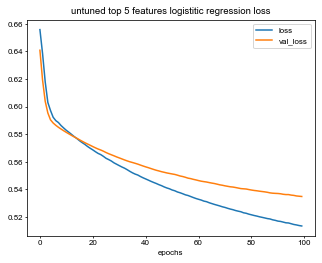

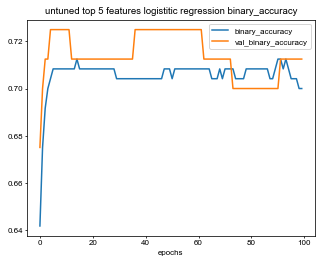

In [46]:
plotLearnCurves(unTunedTopNModel)

## Tune top n features model

In [47]:
name = "untuned top {} features logistitic regression".format(topN)
unTunedTopNModel = BioMarkerModel(topNMLData, 
#                                 alpha=bestAlpha, 
#                                 lambdaPenalty=bestLambdaPenalty, 
                                name=name)

print(unTunedTopNModel)
unTunedTopNModel.run()

model name:untuned top 5 features logistitic regression alpha:0.01 lambda:0.0
data set:
data set name:
pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

source:
../../data/R/output/normalizedCounts.gencode.v35.ucsc.rmsk.tx.to.gene.csv/pancreas.plasma.ev.long.RNA.normalized.deseq.gene.counts.csv

notes:
DESeq normalized and minMax scaled transcript counts.
ref: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE133684

 selected transcript ids:
['AluSx3' 'HSMAR1' 'L1P1' 'L1PA7' 'MLT1F' 'LTR8' 'Harlequin-int'
 '(CAGCTC)n' 'L1MC4a' 'MLT1F1']
 selected transcript feature idx:
[102 180 270 289 495 381 153  28 232 497]


## Tune top N regularization

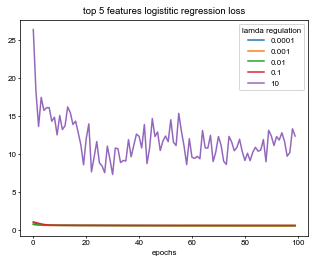

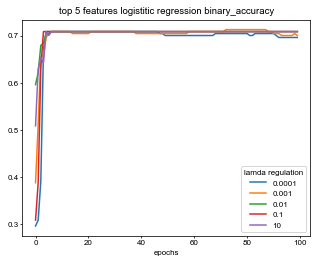

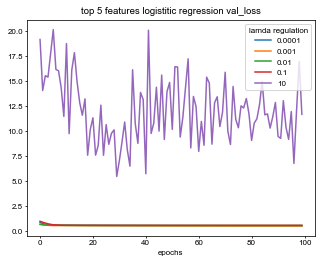

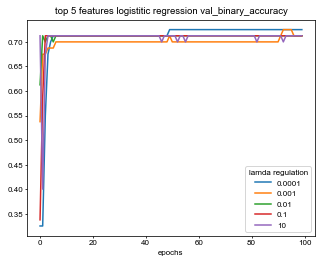

In [48]:
lamdaList = [0.0001, 0.001, 0.01, 0.1, 10]

topNModelList = []
name = "top {} features logistitic regression".format(topN)
for lamdaPenalty in lamdaList:
    topNModel = BioMarkerModel(topNMLData, 
                                alpha=0.01, 
                                lambdaPenalty=lamdaPenalty, 
                                name=name)
    #print(bioMarkerModel)
    topNModel.run()
    topNModelList.append( topNModel )

figList = plotTunningLearningCurves(modelsList=topNModelList,
                        getPlotLabel=getPlotLambdaLabel,
                        legendTitle="lamda regulation")

# winner winner chicken dinner

In [49]:
untunedAlpha = 0.01
bestName = "best top {} features logistitic regression".format(topN)
bestTopNModel = BioMarkerModel(topNMLData, 
                            alpha=untunedAlpha, 
                            lambdaPenalty=0.01, 
                            name=bestName)
#print(bioMarkerModel)
bestTopNModel.run()

In [50]:
bestTopNTrainResults = calculateResults(bestTopNModel, 
                                   topNMLData.XTrain, topNMLData.yTrain)
bestTopNValResults = calculateResults(bestTopNModel, 
                                     topNMLData.XVal, topNMLData.yVal)
bestTopNTestResults = calculateResults(bestTopNModel, 
                               topNMLData.XTest, topNMLData.yTest)

print("\nbest trained top n results:\n{}".format(bestTopNTrainResults))
print("\nbest validation top n results:\n{}".format(bestTopNValResults))
print("\nbest test top n results:\n{}".format(bestTopNTestResults))


best trained top n results:
{'loss': 0.5811752676963806, 'binary_accuracy': 0.7083333134651184}

best validation top n results:
{'loss': 0.6084376573562622, 'binary_accuracy': 0.7124999761581421}

best test top n results:
{'loss': 0.6192975044250488, 'binary_accuracy': 0.7037037014961243}


In [51]:
bestTopNCMTrain = calculateConfusionMatrix(bestTopNModel,
                                   topNMLData.XTrain, 
                                   topNMLData.yTrain)
print("best top n training data set confusion_matrix:\ntrue label being i-th class and prediced label being j-th class\n{}".format(bestTopNCMTrain))

bestTopNCMVal = calculateConfusionMatrix(bestTopNModel,
                                   topNMLData.XVal, 
                                   topNMLData.yVal)
print("\nbest top n validation data set confusion_matrix:\n{}".format(bestTopNCMVal))

bestTopNCMTest = calculateConfusionMatrix(bestTopNModel,
                                   topNMLData.XTest, 
                                   topNMLData.yTest)
print("\nbest top n test data set confusion_matrix:\n{}".format(bestTopNCMTest))

best top n training data set confusion_matrix:
true label being i-th class and prediced label being j-th class
[[170   0]
 [ 70   0]]

best top n validation data set confusion_matrix:
[[57  0]
 [23  0]]

best top n test data set confusion_matrix:
[[57  0]
 [24  0]]


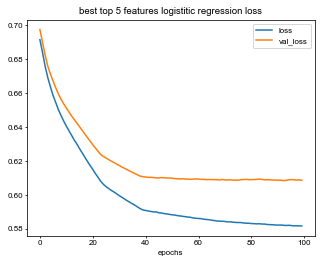

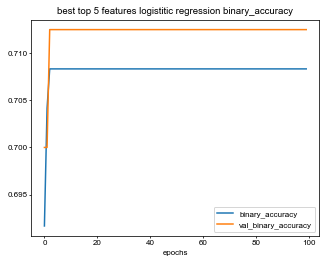

In [52]:
plotLearnCurves(bestTopNModel)

## explore best transcripts

In [53]:
grepRegex = "\|".join(bestTrascriptIds)
grepRegex

'AluSx3\\|HSMAR1\\|L1P1\\|L1PA7\\|MLT1F\\|LTR8\\|Harlequin-int\\|(CAGCTC)n\\|L1MC4a\\|MLT1F1'

In [54]:
! grep "$grepRegex" $tx2GenePath

ENST00000400977.3|ENSG00000215833.3|OTTHUMG00000034645.2|OTTHUMT00000083821.2|QRSL1P1-201|QRSL1P1|1540|processed_pseudogene|,QRSL1P1
ENST00000404582.2|ENSG00000218283.2|OTTHUMG00000037285.1|OTTHUMT00000090759.1|MORF4L1P1-201|MORF4L1P1|967|processed_pseudogene|,MORF4L1P1
ENST00000423936.1|ENSG00000237951.1|OTTHUMG00000151937.1|OTTHUMT00000324502.1|PPIL1P1-201|PPIL1P1|499|processed_pseudogene|,PPIL1P1
ENST00000427790.1|ENSG00000237322.1|OTTHUMG00000153591.1|OTTHUMT00000331783.1|RPL7L1P10-201|RPL7L1P10|463|processed_pseudogene|,RPL7L1P10
ENST00000373592.2|ENSG00000204121.2|OTTHUMG00000153336.1|OTTHUMT00000330786.1|ECEL1P1-201|ECEL1P1|1742|unprocessed_pseudogene|,ECEL1P1
ENST00000473622.1|ENSG00000243154.1|OTTHUMG00000159129.1|OTTHUMT00000353428.1|SYPL1P1-201|SYPL1P1|768|processed_pseudogene|,SYPL1P1
ENST00000513810.2|ENSG00000250656.2|OTTHUMG00000160778.2|OTTHUMT00000362253.2|ST3GAL1P1-201|ST3GAL1P1|1014|processed_pseudogene|,ST3GAL1P1
ENST00000502804.2|ENSG00000250339.2|OTTHUMG0000016086

hg38_rmsk_AluSx3_range=chr1:4933977-4934266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr1:5003616-5004134_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8_range=chr1:5126276-5127032_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr1:5148993-5149247_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr1:5169611-5170132_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr1:5261688-5261810_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:5359029-5359328_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr1:5371808-5372085_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_MLT1F_range=chr1:5462177-5462660_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr1:5521771-5522081_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:5563275-5563366_5'pad=0_3'pa

hg38_rmsk_AluSx3_range=chr1:8882784-8883086_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr1:8891378-8891674_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8_range=chr1:8892220-8892746_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr1:8892747-8892860_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:8893162-8893353_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr1:8893354-8893407_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr1:8894611-8894666_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr1:8895020-8895109_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR82A_range=chr1:8914528-8914770_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr1:8936390-8936672_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:8936702-8936712_5'pad=0_3'pad=0_strand=+

hg38_rmsk_AluSx3_range=chr1:12018809-12019144_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:12030650-12030788_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:12057885-12058343_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr1:12068863-12069170_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:12108075-12108376_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:12135035-12135337_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:12177676-12177815_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:12209769-12209987_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr1:12285590-12285621_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr1:12292436-12292738_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:1231

hg38_rmsk_AluSx3_range=chr1:15511248-15511403_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:15520673-15520875_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:15521183-15521289_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:15534442-15534732_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:15572820-15572906_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:15584144-15584448_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:15647684-15647972_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:15669268-15669530_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:15705171-15705481_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:15740697-15740982_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:15

hg38_rmsk_AluSx3_range=chr1:18665673-18665970_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:18759508-18759799_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:18759807-18760058_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:18851326-18851628_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr1:18853477-18853780_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR86A1_range=chr1:18883875-18884121_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR88a_range=chr1:19010650-19010983_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr1:19021460-19021583_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:19050446-19050753_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:19107499-19107806_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:

hg38_rmsk_AluSx3_range=chr1:24421036-24421372_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr1:24460095-24460268_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr1:24486029-24486357_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:24511032-24511313_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:24527044-24527301_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:24546046-24546213_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr1:24547386-24547637_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr1:24602773-24603068_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:24636479-24636960_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr1:24685157-24685452_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:24690547

hg38_rmsk_HSMAR1_range=chr1:27173173-27174361_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr1:27185462-27185762_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:27196951-27197243_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:27201846-27201983_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:27215186-27215280_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:27215597-27215780_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:27223476-27223606_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:27226889-27227198_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:27230014-27230325_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:27282521-27282803_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:27

hg38_rmsk_LTR8_range=chr1:30074725-30075455_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr1:30126240-30126690_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr1:30155101-30157037_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:30157039-30157071_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr1:30160617-30160962_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR84a_range=chr1:30217246-30217307_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr1:30217609-30217675_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr1:30217887-30217998_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr1:30218422-30218632_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_MLT1F2_range=chr1:30316242-30316812_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88a_range=chr1:30405333-3

hg38_rmsk_AluSx3_range=chr1:32952462-32952763_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:32987713-32988010_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:33000041-33000266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:33006682-33006988_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:33016698-33017004_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:33054079-33054376_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:33056005-33056166_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr1:33056531-33056887_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F1_range=chr1:33060025-33060159_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr1:33060457-33060810_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr1:330621

hg38_rmsk_MLT1F_range=chr1:35992730-35993210_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr1:36020927-36021231_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:36053269-36053574_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:36073144-36073452_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:36181699-36181866_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr1:36182462-36182761_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:36191858-36192070_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:36195648-36195950_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:36216521-36216809_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:36235967-36236239_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:362553

hg38_rmsk_AluSx3_range=chr1:39244272-39244580_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:39267232-39267533_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:39307589-39307871_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:39330803-39331085_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR83_range=chr1:39343049-39343684_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_AluSx3_range=chr1:39372955-39373024_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:39373312-39373500_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:39474107-39474408_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr1:39502270-39502761_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:39503054-39503157_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr1:3950

hg38_rmsk_AluSx3_range=chr1:42452442-42452725_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:42481938-42482238_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr1:42509108-42509516_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr1:42543081-42543272_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:42560358-42560667_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:42564321-42564565_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:42569140-42570125_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr1:42617417-42618088_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr1:42691859-42692125_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:42753641-42753944_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:42769264-427

hg38_rmsk_AluSx3_range=chr1:45743237-45743401_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:45766839-45766952_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr1:45769243-45769806_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr1:45785078-45785378_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr1:45800388-45800982_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_HSMAR1_range=chr1:45817786-45818971_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr1:45819273-45819339_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr1:45846540-45846839_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:45908205-45908344_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:45909817-45909955_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:4593

hg38_rmsk_L1PA7_range=chr1:49312872-49314235_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:49314238-49314985_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:49314984-49315642_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR85a_range=chr1:49320506-49320657_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr1:49333136-49333184_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:49423528-49423831_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr1:49429412-49429547_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85c_range=chr1:49434412-49434552_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR88b_range=chr1:49435605-49435761_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1PA7_range=chr1:49461494-49462059_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr1:49506903-495

hg38_rmsk_LTR8B_range=chr1:52635205-52635936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr1:52651543-52651664_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:52691471-52691773_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr1:52691774-52692285_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr1:52722546-52722863_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:52723882-52723963_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:52767319-52767602_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:52790449-52790740_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:52829718-52829879_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:52833957-52834264_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:5284

hg38_rmsk_LTR88b_range=chr1:55727564-55727682_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F1_range=chr1:55747604-55747928_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr1:55760090-55763051_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:55763037-55766057_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:55899866-55900222_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR82A_range=chr1:56007486-56008333_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr1:56012501-56012812_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr1:56042848-56043131_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr1:56043751-56044032_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR85b_range=chr1:56063980-56064219_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F_range=chr1:56096254-

hg38_rmsk_AluSx3_range=chr1:62746155-62746454_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr1:62749348-62749386_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr1:62749680-62750069_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr1:62750071-62750132_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr1:62804083-62804389_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr1:62806848-62807015_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr1:62812147-62814605_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:62922479-62922760_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:62969377-62969659_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:63013764-63014057_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:6313

hg38_rmsk_LTR85b_range=chr1:66407265-66407335_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_L1PA7_range=chr1:66408090-66408166_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:66408467-66412259_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chr1:66413948-66414125_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_LTR88c_range=chr1:66414300-66414399_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_L1MC4a_range=chr1:66441384-66441463_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:66456513-66456529_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:66457148-66457255_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8B_range=chr1:66505780-66506585_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR85a_range=chr1:66562843-66563037_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr1:66709008-

hg38_rmsk_AluSx3_range=chr1:70462206-70462514_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr1:70482142-70482221_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr1:70498642-70498724_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:70499112-70499218_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr1:70613486-70614001_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:70614001-70615594_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chr1:70622211-70622285_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR88c_range=chr1:70622771-70622821_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR84b_range=chr1:70641581-70641763_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr1:70642507-70642609_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_L1PA7_range=chr1:7065436

hg38_rmsk_L1PA7_range=chr1:75257749-75264144_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr1:75279375-75279598_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr1:75349068-75349357_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:75350613-75350923_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:75402387-75408862_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:75466375-75466681_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr1:75542156-75542288_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr1:75544872-75545416_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:75601206-75601538_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr1:75609816-75610104_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr1:75610464-7561

hg38_rmsk_AluSx3_range=chr1:79528175-79528479_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr1:79651681-79651749_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr1:79736000-79736256_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr1:79786191-79786302_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr1:79813664-79813955_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:79814285-79814354_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr1:79864267-79864570_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR83_range=chr1:79866804-79866950_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_L1PA7_range=chr1:79867113-79868911_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:79868901-79870723_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr1:79957004

hg38_rmsk_MLT1F_range=chr1:84267424-84267926_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chr1:84288586-84289122_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr1:84319344-84319641_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr1:84373066-84373126_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_LTR85b_range=chr1:84406537-84406874_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_L1PA7_range=chr1:84442767-84449240_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:84485110-84485397_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:84544930-84545222_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr1:84636265-84636963_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F2_range=chr1:84677473-84678005_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85a_range=chr1:84741964

hg38_rmsk_LTR85a_range=chr1:88629817-88629948_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr1:88688086-88688383_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:88816886-88817333_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:88817426-88817732_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:88817733-88818365_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:88818677-88820142_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr1:88909618-88909788_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr1:88974470-88974595_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:88994582-88994895_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:89015643-89015766_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr1:89045159

hg38_rmsk_AluSx3_range=chr1:92732619-92732919_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:92733407-92733711_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:92754409-92754884_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr1:92758957-92759234_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:92794328-92794444_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr1:92794744-92795054_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR85a_range=chr1:92816341-92816501_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr1:92821591-92821883_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr1:92859453-92859713_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr1:92860002-92860192_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr1:92860376

hg38_rmsk_L1PA7_range=chr1:96896083-96898417_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:96898396-96898535_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr1:96907111-96907572_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81C_range=chr1:96973539-96973649_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_LTR81_range=chr1:96973708-96974083_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81
hg38_rmsk_LTR81B_range=chr1:97003055-97003553_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr1:97003625-97004045_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_AluSx3_range=chr1:97009244-97009555_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr1:97105150-97105673_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr1:97129067-97129365_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:97249990

hg38_rmsk_L1PA7_range=chr1:101097525-101097705_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:101159021-101160169_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:101160169-101161686_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:101164257-101164374_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:101188786-101189501_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:101207498-101207799_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr1:101223434-101223591_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr1:101224341-101224490_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr1:101230367-101232705_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr1:101285139-101285894_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_ran

hg38_rmsk_MLT1F1_range=chr1:105852344-105852496_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr1:105878844-105885155_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr1:105885755-105886269_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr1:105918606-105918713_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr1:106042125-106042407_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_L1PA7_range=chr1:106088951-106089278_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:106094986-106095289_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:106114163-106115274_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:106115285-106116172_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:106171741-106173496_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_ran

hg38_rmsk_MLT1F_range=chr1:110077007-110077526_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR8B_range=chr1:110267705-110268325_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr1:110268636-110268725_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr1:110269016-110269105_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr1:110279793-110280079_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:110352523-110352818_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:110352987-110353286_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr1:110383239-110383805_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr1:110383833-110384019_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr1:110392018-110392311_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr1

hg38_rmsk_AluSx3_range=chr1:113825733-113826012_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:113849914-113850200_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:113850286-113850296_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:113856012-113856231_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:113861229-113861539_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:113861999-113862309_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:113883201-113883494_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:113885762-113885920_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:113891555-113891856_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:114008915-114009262_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_ML

hg38_rmsk_AluSx3_range=chr1:117748857-117749143_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr1:117784787-117784852_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr1:117900486-117900778_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:117961002-117961307_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr1:117963159-117963300_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR89_range=chr1:118007189-118007381_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR88c_range=chr1:118102068-118102405_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR88c_range=chr1:118102809-118102941_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR84b_range=chr1:118186086-118186310_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR81C_range=chr1:118343744-118343821_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_Al

hg38_rmsk_AluSx3_range=chr1:143541250-143541260_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:143541289-143541569_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr1:143694539-143694584_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr1:143694586-143695304_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr1:143700721-143701423_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8A_range=chr1:143731500-143732078_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr1:143732419-143732568_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr1:143765765-143766073_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR87_range=chr1:143852439-143852997_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR88a_range=chr1:143877579-143877690_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr1:

hg38_rmsk_AluSx3_range=chr1:147529221-147529521_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:147556136-147556423_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:147661137-147661371_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:147686013-147686281_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:147715008-147715496_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr1:147736448-147736693_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_HSMAR1_range=chr1:147807869-147809136_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_LTR85a_range=chr1:147813254-147813658_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr1:147813657-147813709_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR8B_range=chr1:147839988-147840191_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1PA7_

hg38_rmsk_AluSx3_range=chr1:150888216-150888517_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr1:150900833-150900849_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:150901140-150901631_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:150901942-150901982_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:150902557-150902777_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr1:150903518-150903815_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:150928060-150928273_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:150938865-150938967_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:150969294-150969585_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:150980123-150980406_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr1:154487941-154488239_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:154511105-154511321_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:154511568-154511879_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr1:154605927-154606007_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:154606332-154606574_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr1:154636978-154637124_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr1:154661010-154661483_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr1:154739543-154740070_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85b_range=chr1:154783987-154784169_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr1:154789924-154790230_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr1:157980441-157980752_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr1:158128525-158128664_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81A_range=chr1:158198575-158198656_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr1:158275694-158275981_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr1:158277783-158280197_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr1:158280987-158281676_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR82B_range=chr1:158383385-158383903_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr1:158407757-158407994_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:158409134-158409502_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:158427021-158431063_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_rang

hg38_rmsk_LTR88c_range=chr1:162215496-162215769_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_L1P1_range=chr1:162312731-162313105_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr1:162321005-162321282_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr1:162422891-162423184_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:162479828-162479977_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:162487556-162487892_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:162491846-162492354_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr1:162518707-162519002_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:162534756-162534852_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr1:162540237-162540355_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR8A_range=

hg38_rmsk_LTR85a_range=chr1:166178487-166179131_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1P1_range=chr1:166226464-166227549_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr1:166249079-166252228_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr1:166347221-166347787_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr1:166402294-166404094_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:166405466-166406497_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:166406498-166406793_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:166406794-166410365_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:166423470-166429912_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81C_range=chr1:166448344-166448749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_L1P1_range=chr1:

hg38_rmsk_L1PA7_range=chr1:170102920-170106948_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:170139846-170140319_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr1:170143902-170144360_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr1:170144722-170144749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81B_range=chr1:170217929-170218133_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR88a_range=chr1:170340813-170341000_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_LTR88a_range=chr1:170341077-170341179_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr1:170365727-170366026_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:170414405-170414709_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr1:170446426-170446691_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR88a

hg38_rmsk_AluSx3_range=chr1:174249635-174249942_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:174295380-174295683_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:174322282-174322698_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr1:174322847-174322924_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR8_range=chr1:174329912-174329950_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1P1_range=chr1:174354590-174354975_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR86A1_range=chr1:174374873-174375060_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_AluSx3_range=chr1:174386509-174386805_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr1:174436739-174438174_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR81A_range=chr1:174496439-174497001_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=c

hg38_rmsk_AluSx3_range=chr1:178503357-178503644_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr1:178524231-178524771_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR88b_range=chr1:178552423-178552525_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr1:178568845-178569150_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr1:178598906-178599280_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr1:178601072-178601209_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8_range=chr1:178610724-178611389_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr1:178671099-178671386_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:178677841-178677965_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84a_range=chr1:178702618-178702683_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_MLT1

hg38_rmsk_MLT1F1_range=chr1:182375557-182376008_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr1:182394823-182395149_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:182426748-182427006_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr1:182438823-182439042_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr1:182440824-182440865_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr1:182458467-182458772_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:182567933-182568048_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:182576882-182577180_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:182592684-182592981_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:182622516-182622835_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluS

hg38_rmsk_L1MC4a_range=chr1:186469221-186471511_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:186471506-186471615_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85b_range=chr1:186485037-186485470_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_L1PA7_range=chr1:186506412-186512671_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chr1:186534848-186534978_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR88c_range=chr1:186572630-186572928_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR8B_range=chr1:186610918-186611728_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8_range=chr1:186633330-186634034_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr1:186655707-186655858_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:186668112-186669161_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_rang

hg38_rmsk_LTR86A2_range=chr1:190746992-190747489_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_LTR85b_range=chr1:190807638-190807693_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F_range=chr1:190832199-190832343_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr1:190832435-190832712_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr1:190932220-190933838_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:190973014-190973319_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR80A_range=chr1:190988986-190989074_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_LTR80A_range=chr1:190989411-190989569_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_L1MC4a_range=chr1:191016334-191016596_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr1:191017049-191017350_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3

hg38_rmsk_LTR83_range=chr1:195387269-195387856_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_HSMAR1_range=chr1:195397857-195399184_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_LTR89_range=chr1:195488535-195488644_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_MLT1F1_range=chr1:195507115-195507254_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr1:195507252-195507358_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR80B_range=chr1:195597789-195598032_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_LTR80B_range=chr1:195598851-195598919_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_LTR80B_range=chr1:195598920-195599204_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_MLT1F1-int_range=chr1:195610274-195610409_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1-int
hg38_rmsk_MLT1F1_range=chr1:195610410-195610545_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_r

hg38_rmsk_AluSx3_range=chr1:199972834-199973008_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:200092874-200093203_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:200093875-200094178_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:200103123-200103419_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:200106062-200106356_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:200136213-200136325_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:200220186-200220568_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr1:200220867-200221003_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr1:200269397-200269913_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr1:200276882-200277143_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2

hg38_rmsk_AluSx3_range=chr1:203590103-203590401_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr1:203631671-203631784_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:203632082-203632348_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:203632925-203633257_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:203634503-203634586_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr1:203674638-203675008_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:203684354-203684666_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:203723393-203723420_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:203723486-203723555_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:203731571-203731870_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_MLT1F2_range=chr1:206980838-206981379_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr1:206992187-206992437_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:207041234-207041894_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:207135055-207135353_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:207141925-207142715_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:207142826-207143495_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR85b_range=chr1:207145731-207146074_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr1:207146516-207146585_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_L1PA7_range=chr1:207148287-207148413_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr1:207183241-207183334_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR85b_range

hg38_rmsk_L1MC4a_range=chr1:211064062-211064278_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:211064577-211064646_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81A_range=chr1:211114119-211114491_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_MLT1F2_range=chr1:211145000-211145398_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr1:211145687-211145851_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85a_range=chr1:211166718-211166899_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr1:211181579-211181856_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:211199875-211200172_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr1:211204238-211204782_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr1:211206151-211206351_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr1:214552875-214553151_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:214665397-214665630_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:214711033-214711484_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:214721694-214728105_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8B_range=chr1:214757324-214758108_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR81A_range=chr1:214768159-214768254_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr1:214768881-214769161_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_L1PA7_range=chr1:214769808-214769948_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1:214770739-214770833_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr1:214813209-214814184_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_ran

hg38_rmsk_LTR88c_range=chr1:218888187-218888317_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_LTR81A_range=chr1:218901550-218902461_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr1:218914846-218915143_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr1:218915619-218915738_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR8B_range=chr1:219041801-219042605_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_HSMAR1_range=chr1:219106827-219108108_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_L1P1_range=chr1:219114568-219114822_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chr1:219127964-219128133_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:219129961-219130258_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:219130360-219130965_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a

hg38_rmsk_LTR8A_range=chr1:223075388-223076093_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F2_range=chr1:223147806-223148395_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_HSMAR1_range=chr1:223183641-223184004_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_LTR8A_range=chr1:223315051-223315700_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR88b_range=chr1:223316286-223316659_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR81AB_range=chr1:223322832-223323132_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81AB
hg38_rmsk_MLT1F_range=chr1:223383020-223383410_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR88b_range=chr1:223421337-223421431_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR85c_range=chr1:223433919-223433975_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR88b_range=chr1:223455625-223455906_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR8

hg38_rmsk_MLT1F2_range=chr1:226749364-226749860_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr1:226804224-226804266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr1:226849943-226850171_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR80A_range=chr1:226856619-226856679_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_AluSx3_range=chr1:226858776-226859079_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:226867106-226867409_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr1:226905160-226905212_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr1:226905508-226905617_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr1:226919736-226919968_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr1:226930268-226930565_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA

hg38_rmsk_AluSx3_range=chr1:230742311-230742614_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:230796051-230796328_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr1:230884221-230884890_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr1:230973796-230974094_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr1:231072018-231072732_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr1:231082422-231082719_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr1:231098912-231099072_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr1:231100522-231100661_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr1:231100962-231101106_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR81A_range=chr1:231124072-231124205_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_ran

hg38_rmsk_AluSx3_range=chr1:234873935-234874245_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr1:234995733-234995810_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr1:235106699-235106923_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr1:235114016-235114174_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr1:235124066-235124367_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:235125743-235126055_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:235174043-235174338_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:235200862-235201172_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:235216357-235216642_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1:235230640-235230940_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_LTR87_range=chr1:238514349-238514480_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_LTR8B_range=chr1:238515927-238516574_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr1:238516849-238517006_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_L1MC4a_range=chr1:238528026-238528345_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:238528588-238528635_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr1:238623773-238624077_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1:238667899-238668202_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR80B_range=chr1:238706800-238707126_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_MLT1F2_range=chr1:238714432-238714576_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr1:238797568-238798263_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81B_ran

hg38_rmsk_AluSx3_range=chr1:242549871-242550173_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1:242586643-242593092_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr1:242614957-242618314_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F_range=chr1:242638432-242638921_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr1:242653978-242654941_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR80A_range=chr1:242663995-242664251_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_LTR80A_range=chr1:242664552-242664847_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_L1PA7_range=chr1:242671905-242672461_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR81B_range=chr1:242777225-242777417_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_L1MC4a_range=chr1:242780730-242780849_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range

hg38_rmsk_LTR81A_range=chr1:246287612-246287862_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr1:246288397-246288505_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr1:246288633-246288828_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr1:246351856-246352163_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr1:246397602-246398449_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr1:246417276-246418033_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1MC4a_range=chr1:246436396-246436511_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr1:246436523-246436627_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81C_range=chr1:246464617-246464802_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_LTR81A_range=chr1:246468965-246469156_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_L1MC

hg38_rmsk_LTR8B_range=chr2:1348914-1349693_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1P1_range=chr2:1381079-1381380_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chr2:1409456-1409740_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:1490891-1491186_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR83_range=chr2:1556317-1556416_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR82B_range=chr2:1571998-1572189_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr2:1592823-1593146_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr2:1745679-1745850_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr2:1747744-1747872_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr2:1786723-1787030_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr2:1904004-1904348_5'pad=0_3'pad=

hg38_rmsk_LTR84b_range=chr2:6436987-6437265_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR81B_range=chr2:6479517-6479653_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR88b_range=chr2:6482682-6482850_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr2:6522507-6522809_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B1_range=chr2:6554470-6554763_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B1
hg38_rmsk_L1PA7_range=chr2:6610866-6612119_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chr2:6670398-6670486_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_L1PA7_range=chr2:6766893-6767145_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8B_range=chr2:6786925-6787685_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR85c_range=chr2:6795803-6795969_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr2:6796123-6796245_5'pad=0_3'

hg38_rmsk_AluSx3_range=chr2:10638484-10638792_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:10685239-10685489_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:10697659-10697746_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:10699873-10700119_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:10703198-10703511_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:10716476-10716603_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr2:10941602-10941761_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_L1PA7_range=chr2:10945163-10945619_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81C_range=chr2:10951307-10951513_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr2:10985638-10985966_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr2:1099

hg38_rmsk_LTR8B_range=chr2:14423223-14424012_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr2:14452999-14453293_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:14513201-14513496_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr2:14517742-14517839_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr2:14518100-14518361_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81C_range=chr2:14534828-14534896_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr2:14554467-14554777_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:14711353-14711607_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr2:14801800-14802538_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F1_range=chr2:14826040-14826129_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr2:14875338-1

hg38_rmsk_L1MC4a_range=chr2:17956265-17956458_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr2:18002551-18003530_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr2:18054971-18055531_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr2:18071725-18071779_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85a_range=chr2:18072982-18073642_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr2:18162222-18168665_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR84b_range=chr2:18179775-18179861_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr2:18179901-18180364_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_L1PA7_range=chr2:18183922-18184621_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr2:18194411-18194488_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr2:18243148-18243

hg38_rmsk_AluSx3_range=chr2:22344928-22345227_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr2:22436311-22436445_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr2:22438172-22438512_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR88b_range=chr2:22462404-22462667_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F_range=chr2:22546230-22546688_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:22580027-22580329_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr2:22705851-22706157_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr2:22730964-22731494_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr2:22731495-22734275_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:22763015-22763595_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85b_range=chr2:22907723-22908094_5'

hg38_rmsk_LTR81AB_range=chr2:25726875-25726957_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81AB
hg38_rmsk_LTR81AB_range=chr2:25727431-25727495_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81AB
hg38_rmsk_LTR81AB_range=chr2:25727721-25727821_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81AB
hg38_rmsk_L1MC4a_range=chr2:25764227-25764328_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:25764561-25764645_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:25805692-25805976_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr2:25811684-25811725_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr2:25818793-25819315_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr2:25828544-25828848_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:25884727-25884886_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr

hg38_rmsk_L1MC4a_range=chr2:29016422-29016549_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr2:29070096-29070327_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr2:29077670-29078120_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr2:29096454-29096688_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B2_range=chr2:29132333-29132621_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B2
hg38_rmsk_L1PA7_range=chr2:29144531-29144690_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:29188474-29188689_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_range=chr2:29264262-29264344_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_MLT1F2_range=chr2:29266903-29267449_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8_range=chr2:29352807-29353248_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr2:29452558

hg38_rmsk_AluSx3_range=chr2:32677451-32677752_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:32710008-32710239_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B1_range=chr2:32719692-32719846_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B1
hg38_rmsk_AluSx3_range=chr2:32800185-32800477_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr2:32816651-32817050_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_MLT1F2_range=chr2:32833680-32834244_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr2:32850433-32850522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:32853350-32853659_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr2:32862731-32862968_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:32881589-32881910_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:

hg38_rmsk_AluSx3_range=chr2:37037159-37037442_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr2:37085703-37086221_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:37122886-37123186_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:37184634-37184851_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:37351912-37352043_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr2:37359111-37359210_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR89_range=chr2:37371610-37371681_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr2:37371896-37371968_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_MLT1F_range=chr2:37464173-37464364_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:37503381-37503681_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr2:37532892-37

hg38_rmsk_AluSx3_range=chr2:40214436-40214737_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:40220887-40223525_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:40357572-40357700_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR82B_range=chr2:40376278-40376539_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr2:40376611-40376907_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr2:40377501-40377638_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_L1P1_range=chr2:40494363-40494577_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr2:40527122-40527430_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:40528870-40529353_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:40529355-40529804_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:40532040-40532

hg38_rmsk_L1MC4a_range=chr2:43440147-43440387_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:43480544-43480847_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:43571250-43571481_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr2:43602986-43603459_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:43608111-43608420_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:43624002-43624299_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:43632565-43632877_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:43650636-43650944_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr2:43658374-43658903_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:43669711-43669831_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:436823

hg38_rmsk_LTR85c_range=chr2:47226407-47226562_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr2:47233393-47233686_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr2:47326689-47327419_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr2:47327463-47327595_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr2:47334908-47335062_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_L1MC4a_range=chr2:47380675-47380795_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:47382361-47382404_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:47382714-47382847_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:47421268-47421568_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:47424057-47424219_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:474245

hg38_rmsk_L1PA7_range=chr2:51015859-51017262_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr2:51161458-51161552_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR86A1_range=chr2:51237777-51237909_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_L1PA7_range=chr2:51391384-51397636_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr2:51429021-51429523_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR81B_range=chr2:51463957-51464254_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR81AB_range=chr2:51464386-51464541_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_AluSx3_range=chr2:51533445-51533749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr2:51543512-51543887_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr2:51544186-51544383_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR86B2_range=chr2:5

hg38_rmsk_AluSx3_range=chr2:55296903-55297197_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR87_range=chr2:55327283-55327664_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr2:55341134-55341436_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:55384243-55384338_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr2:55441954-55442106_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:55448360-55449220_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:55449542-55449638_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR82B_range=chr2:55457179-55457406_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr2:55457428-55457538_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr2:55459538-55460214_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr2:55570015

hg38_rmsk_L1PA7_range=chr2:59987195-59987735_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr2:60153544-60154082_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr2:60156472-60156937_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:60156957-60157084_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr2:60171479-60171591_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1PA7_range=chr2:60195659-60197806_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:60200578-60200661_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:60200985-60202806_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:60203201-60207771_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr2:60280811-60281666_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr2:60325809-603262

hg38_rmsk_AluSx3_range=chr2:63467498-63467800_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr2:63496556-63496772_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1PA7_range=chr2:63507550-63510691_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:63510692-63510998_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:63510999-63512910_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr2:63516516-63516766_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr2:63522042-63522269_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR89_range=chr2:63545653-63545765_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_L1PA7_range=chr2:63619722-63621877_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:63623032-63626801_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:63626802-63626987

hg38_rmsk_L1P1_range=chr2:67372785-67373210_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr2:67396464-67396771_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr2:67434527-67434708_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_MLT1F_range=chr2:67436115-67436181_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr2:67436280-67436507_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR85b_range=chr2:67437938-67438370_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_L1MC4a_range=chr2:67520021-67520188_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr2:67553609-67553821_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr2:67554188-67554567_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85b_range=chr2:67566082-67566190_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F2_range=chr2:67566343-675

hg38_rmsk_LTR89_range=chr2:71173115-71173216_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr2:71180709-71181007_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr2:71205856-71206135_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr2:71219691-71220150_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81_range=chr2:71231301-71231555_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_LTR88a_range=chr2:71257819-71257948_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_MLT1F2_range=chr2:71258191-71258705_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85a_range=chr2:71263170-71263531_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F_range=chr2:71284519-71284770_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F1_range=chr2:71324476-71324714_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr2:71325027

hg38_rmsk_LTR89_range=chr2:74979760-74979898_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR8B_range=chr2:74981440-74981519_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR89_range=chr2:75013740-75013961_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR85c_range=chr2:75025256-75025350_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr2:75064641-75064830_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1MC4a_range=chr2:75195227-75195386_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR88a_range=chr2:75233343-75233436_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr2:75287131-75287435_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81_range=chr2:75315671-75315810_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_LTR8_range=chr2:75317211-75317938_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F_range=chr2:75446771-754468

hg38_rmsk_MLT1F_range=chr2:78960875-78960942_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr2:78961248-78961662_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR81C_range=chr2:79007198-79007526_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_LTR88c_range=chr2:79014906-79015244_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_L1PA7_range=chr2:79033166-79033247_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:79033249-79034194_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr2:79050030-79050611_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:79057128-79057995_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr2:79062333-79062946_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr2:79075757-79075909_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr2:79077740-79

hg38_rmsk_LTR8_range=chr2:83582825-83583514_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr2:83609110-83609572_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:83609567-83610765_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:83610899-83611075_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_HSMAR1_range=chr2:83666876-83668145_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr2:83676162-83676457_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr2:83689223-83689431_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr2:83738274-83738707_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:83738708-83738958_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:83785877-83786187_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr2:83830084-8383030

hg38_rmsk_LTR85a_range=chr2:87201341-87201530_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR81C_range=chr2:87319395-87319603_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_L1MC4a_range=chr2:87339741-87340235_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr2:87384876-87385319_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:87399610-87399826_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:87399826-87400046_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:87400048-87400261_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:87400326-87400381_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:87400675-87400843_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:87400844-87401056_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:8740

hg38_rmsk_LTR83_range=chr2:95184254-95184372_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_AluSx3_range=chr2:95184911-95185215_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:95249233-95249546_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr2:95395636-95395717_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr2:95398078-95398259_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr2:95418023-95418186_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F_range=chr2:95421944-95422499_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr2:95493012-95493405_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:95504365-95504714_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:95540549-95540942_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:95561539-9

hg38_rmsk_AluSx3_range=chr2:99393359-99393514_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:99401776-99402029_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:99411953-99412282_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_Harlequin-int_range=chr2:99500002-99502168_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr2:99502475-99504032_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_AluSx3_range=chr2:99585719-99586028_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:99591178-99591486_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr2:99595790-99595939_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr2:99607251-99607545_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr2:99609661-99609811_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg

hg38_rmsk_L1PA7_range=chr2:103632469-103633039_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:103633040-103633708_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:103707982-103708267_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr2:103811144-103811351_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_L1PA7_range=chr2:103996215-103996426_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:104082316-104082606_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR80A_range=chr2:104109750-104110006_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_MLT1F2_range=chr2:104163453-104163861_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr2:104314735-104315295_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:104330363-104330661_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1

hg38_rmsk_L1PA7_range=chr2:107978199-107979629_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:108000923-108001064_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr2:108108963-108109107_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr2:108114205-108114516_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr2:108181843-108182140_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr2:108213445-108213904_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr2:108214156-108214303_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR8_range=chr2:108243155-108243349_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr2:108243646-108243892_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr2:108281103-108281332_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr2:10

hg38_rmsk_LTR85a_range=chr2:111764317-111764506_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr2:111890318-111890603_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:111911998-111912306_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:111914078-111914270_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:111933723-111934864_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR89_range=chr2:111942517-111942726_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr2:112060066-112060367_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr2:112063089-112063313_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr2:112210293-112210373_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:112210685-112210972_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1

hg38_rmsk_L1MC4a_range=chr2:115768749-115768919_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr2:115776166-115776545_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:115864920-115865221_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:115868602-115868752_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88a_range=chr2:115870731-115870857_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_L1MC4a_range=chr2:115883765-115883853_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr2:115889047-115895541_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR82B_range=chr2:115911480-115911545_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr2:115912515-115912826_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:115924393-115924504_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_

hg38_rmsk_LTR82B_range=chr2:119557978-119558113_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr2:119561007-119561317_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:119594243-119594543_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:119618289-119620942_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:119621239-119625031_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr2:119644533-119645103_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:119645148-119645559_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:119657494-119658614_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:119658646-119658698_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:119659021-119659607_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluS

hg38_rmsk_L1PA7_range=chr2:123313418-123314566_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr2:123410483-123410983_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr2:123411247-123411459_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_L1PA7_range=chr2:123429562-123429845_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr2:123464672-123464932_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr2:123465149-123465604_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8B_range=chr2:123523636-123524347_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_MLT1F2_range=chr2:123728970-123729392_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr2:123847431-123847737_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:123865434-123865741_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=c

hg38_rmsk_LTR88b_range=chr2:127469444-127469597_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr2:127474573-127474865_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:127520978-127521253_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:127548414-127548713_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr2:127551282-127551629_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr2:127603852-127604149_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr2:127610898-127611358_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:127693972-127694263_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:127711782-127712071_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:127801605-127801891_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_Al

hg38_rmsk_LTR89_range=chr2:131426370-131426465_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr2:131426510-131426664_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_L1PA7_range=chr2:131458236-131458976_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:131514416-131514673_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:131538033-131538116_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr2:131558923-131559619_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr2:131560101-131560303_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr2:131593875-131594175_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr2:131647481-131647924_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr2:131680836-131681822_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR86A1_range=chr2:131

hg38_rmsk_AluSx3_range=chr2:135728797-135729039_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:135752047-135752346_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:135807680-135807834_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR80A_range=chr2:135879639-135879791_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_AluSx3_range=chr2:135917911-135918217_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:135982313-135982615_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:136259833-136259950_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:136260243-136260796_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:136261092-136263744_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:136264053-136267203_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_r

hg38_rmsk_LTR80B_range=chr2:140098671-140099198_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_MLT1F2_range=chr2:140166335-140166498_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr2:140166806-140167206_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr2:140169855-140170437_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR89_range=chr2:140194255-140194429_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr2:140303236-140303546_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:140389846-140390154_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81A_range=chr2:140436640-140437009_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr2:140437154-140437308_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_L1PA7_range=chr2:140549863-140550101_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC

hg38_rmsk_AluSx3_range=chr2:145063006-145063163_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr2:145127411-145127448_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_HSMAR1_range=chr2:145151281-145152557_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_L1P1_range=chr2:145164379-145164408_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2-int_range=chr2:145189210-145189294_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2-int
hg38_rmsk_AluSx3_range=chr2:145189295-145189590_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2-int_range=chr2:145189591-145190964_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2_range=chr2:145190965-145191118_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr2:145209336-145211845_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:145211842-145214277_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg

hg38_rmsk_MLT1F_range=chr2:149683129-149683678_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR82B_range=chr2:149700216-149700902_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR88c_range=chr2:149702856-149703066_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR8B_range=chr2:149732302-149733053_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR88b_range=chr2:149738965-149739140_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_L1PA7_range=chr2:149753502-149753755_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:149753791-149755234_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:149759261-149759730_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR83_range=chr2:149766126-149766764_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_L1PA7_range=chr2:149834085-149837925_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=ch

hg38_rmsk_L1P1_range=chr2:154163257-154163492_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr2:154168553-154168871_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr2:154262323-154262462_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_L1PA7_range=chr2:154296773-154296881_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:154306158-154306423_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr2:154306432-154307139_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr2:154380670-154381182_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR87_range=chr2:154447875-154448386_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_LTR8A_range=chr2:154480589-154481288_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_L1PA7_range=chr2:154559496-154559696_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr2:154

hg38_rmsk_LTR85c_range=chr2:158720084-158720859_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR84b_range=chr2:158749359-158749730_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR85a_range=chr2:158819425-158819599_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr2:158835749-158836049_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:158840157-158841029_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:158841326-158841525_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:158860493-158860800_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:158861363-158861664_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr2:158929630-158929914_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr2:158930304-158930526_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_ra

hg38_rmsk_L1MC4a_range=chr2:163220674-163220826_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr2:163236940-163237441_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:163237443-163237729_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr2:163282215-163284302_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR85a_range=chr2:163287383-163287613_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr2:163416694-163416973_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr2:163439156-163439685_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr2:163500001-163503793_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr2:163542816-163543292_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:163545397-163545660_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_AluSx3_range=chr2:167936290-167936580_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr2:167976282-167976946_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr2:167977755-167978483_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr2:168100574-168100710_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:168100711-168101366_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:168124843-168125134_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:168143431-168143726_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr2:168145653-168146395_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_L1MC4a_range=chr2:168214901-168215035_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:168232631-168232925_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_AluSx3_range=chr2:171695101-171695398_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr2:171699977-171700410_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr2:171754966-171755261_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:171755566-171759168_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:171759467-171761189_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:171761218-171761993_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_HSMAR1_range=chr2:171796755-171796788_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr2:171830519-171830812_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:171848908-171849193_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:171871820-171871939_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_r

hg38_rmsk_L1PA7_range=chr2:175708821-175715273_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:175818172-175818294_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr2:175826472-175826777_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr2:175826896-175827151_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr2:175892661-175896509_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:175920877-175921163_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr2:175981070-175981421_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr2:175981752-175981945_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:176043451-176043647_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr2:176204552-176205052_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_ran

hg38_rmsk_L1PA7_range=chr2:180420207-180421830_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR80A_range=chr2:180438021-180438557_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_MLT1F2_range=chr2:180442666-180443031_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr2:180492053-180493491_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:180496727-180497000_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr2:180581315-180581384_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr2:180595126-180595276_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr2:180595581-180595874_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85b_range=chr2:180609986-180610482_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR81B_range=chr2:180650538-180650654_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_r

hg38_rmsk_LTR80B_range=chr2:185307844-185307893_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_LTR80B_range=chr2:185308320-185308798_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_AluSx3_range=chr2:185351076-185351156_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr2:185401657-185402065_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:185402376-185403218_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR88c_range=chr2:185418675-185418931_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_LTR86B2_range=chr2:185541803-185541858_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B2
hg38_rmsk_AluSx3_range=chr2:185565067-185565330_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr2:185639685-185639765_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR83_range=chr2:185645434-185645598_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_

hg38_rmsk_LTR8_range=chr2:189987812-189988523_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR81C_range=chr2:190038157-190038668_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_MLT1F_range=chr2:190090248-190090528_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR81B_range=chr2:190117539-190117695_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_L1P1_range=chr2:190117932-190119130_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR86A1_range=chr2:190126869-190127343_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_AluSx3_range=chr2:190176351-190176647_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:190222478-190223280_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr2:190324025-190324479_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2:190374206-190374470_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_AluSx3_range=chr2:194538781-194539082_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:194541264-194542445_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:194542442-194544995_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr2:194593908-194594543_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr2:194606016-194606442_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr2:194652669-194653335_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:194653374-194654284_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR80B_range=chr2:194662033-194662114_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_L1MC4a_range=chr2:194676502-194676562_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr2:194679294-194679421_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1P1_range=c

hg38_rmsk_L1MC4a_range=chr2:198822325-198822449_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_HSMAR1_range=chr2:198863538-198864814_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_MLT1F2_range=chr2:198882698-198882953_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr2:198917525-198917639_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:198937122-198938391_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:199007398-199007710_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:199007723-199010634_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85c_range=chr2:199014893-199015121_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr2:199035399-199035703_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr2:199089903-199090204_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluS

hg38_rmsk_AluSx3_range=chr2:202542895-202543189_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:202544023-202544160_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:202550948-202551088_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:202551235-202551546_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:202559018-202559319_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:202574150-202574325_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:202587435-202587741_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:202593342-202593647_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:202595467-202595771_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr2:202675576-202675702_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr2:206214166-206214426_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_range=chr2:206230450-206230819_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR88b_range=chr2:206240374-206240543_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr2:206299266-206299388_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:206299640-206299682_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:206300193-206300907_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85b_range=chr2:206332753-206332899_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr2:206354077-206354392_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr2:206370392-206370462_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR89_range=chr2:206406473-206406553_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LT

hg38_rmsk_AluSx3_range=chr2:210321480-210321779_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:210331163-210333254_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr2:210333245-210335461_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr2:210372811-210373317_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR82B_range=chr2:210388346-210389117_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_L1MC4a_range=chr2:210394170-210394501_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:210394772-210394797_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:210395225-210395345_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:210395339-210395550_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:210442333-210442496_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR82B

hg38_rmsk_L1PA7_range=chr2:214991856-214992033_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:215015863-215016160_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:215080216-215080515_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr2:215086263-215086919_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr2:215087242-215087307_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_MLT1F1_range=chr2:215098971-215099413_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr2:215099711-215099807_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR81C_range=chr2:215147540-215147832_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr2:215147989-215148186_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr2:215148484-215148552_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LT

hg38_rmsk_L1MC4a_range=chr2:218729541-218729774_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:218730044-218730190_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:218730537-218730815_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:218765411-218765616_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:218773524-218773825_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:218806952-218807258_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:218825093-218825355_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr2:218826113-218826145_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr2:218829326-218829625_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2:218923137-218923439_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_LTR8_range=chr2:222738694-222739366_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr2:222741682-222741858_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:222747343-222747470_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr2:222789539-222789667_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr2:222789713-222790198_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr2:222790529-222790687_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr2:222791409-222791512_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_L1MC4a_range=chr2:222803392-222803589_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR88b_range=chr2:222813231-222813535_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr2:222828160-222828443_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC

hg38_rmsk_AluSx3_range=chr2:226780112-226780398_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr2:226891025-226891565_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr2:226926234-226926414_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:226926486-226926802_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr2:226945178-226946471_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2:227014699-227014892_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:227037096-227038619_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR87_range=chr2:227049646-227049937_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr2:227078788-227078962_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr2:227078994-227079279_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_L1MC4a_ran

hg38_rmsk_AluSx3_range=chr2:230711745-230712055_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr2:230780251-230780800_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr2:230801590-230801880_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr2:230830377-230831081_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr2:230833198-230833499_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr2:230837932-230838622_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr2:230891982-230892284_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr2:230900876-230900979_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr2:230901074-230901184_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr2:230926683-230926990_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_r

hg38_rmsk_LTR85c_range=chr2:234223520-234223642_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr2:234232444-234232749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr2:234238694-234239410_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:234239441-234240184_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr2:234240815-234240884_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1_range=chr2:234241089-234241466_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr2:234241781-234241928_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr2:234259141-234259449_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr2:234273574-234274262_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr2:234276895-234277179_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluS

hg38_rmsk_MLT1F-int_range=chr2:238478207-238478747_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F-int_range=chr2:238478780-238478822_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_LTR89_range=chr2:238497272-238497348_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr2:238497526-238497614_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr2:238508296-238508599_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2:238584957-238585119_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81A_range=chr2:238615811-238616056_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr2:238619045-238619347_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr2:238619505-238619605_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr2:238664253-238664529_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rms

hg38_rmsk_MLT1F-int_range=chr3:766856-767012_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F_range=chr3:767064-767151_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr3:767146-767406_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr3:816202-822618_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr3:875336-875477_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR81A_range=chr3:910519-910677_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr3:920560-920868_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr3:971661-972137_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr3:1057888-1063062_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:1063073-1063654_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:1115468-1115780_5'pad=0_3'pad=0_strand=+_repea

hg38_rmsk_LTR8_range=chr3:5110394-5110454_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr3:5119012-5119200_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:5121103-5121241_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:5196948-5197063_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr3:5205399-5205934_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr3:5232817-5232918_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr3:5233029-5233305_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr3:5233543-5233709_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR84b_range=chr3:5241675-5241733_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr3:5243610-5243799_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_L1PA7_range=chr3:5243803-5245277_5'pad=0_3'p

hg38_rmsk_MLT1F1_range=chr3:9160188-9160712_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr3:9186968-9187240_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:9259856-9266384_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:9276425-9276724_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr3:9458867-9459190_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr3:9528922-9529019_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr3:9540345-9540514_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr3:9540947-9541240_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr3:9543170-9543219_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr3:9543525-9543716_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr3:9544023-9544059_5'pad=0_3'

hg38_rmsk_LTR88b_range=chr3:12449171-12449267_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr3:12449553-12449745_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F_range=chr3:12451435-12451458_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr3:12469584-12469895_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr3:12471426-12471585_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr3:12545813-12546091_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:12548928-12549242_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:12568184-12568303_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:12569159-12569459_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:12615771-12616058_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:1264

hg38_rmsk_AluSx3_range=chr3:15895864-15896172_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr3:15962736-15962838_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F2_range=chr3:15974940-15975027_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR89_range=chr3:16093766-16093954_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_MLT1F_range=chr3:16119677-16119825_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR88b_range=chr3:16120240-16120430_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr3:16120600-16120733_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr3:16192963-16193114_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85a_range=chr3:16235668-16235822_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR84b_range=chr3:16239362-16239990_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR86C_range=chr3:162444

hg38_rmsk_AluSx3_range=chr3:20171349-20171506_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr3:20265852-20268964_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr3:20301532-20302015_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr3:20302153-20302211_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr3:20312254-20312734_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_Harlequin-int_range=chr3:20364429-20369536_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr3:20369520-20370984_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_LTR85a_range=chr3:20373449-20373628_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr3:20379132-20379426_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:20393779-20394011_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_r

hg38_rmsk_AluSx3_range=chr3:24534871-24535172_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr3:24616040-24616563_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr3:24687701-24687941_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr3:24693135-24695526_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:24695822-24699928_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR83_range=chr3:24729224-24729435_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr3:24729651-24729855_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_MLT1F_range=chr3:24734330-24734677_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr3:24774435-24775110_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:24775154-24775477_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr3:24813197-248133

hg38_rmsk_LTR86C_range=chr3:28794378-28794930_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_LTR82A_range=chr3:28825897-28826626_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_MLT1F_range=chr3:28855349-28855434_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F1_range=chr3:28857441-28857903_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr3:28888642-28890620_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr3:28933723-28933828_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr3:28934113-28934132_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr3:28934175-28934662_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr3:29051623-29055743_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr3:29129604-29130587_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr3:29235245-292

hg38_rmsk_L1MC4a_range=chr3:32742732-32742895_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:32756827-32757126_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:32759901-32760193_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:32783932-32784228_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:32809367-32809663_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:32812466-32812777_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:32823673-32823772_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:32847036-32847188_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:32949787-32950084_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr3:32957875-32958093_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr3:32

hg38_rmsk_AluSx3_range=chr3:36955781-36955990_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr3:36965321-36966049_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr3:36966438-36966733_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:36971603-36971897_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:36980266-36980561_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:37085586-37085881_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:37092842-37093121_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr3:37164767-37164953_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr3:37178962-37179097_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:37189929-37190243_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr3:3721113

hg38_rmsk_LTR85a_range=chr3:40842623-40842970_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr3:40843873-40844162_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr3:40880329-40880638_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr3:40884465-40884613_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr3:40884921-40885523_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F1_range=chr3:40899927-40900300_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR85a_range=chr3:40908612-40908670_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85c_range=chr3:40961602-40961797_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr3:40961908-40962023_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85b_range=chr3:41043179-41043524_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_L1MC4a_range=chr3:41123436-4

hg38_rmsk_LTR86A1_range=chr3:44629777-44629941_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr3:44630238-44630441_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR89_range=chr3:44657532-44657682_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_L1MC4a_range=chr3:44668838-44669053_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:44680537-44680848_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr3:44719546-44719591_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:44743125-44743170_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:44743445-44743542_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:44743851-44743977_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:44744452-44744697_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:

hg38_rmsk_AluSx3_range=chr3:48005080-48005374_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:48049651-48049951_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:48054344-48054658_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:48059234-48059540_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr3:48063917-48064630_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr3:48068508-48068785_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:48113770-48114071_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr3:48125072-48125685_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr3:48139205-48139507_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:48192341-48192630_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:481930

hg38_rmsk_AluSx3_range=chr3:51522724-51523024_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:51524725-51525031_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:51531355-51531657_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:51572642-51572936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:51594861-51595165_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:51599927-51600241_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:51619050-51619356_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:51636706-51636948_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr3:51719453-51719512_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR8_range=chr3:51749352-51749575_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR81C_range=chr3:517748

hg38_rmsk_L1PA7_range=chr3:55738763-55740039_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chr3:55767511-55767648_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_L1PA7_range=chr3:55770624-55771266_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:55772152-55772308_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr3:55805451-55805604_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_L1PA7_range=chr3:55930371-55931763_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88a_range=chr3:56020842-56020966_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_LTR85b_range=chr3:56052961-56053473_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR83_range=chr3:56056110-56056825_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR82B_range=chr3:56089027-56089381_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr3:56089686-5

hg38_rmsk_LTR86A2_range=chr3:59135186-59135533_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_LTR86A1_range=chr3:59139096-59139126_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr3:59139158-59139245_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr3:59139299-59139506_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr3:59139821-59139874_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_AluSx3_range=chr3:59177850-59178169_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr3:59181796-59181861_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr3:59182219-59182268_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_MLT1F1_range=chr3:59388284-59388806_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR8_range=chr3:59468118-59468807_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8B_range=ch

hg38_rmsk_MLT1F2_range=chr3:63048498-63049033_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F1_range=chr3:63126327-63126858_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR89_range=chr3:63150886-63151125_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr3:63174930-63175115_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr3:63183259-63183712_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:63183706-63185225_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr3:63190511-63190693_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr3:63190736-63190926_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR8B_range=chr3:63297688-63298296_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_MLT1F1_range=chr3:63305021-63305095_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr3:63305113-6

hg38_rmsk_MLT1F2_range=chr3:66629880-66630431_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr3:66639924-66640430_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88a_range=chr3:66655140-66655293_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_L1PA7_range=chr3:66756247-66756446_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:66760891-66761067_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr3:66763672-66769805_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR88b_range=chr3:66826436-66826525_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr3:66826915-66827233_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr3:66832049-66832245_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr3:66837235-66837415_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:66855208

hg38_rmsk_MLT1F1_range=chr3:69832052-69832217_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr3:69843755-69844230_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr3:69844231-69844771_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR86A1_range=chr3:69883582-69884005_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_AluSx3_range=chr3:69961425-69961743_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr3:70051245-70051406_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:70051485-70051620_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:70070128-70070396_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr3:70095915-70096266_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr3:70096547-70096728_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr3:701339

hg38_rmsk_MLT1F1_range=chr3:73166519-73166730_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr3:73166968-73167313_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR82A_range=chr3:73171502-73171928_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr3:73172181-73172321_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr3:73172621-73172753_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_LTR88b_range=chr3:73175759-73175948_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR82B_range=chr3:73176347-73176456_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr3:73177401-73178060_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr3:73197046-73197158_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr3:73219416-73219681_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr3:73

hg38_rmsk_AluSx3_range=chr3:77146686-77146996_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:77149035-77149334_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:77180435-77180577_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr3:77228522-77228749_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:77244598-77244907_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:77307844-77307973_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr3:77344946-77345476_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr3:77401777-77401928_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:77401929-77402448_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr3:77471386-77471432_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr3:77471444-7

hg38_rmsk_LTR8_range=chr3:81837895-81838028_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr3:81908998-81909278_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:81985945-81986017_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:81995941-81996247_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr3:82026771-82028038_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_L1PA7_range=chr3:82040381-82040776_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr3:82055706-82056178_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR81C_range=chr3:82088006-82088105_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_MLT1F_range=chr3:82089558-82090013_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr3:82117437-82119060_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:82148299-82148

hg38_rmsk_AluSx3_range=chr3:86725400-86725709_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:86792723-86792805_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:86792835-86792849_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr3:86838532-86838773_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr3:86844809-86845026_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr3:86871228-86877053_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:86964878-86965181_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr3:87041494-87041757_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85c_range=chr3:87063731-87064129_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85a_range=chr3:87071630-87071792_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85c_range=chr3:87108586-871

hg38_rmsk_HSMAR1_range=chr3:94773586-94774848_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_LTR80B_range=chr3:94805358-94805910_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_MLT1F2_range=chr3:94820619-94821108_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr3:94884479-94885126_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:94934945-94935251_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:94948244-94948422_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR80A_range=chr3:94955004-94955527_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_LTR86A2_range=chr3:94972598-94972794_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_L1PA7_range=chr3:94998204-94999547_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr3:95080852-95081089_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr3:9515872

hg38_rmsk_AluSx3_range=chr3:99764718-99764788_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr3:99947339-99947455_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:100010603-100010925_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:100035289-100035561_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86C_range=chr3:100106110-100106302_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_LTR86C_range=chr3:100106611-100106764_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_L1PA7_range=chr3:100121100-100121749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr3:100181295-100182199_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:100186142-100186450_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:100196533-100196790_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_

hg38_rmsk_LTR80B_range=chr3:104169713-104170279_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_L1PA7_range=chr3:104220151-104220818_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:104221104-104221552_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:104221854-104223013_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr3:104277130-104277563_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8B_range=chr3:104289311-104290019_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr3:104299457-104300202_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1PA7_range=chr3:104304018-104309002_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:104309034-104310466_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr3:104349903-104350135_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr3:1043

hg38_rmsk_LTR81A_range=chr3:108733847-108733990_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR85c_range=chr3:108842504-108842938_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR86B2_range=chr3:108861518-108861673_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B2
hg38_rmsk_AluSx3_range=chr3:108866235-108866531_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:108910217-108910507_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr3:108922674-108922998_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr3:109065421-109065690_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr3:109075367-109075939_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:109075931-109076989_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr3:109146368-109146887_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR88c_r

hg38_rmsk_L1MC4a_range=chr3:113172995-113173185_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:113196810-113197288_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:113197457-113198567_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr3:113289599-113290105_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr3:113383764-113384047_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:113418691-113419003_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr3:113481416-113484977_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr3:113486231-113486508_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR85c_range=chr3:113535973-113536048_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr3:113611344-113611620_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_ran

hg38_rmsk_L1MC4a_range=chr3:117686961-117687232_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:117687474-117688129_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:117730315-117730449_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR89_range=chr3:117733776-117734094_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR83_range=chr3:117749797-117750258_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR85a_range=chr3:117838722-117838837_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F_range=chr3:117860148-117860637_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr3:117886035-117886115_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr3:118005662-118008116_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:118008148-118008851_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_ran

hg38_rmsk_L1MC4a_range=chr3:122014277-122014843_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr3:122017574-122018561_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr3:122032518-122033043_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr3:122053365-122053431_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr3:122059409-122059559_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr3:122095487-122095614_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR88c_range=chr3:122131379-122131520_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR85b_range=chr3:122179428-122179539_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr3:122218254-122218560_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:122266420-122266541_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_Al

hg38_rmsk_LTR85a_range=chr3:125797512-125797643_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr3:125815719-125816019_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr3:125822227-125822667_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1P1_range=chr3:125822668-125823635_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr3:125875247-125875312_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr3:125888427-125888728_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr3:125946764-125946989_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_L1PA7_range=chr3:125956900-125957795_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81B_range=chr3:125978306-125978473_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr3:125978476-125978672_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR84b

hg38_rmsk_HSMAR1_range=chr3:129508517-129509712_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr3:129678357-129678659_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:129715277-129715558_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:129763725-129763853_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:129926460-129926751_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:129930106-129930385_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr3:129988834-129988881_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr3:129989190-129989236_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr3:129998262-129998420_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:130014335-130014645_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluS

hg38_rmsk_L1MC4a_range=chr3:133508066-133508266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr3:133541149-133541374_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr3:133541489-133541758_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr3:133563306-133563403_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:133566820-133567129_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:133567622-133567905_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr3:133621811-133621990_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:133629800-133630084_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:133657382-133657488_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr3:133677864-133678840_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_

hg38_rmsk_L1PA7_range=chr3:137390936-137394814_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:137398676-137401279_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:137452927-137453237_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr3:137474606-137474791_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:137492529-137492776_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:137493075-137494015_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr3:137526989-137527498_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr3:137551062-137551158_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:137552343-137554289_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr3:137557345-137558685_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_ran

hg38_rmsk_MLT1F_range=chr3:141454177-141454346_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr3:141454349-141454465_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR81C_range=chr3:141476346-141476636_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr3:141477638-141477855_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr3:141478142-141478275_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr3:141524583-141524890_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr3:141549729-141550528_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:141550520-141550629_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:141620891-141621194_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr3:141628981-141629696_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F1_r

hg38_rmsk_AluSx3_range=chr3:145443569-145443687_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr3:145477444-145478503_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr3:145478498-145479995_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:145479993-145481484_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR84a_range=chr3:145491213-145491410_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_MLT1F-int_range=chr3:145493080-145493225_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F_range=chr3:145493498-145494029_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr3:145676526-145676694_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr3:145690422-145690698_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr3:145725369-145725462_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_MLT1

hg38_rmsk_LTR88c_range=chr3:150034959-150035121_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_MLT1F_range=chr3:150095751-150095854_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr3:150096154-150096224_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr3:150170201-150170299_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85a_range=chr3:150183334-150183538_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F1_range=chr3:150217670-150218241_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr3:150336471-150336769_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr3:150342632-150343122_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F1_range=chr3:150365141-150365689_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr3:150365717-150366321_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_r

hg38_rmsk_AluSx3_range=chr3:154290354-154290653_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:154312561-154312844_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr3:154331479-154331590_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_L1MC4a_range=chr3:154404922-154405306_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:154405607-154406834_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:154407198-154407693_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:154407721-154408181_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:154414426-154415101_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:154444276-154444472_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr3:154503786-154504321_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LT

hg38_rmsk_LTR8_range=chr3:158618701-158618937_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr3:158648397-158648701_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:158674081-158674358_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:158716587-158716881_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr3:158775479-158775733_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr3:158776415-158776588_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1MC4a_range=chr3:158785543-158786073_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:158789981-158790038_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:158790341-158790685_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR86A1_range=chr3:158853209-158853503_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_LT

hg38_rmsk_MLT1F2_range=chr3:163071613-163072111_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr3:163079564-163079839_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:163079850-163083062_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr3:163120254-163120880_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:163214407-163214704_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr3:163234708-163235517_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:163250618-163252027_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:163252022-163253510_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:163296455-163298628_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:163298608-163302705_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=ch

hg38_rmsk_LTR85c_range=chr3:167462131-167462171_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr3:167462713-167462753_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85a_range=chr3:167521859-167521963_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr3:167522020-167522293_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr3:167533944-167534217_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr3:167641117-167641196_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr3:167758309-167758615_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:167758634-167758915_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:167760020-167760086_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:167772722-167772787_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_LTR88a_range=chr3:171792838-171793106_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr3:171870053-171870349_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr3:171905335-171905399_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR88b_range=chr3:171932095-171932254_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr3:171932507-171932717_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88a_range=chr3:171937555-171937700_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr3:171969691-171970007_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr3:171977436-171977916_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR81A_range=chr3:171978021-171978223_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr3:171979435-171979633_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_Al

hg38_rmsk_L1MC4a_range=chr3:175958289-175959250_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:175959483-175960302_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr3:175967516-175969053_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:176093290-176094413_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr3:176103533-176104082_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr3:176163818-176164121_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:176184116-176184319_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR84b_range=chr3:176303231-176303333_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_L1PA7_range=chr3:176348009-176348454_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:176354216-176354546_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_ran

hg38_rmsk_LTR89_range=chr3:180052447-180052691_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr3:180052850-180052969_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_L1PA7_range=chr3:180088622-180089337_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR84a_range=chr3:180110591-180110775_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr3:180111086-180111519_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_AluSx3_range=chr3:180174862-180175170_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:180184450-180184758_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr3:180254672-180255058_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F_range=chr3:180291043-180291133_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr3:180291437-180291838_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR80B_ran

hg38_rmsk_AluSx3_range=chr3:183722655-183722950_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:183732169-183732453_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:183767387-183767680_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:183823322-183823632_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr3:183835093-183835166_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr3:183840385-183840546_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:183843319-183843541_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr3:183900491-183900590_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr3:183900905-183900930_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr3:183901226-183901652_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr3:186972240-186972549_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr3:187080764-187080821_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr3:187081223-187081353_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr3:187082189-187082490_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr3:187159341-187159412_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR8_range=chr3:187159998-187160692_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F_range=chr3:187167285-187167785_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr3:187174437-187174553_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr3:187313186-187313243_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3:187380889-187381124_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_rang

hg38_rmsk_AluSx3_range=chr3:190888460-190888731_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr3:190906850-190907207_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1-int_range=chr3:190972394-190972704_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1-int
hg38_rmsk_MLT1F1_range=chr3:190972706-190973221_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr3:190983666-190984248_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1P1_range=chr3:190998816-190999230_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr3:191002863-191003123_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr3:191137109-191137358_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:191152576-191152718_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr3:191240503-191241019_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr3:194912813-194913114_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr3:194913867-194914516_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr3:194934958-194935688_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr3:194965818-194966107_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr3:194971990-194972428_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr3:194997809-194998109_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr3:195018580-195018906_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_MLT1F_range=chr3:195027247-195027645_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr3:195028292-195028410_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr3:195042860-195043004_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85b_range=c

hg38_rmsk_AluSx3_range=chr3:198055256-198055566_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr3:198095696-198095855_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr3:198129907-198130165_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:198130479-198132544_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3:198132547-198134373_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr4:36699866-36700605_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr4:14548083-14549113_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr4:38403962-38404521_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR80A_range=chr4:44433284-44433799_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_Harlequin-int_range=chr4:44825594-44828184_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_L1MC4a

hg38_rmsk_AluSx3_range=chr4:3903212-3903515_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:3904073-3904385_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr4:3967993-3968114_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr4:3971298-3971603_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr4:4051874-4052844_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr4:4052845-4053289_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr4:4119052-4119373_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4:4138308-4138522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr4:4139119-4139240_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr4:4152702-4152994_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:4176669-4176928_5'pad=0_3'

hg38_rmsk_AluSx3_range=chr4:7601470-7601640_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr4:7714385-7714578_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_(CAGCTC)n_range=chr4:7772913-7772936_5'pad=0_3'pad=0_strand=+_repeatMasking=none,(CAGCTC)n
hg38_rmsk_MLT1F2_range=chr4:7945977-7946206_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr4:7946625-7946893_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85b_range=chr4:7950995-7951145_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr4:7951506-7951577_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr4:7977509-7977790_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4:8175793-8175952_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr4:8290463-8290591_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr4:8393204-8393490_

hg38_rmsk_L1PA7_range=chr4:11924158-11924619_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:11924620-11925113_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr4:11949166-11949819_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_L1PA7_range=chr4:11959944-11960084_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81B_range=chr4:12022688-12022760_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_MLT1F1_range=chr4:12059047-12059172_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr4:12124705-12125113_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr4:12155172-12160093_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr4:12205924-12206528_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr4:12218718-12219040_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR84b_range=chr4:12353864-12354

hg38_rmsk_LTR80A_range=chr4:15807620-15808146_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_L1PA7_range=chr4:15819004-15819341_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR85a_range=chr4:15855525-15855588_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR8B_range=chr4:15868229-15868557_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR85c_range=chr4:15883282-15883572_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr4:15884276-15884316_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr4:15884364-15884510_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR84b_range=chr4:15891496-15892126_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR81AB_range=chr4:15896745-15896828_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_LTR81AB_range=chr4:15896850-15896917_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_LTR84b_range=chr4:15

hg38_rmsk_AluSx3_range=chr4:19555485-19555768_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:19668723-19671191_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:19671195-19673020_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr4:19675452-19675930_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr4:19709482-19709736_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr4:19742147-19742290_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_L1PA7_range=chr4:19779857-19780050_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:19785298-19785597_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr4:19800745-19800963_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_MLT1F_range=chr4:19814774-19815232_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chr4:19856103-198

hg38_rmsk_LTR88b_range=chr4:23744957-23745095_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr4:23745565-23745703_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr4:23898835-23899146_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:23987791-23988464_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:24050195-24050494_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:24147764-24147968_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:24284749-24285051_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4:24286688-24287054_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr4:24287280-24287366_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr4:24382733-24387443_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:2438802

hg38_rmsk_AluSx3_range=chr4:27365253-27365467_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:27365636-27365870_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR83_range=chr4:27368955-27369030_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr4:27369240-27369687_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr4:27370138-27370216_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_MLT1F_range=chr4:27399033-27399549_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR83_range=chr4:27572012-27572392_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR86A2_range=chr4:27632712-27632835_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_LTR81C_range=chr4:27737313-27737381_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_L1MC4a_range=chr4:27818378-27818748_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr4:27839443-2

hg38_rmsk_AluSx3_range=chr4:31969344-31969634_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr4:31978562-31978622_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR82A_range=chr4:31982340-31982915_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR8_range=chr4:31993259-31993950_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr4:31994249-31994294_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr4:32015326-32015619_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr4:32036521-32037022_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_L1MC4a_range=chr4:32056753-32056903_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1_range=chr4:32122968-32123290_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr4:32142515-32143851_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:32143851-32143944_5

hg38_rmsk_L1PA7_range=chr4:36603859-36604169_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr4:36641077-36641595_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR86A1_range=chr4:36643658-36643958_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_LTR8_range=chr4:36646169-36646901_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR85b_range=chr4:36668039-36668160_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_L1MC4a_range=chr4:36698829-36699021_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr4:36699329-36699490_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr4:36712790-36713270_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr4:36741859-36742148_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86C_range=chr4:36763290-36763635_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_L1MC4a_range=chr4:368073

hg38_rmsk_MLT1F1_range=chr4:40162946-40163203_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr4:40245273-40245566_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr4:40264014-40264102_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr4:40264403-40265061_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr4:40270403-40270722_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr4:40290642-40291327_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR85a_range=chr4:40291582-40291943_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr4:40292957-40293076_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr4:40304131-40304457_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR83_range=chr4:40350767-40350927_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_AluSx3_range=chr4:40356428-4035673

hg38_rmsk_AluSx3_range=chr4:44066946-44067259_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:44069163-44069426_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:44092725-44093036_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:44097545-44097855_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:44137742-44138210_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:44142587-44142872_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR83_range=chr4:44155321-44155533_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr4:44155578-44156018_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR8_range=chr4:44214580-44215304_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr4:44229828-44230056_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:44283709-44285622

hg38_rmsk_L1PA7_range=chr4:48615780-48616230_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr4:48628165-48628405_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr4:48638399-48639115_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr4:48679377-48679503_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr4:48679818-48680028_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr4:48682261-48683431_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr4:48705789-48705844_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr4:48706133-48706197_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr4:48706666-48707116_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr4:48720216-48720525_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:48728753-

hg38_rmsk_L1P1_range=chr4:55211409-55211725_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr4:55234936-55235472_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr4:55235483-55235676_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr4:55257328-55257670_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:55269383-55269476_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_range=chr4:55291305-55291599_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr4:55356728-55356806_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:55362843-55363146_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4:55377788-55378059_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr4:55378372-55378686_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr4:55404048-5540431

hg38_rmsk_LTR86A2_range=chr4:59321370-59321602_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_HSMAR1_range=chr4:59353261-59353365_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr4:59353493-59354705_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_L1PA7_range=chr4:59451130-59451397_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR80A_range=chr4:59474216-59474755_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_AluSx3_range=chr4:59525466-59525559_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:59554457-59558291_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:59558328-59561068_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:59565313-59565578_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:59569351-59569719_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:59584701-59

hg38_rmsk_HSMAR1_range=chr4:64287625-64287864_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr4:64288180-64289221_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr4:64463136-64463438_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:64630860-64633282_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:64633334-64633856_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:64633848-64633939_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr4:64816154-64816676_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr4:64852774-64853302_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:64871307-64871715_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR80A_range=chr4:64918273-64918487_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_LTR86C_range=chr4:64931512-64931

hg38_rmsk_Harlequin-int_range=chr4:69051338-69051715_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr4:69051711-69052349_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr4:69052334-69053326_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr4:69053326-69056858_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_L1PA7_range=chr4:69075791-69078481_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:69104007-69104267_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr4:69141142-69141317_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr4:69141519-69141572_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr4:69141548-69141725_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR82B_range=chr4:69155469-69155541_5'pad=0_3'pad=0_strand=-_repeatMa

hg38_rmsk_LTR89_range=chr4:73758745-73758869_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr4:73758885-73759168_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_L1PA7_range=chr4:73792485-73793166_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:73840659-73840886_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr4:73873133-73873204_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_L1PA7_range=chr4:74080372-74080895_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:74129197-74132750_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chr4:74141987-74142037_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_L1P1_range=chr4:74151924-74151983_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr4:74191537-74191856_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:74209213-74215659

hg38_rmsk_AluSx3_range=chr4:78067647-78067672_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:78067714-78067977_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:78121981-78125572_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:78125568-78126535_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:78141050-78141277_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr4:78192051-78195922_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr4:78230947-78231252_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:78285209-78285379_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:78295741-78296052_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:78321562-78321856_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:78365764-783

hg38_rmsk_AluSx3_range=chr4:82599756-82600060_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr4:82649125-82649180_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr4:82649222-82649670_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_L1PA7_range=chr4:82656101-82658467_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:82658714-82659810_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:82659810-82660368_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88b_range=chr4:82681812-82682051_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr4:82699392-82699551_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:82699583-82699616_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4:82707428-82707972_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8B_range=chr4:82728176-

hg38_rmsk_LTR84a_range=chr4:86858203-86858301_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_MLT1F1_range=chr4:86894655-86895033_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr4:86895329-86895390_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr4:86952688-86953024_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:86988462-86990182_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:86993683-86993970_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:87069817-87070001_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:87070300-87070436_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:87233040-87233269_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:87276343-87276669_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr4:872804

hg38_rmsk_LTR88a_range=chr4:91127889-91128064_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR81AB_range=chr4:91190010-91190170_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_LTR81AB_range=chr4:91190375-91190764_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_L1PA7_range=chr4:91259468-91259911_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR84a_range=chr4:91282258-91282439_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr4:91282600-91282669_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_Harlequin-int_range=chr4:91353598-91357139_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr4:91358114-91358955_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_L1P1_range=chr4:91405245-91405563_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr4:91425895-91426501_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_r

hg38_rmsk_HSMAR1_range=chr4:96021305-96021367_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr4:96021377-96022163_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_L1PA7_range=chr4:96083377-96084545_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR80B_range=chr4:96111115-96111193_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_LTR80B_range=chr4:96111350-96111547_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_LTR80B_range=chr4:96111649-96111797_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_LTR89_range=chr4:96320698-96320769_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr4:96377401-96377661_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr4:96383845-96384530_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F1_range=chr4:96401149-96401273_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr4:96403494-9

hg38_rmsk_AluSx3_range=chr4:100570048-100570358_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:100623845-100624698_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:100639173-100639293_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr4:100670356-100671034_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR85a_range=chr4:100694313-100694623_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR8_range=chr4:100748258-100748473_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR85b_range=chr4:100828520-100829021_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_L1PA7_range=chr4:100900161-100906584_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr4:100938084-100938483_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr4:100940884-100941267_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR86A1_

hg38_rmsk_L1PA7_range=chr4:104930260-104936529_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:105029665-105033788_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:105100279-105100406_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:105114877-105115176_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:105143216-105143274_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:105143277-105143403_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr4:105164669-105165093_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr4:105165397-105165503_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr4:105173238-105173546_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:105282048-105282341_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA

hg38_rmsk_MLT1F2_range=chr4:109462241-109462760_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr4:109527492-109527803_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr4:109534187-109534270_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr4:109613248-109613766_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2-int_range=chr4:109614135-109614239_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_AluSx3_range=chr4:109629125-109629258_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr4:109632400-109632542_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr4:109634821-109635319_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr4:109636068-109636273_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr4:109642962-109643092_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_Al

hg38_rmsk_MLT1F2_range=chr4:113664256-113664800_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8_range=chr4:113718060-113718841_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr4:113731586-113731883_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:113774605-113774770_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:113784079-113784386_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:113794773-113795078_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4:113802792-113803367_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81_range=chr4:113845004-113845184_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_MLT1F1_range=chr4:113851719-113851918_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr4:113948907-113949349_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_ran

hg38_rmsk_AluSx3_range=chr4:118594533-118594747_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4:118655702-118656134_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr4:118666558-118666867_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:118670460-118670770_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:118702111-118702251_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:118702979-118703124_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR87_range=chr4:118708817-118709010_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr4:118760710-118761016_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr4:118858875-118858999_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr4:118859035-118859127_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR85a_r

hg38_rmsk_AluSx3_range=chr4:122938580-122938894_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr4:123000001-123004460_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr4:123018641-123018857_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:123067237-123067546_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:123149961-123152311_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:123163154-123163461_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:123197488-123197770_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:123330662-123337152_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr4:123355967-123356351_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr4:123356353-123356419_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_r

hg38_rmsk_L1PA7_range=chr4:127817848-127818008_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:127839305-127839515_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:127839517-127839708_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:127841773-127841971_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:127899245-127899456_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:127899756-127905623_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:127912443-127912749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:127915672-127915948_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:127924353-127926227_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:127983584-127983881_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_r

hg38_rmsk_MLT1F1_range=chr4:132011433-132011543_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr4:132011568-132011700_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr4:132011723-132011773_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr4:132097009-132097536_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr4:132150931-132151241_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr4:132192570-132192886_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr4:132225885-132226643_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_MLT1F-int_range=chr4:132231832-132231990_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_L1P1_range=chr4:132260142-132260241_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR80A_range=chr4:132308038-132308247_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr4:137252987-137253279_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B1_range=chr4:137275651-137275798_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B1
hg38_rmsk_HSMAR1_range=chr4:137287345-137287411_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr4:137287709-137288939_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_LTR89_range=chr4:137427089-137427361_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR8_range=chr4:137452256-137452947_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr4:137453945-137454612_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8A_range=chr4:137461735-137462435_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F2_range=chr4:137495144-137495249_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr4:137783661-137789803_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=

hg38_rmsk_LTR82A_range=chr4:141255610-141256223_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_MLT1F_range=chr4:141277359-141277692_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr4:141277708-141277831_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr4:141371969-141372262_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:141423555-141424099_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:141485272-141485546_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR84a_range=chr4:141513812-141514201_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr4:141514307-141514382_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_MLT1F2_range=chr4:141516717-141517258_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR84b_range=chr4:141519410-141519658_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR82B

hg38_rmsk_AluSx3_range=chr4:145960924-145961163_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:145962413-145968142_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr4:146000001-146003843_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR85c_range=chr4:146024499-146024790_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr4:146114728-146114916_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr4:146115096-146115168_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr4:146115582-146115593_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr4:146115686-146115742_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr4:146215753-146216050_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr4:146249972-146250058_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85b

hg38_rmsk_MLT1F1_range=chr4:150479606-150479886_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR82A_range=chr4:150526708-150526743_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr4:150610308-150610583_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4:150637406-150637919_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr4:150669224-150669592_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr4:150669866-150670908_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr4:150671079-150671265_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr4:150675437-150675731_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:150685422-150685734_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:150687788-150689469_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_ML

hg38_rmsk_AluSx3_range=chr4:154042415-154042723_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:154048821-154049117_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr4:154199894-154200379_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr4:154200730-154201430_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr4:154203178-154203517_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:154206098-154206400_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr4:154254257-154254554_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr4:154259812-154260121_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81A_range=chr4:154294378-154294470_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr4:154294477-154294642_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_

hg38_rmsk_MLT1F_range=chr4:158667731-158667873_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR8_range=chr4:158675997-158676720_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr4:158692784-158692889_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr4:158701078-158701380_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_AluSx3_range=chr4:158716678-158716963_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:158896845-158901128_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:158901287-158903433_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:158974313-158976659_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:158976960-158977600_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:158977912-158978886_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=ch

hg38_rmsk_LTR84b_range=chr4:163197262-163197383_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr4:163212972-163213266_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4:163242614-163242947_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88b_range=chr4:163243464-163243609_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88c_range=chr4:163276152-163276221_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr4:163297237-163297434_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr4:163396964-163397038_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR81_range=chr4:163405953-163406149_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81
hg38_rmsk_L1P1_range=chr4:163409310-163411098_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr4:163431680-163431939_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR80A_ran

hg38_rmsk_L1PA7_range=chr4:167630023-167631955_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:167664292-167664596_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr4:167754260-167754292_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr4:167767389-167767457_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4:167779889-167780080_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr4:167781004-167782826_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR86B2_range=chr4:167842163-167842536_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B2
hg38_rmsk_L1MC4a_range=chr4:167855792-167855963_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr4:167856284-167857617_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr4:167857740-167857861_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a

hg38_rmsk_LTR85a_range=chr4:172115183-172115281_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR87_range=chr4:172171511-172171546_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr4:172171836-172172016_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr4:172172718-172173017_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_L1PA7_range=chr4:172178295-172178655_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:172201205-172201502_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:172225609-172225757_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:172225790-172225800_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr4:172247000-172247172_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr4:172247278-172247488_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR86C_r

hg38_rmsk_L1PA7_range=chr4:176737965-176738902_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:176739004-176739771_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:176795671-176795687_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:176795729-176795855_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:176928751-176929047_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:177002707-177003019_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:177005532-177005652_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr4:177006793-177007571_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr4:177014999-177015308_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr4:177030950-177031163_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_L1PA7_

hg38_rmsk_L1PA7_range=chr4:181474048-181474322_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:181501367-181501677_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:181518438-181518726_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr4:181641186-181641555_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr4:181641835-181643512_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr4:181697933-181698237_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:181798273-181798445_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:181910285-181910550_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr4:181943834-181943984_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr4:182078243-182078550_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3

hg38_rmsk_LTR84b_range=chr4:185463375-185463521_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr4:185463984-185464405_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr4:185464408-185464584_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_HSMAR1_range=chr4:185490910-185491021_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr4:185491018-185491316_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_LTR81A_range=chr4:185500922-185501067_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr4:185501482-185501673_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr4:185512091-185512380_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4:185519299-185519586_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_range=chr4:185548325-185548665_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr4:190053055-190053336_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:26214184-26214636_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:132116470-132122838_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:3667323-3670373_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr5:9961375-9962059_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F_range=chr5:16383995-16384536_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1P1_range=chr5:16645972-16649340_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr5:21624566-21627681_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:22280253-22283105_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr5:23330637-23331046_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr5:23853352-23856896_5'p

hg38_rmsk_L1MC4a_range=chr5:5455697-5456693_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8A_range=chr5:5521952-5522686_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr5:5543709-5544003_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:5577753-5578054_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr5:5656972-5657039_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR8_range=chr5:5684186-5684875_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8A_range=chr5:5685803-5686335_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F_range=chr5:5709486-5709810_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr5:5725514-5725631_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR88b_range=chr5:5728455-5728560_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR8B_range=chr5:5743785-5744491_5'pad=0_3'pad=0_s

hg38_rmsk_LTR82B_range=chr5:10466167-10466427_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_L1MC4a_range=chr5:10507274-10507406_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:10507412-10507547_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:10508146-10508160_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:10508470-10508681_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr5:10591183-10591462_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr5:10604851-10605369_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr5:10741908-10742252_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:10742547-10742924_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:10742961-10743559_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR86A2_range=chr5:107

hg38_rmsk_AluSx3_range=chr5:15109427-15109720_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81A_range=chr5:15152657-15152861_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr5:15186260-15186583_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:15222893-15223050_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr5:15249943-15250006_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr5:15269538-15270012_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81A_range=chr5:15349129-15349246_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr5:15407832-15408137_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr5:15440854-15441140_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR88c_range=chr5:15443033-15443187_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR88c_range=chr5:154467

hg38_rmsk_AluSx3_range=chr5:19489237-19489546_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr5:19530892-19531104_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F_range=chr5:19534675-19535216_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr5:19594145-19594450_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr5:19596897-19597409_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr5:19612859-19613150_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr5:19709187-19709282_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR80B_range=chr5:19719957-19720463_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_MLT1F2-int_range=chr5:19770523-19771134_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2_range=chr5:19771139-19771673_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr5:

hg38_rmsk_L1P1_range=chr5:24049709-24049819_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr5:24067738-24067889_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81A_range=chr5:24068127-24068284_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR83_range=chr5:24239813-24240173_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR81AB_range=chr5:24273750-24273845_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_L1PA7_range=chr5:24296863-24297732_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr5:24300719-24301204_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr5:24305267-24308071_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR87_range=chr5:24366880-24367257_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr5:24367957-24368072_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_L1PA7_range=chr5:24374627-243758

hg38_rmsk_AluSx3_range=chr5:28768327-28768565_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:28796055-28796080_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:28796143-28796424_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:28798125-28798789_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:28804970-28805237_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr5:28813960-28814259_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:28870651-28870928_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:28936098-28936846_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr5:28951771-28954191_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr5:29026820-29027108_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr5:29095962-290

hg38_rmsk_MLT1F1_range=chr5:32970651-32970722_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr5:32970741-32970793_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr5:32970798-32970897_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR88a_range=chr5:32971018-32971079_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR85a_range=chr5:33047558-33047694_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F_range=chr5:33175908-33176417_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr5:33177130-33178269_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:33178626-33179811_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:33179798-33180066_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:33180178-33180507_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:3318

hg38_rmsk_AluSx3_range=chr5:37193915-37194221_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR80B_range=chr5:37197238-37197383_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_LTR80B_range=chr5:37198538-37198626_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_AluSx3_range=chr5:37242074-37242365_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr5:37253000-37253205_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr5:37253542-37253702_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:37278638-37278750_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:37291246-37291542_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:37309773-37310003_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:37345624-37345927_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:37

hg38_rmsk_LTR85b_range=chr5:41379636-41379741_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F2_range=chr5:41385572-41386082_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr5:41401584-41401642_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr5:41410131-41410442_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR87_range=chr5:41462091-41462335_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_L1PA7_range=chr5:41464458-41464597_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chr5:41504339-41504534_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR88c_range=chr5:41609996-41610258_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_L1PA7_range=chr5:41704005-41706005_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:41706002-41708865_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:41714427-41

hg38_rmsk_AluSx3_range=chr5:50445127-50445437_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr5:50467524-50471398_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr5:50494872-50495185_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr5:50495185-50500000_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr5:50531203-50531247_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR8_range=chr5:50588312-50589042_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr5:50642049-50642182_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:50652400-50652698_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:50772714-50772995_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr5:50859144-50859225_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR81B_range=chr5:50934085-50934334_5'pa

hg38_rmsk_AluSx3_range=chr5:55260238-55260529_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:55326698-55327295_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr5:55405645-55405750_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr5:55420250-55420406_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr5:55420871-55420921_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_AluSx3_range=chr5:55435881-55436036_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:55451557-55451849_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr5:55557749-55558183_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr5:55567380-55567670_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:55580939-55581243_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:5558

hg38_rmsk_L1MC4a_range=chr5:59432303-59432401_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85a_range=chr5:59573170-59573276_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr5:59573535-59573715_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr5:59574178-59574242_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F2_range=chr5:59608794-59609084_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88b_range=chr5:59610190-59610338_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR82B_range=chr5:59708469-59708752_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_MLT1F_range=chr5:59748095-59748279_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr5:59748820-59749099_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR88b_range=chr5:59788265-59788427_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr5:597886

hg38_rmsk_AluSx3_range=chr5:63929402-63929711_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:63939517-63939989_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_HSMAR1_range=chr5:63940001-63941217_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr5:63941542-63941614_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_LTR88c_range=chr5:64018931-64019160_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_L1P1_range=chr5:64021020-64021125_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR82B_range=chr5:64023549-64023641_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr5:64024018-64024231_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr5:64024917-64025224_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr5:64026203-64026646_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_L1MC4a_range=chr5:640519

hg38_rmsk_MLT1F_range=chr5:68312448-68312500_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr5:68312539-68312833_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR85c_range=chr5:68358151-68358582_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr5:68359190-68359403_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr5:68378993-68379294_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:68402455-68402754_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr5:68440022-68440687_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8_range=chr5:68453721-68454445_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr5:68473799-68474060_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr5:68484562-68484702_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR81C_range=chr5:68486280-68486

hg38_rmsk_LTR86B2_range=chr5:71947064-71947163_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B2
hg38_rmsk_LTR8_range=chr5:71948192-71948883_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr5:71950225-71952685_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85b_range=chr5:71954814-71954915_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR86B2_range=chr5:72004737-72005097_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B2
hg38_rmsk_L1PA7_range=chr5:72052137-72055103_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr5:72181724-72182023_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:72185397-72185624_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:72257803-72258106_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:72317681-72317806_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:723195

hg38_rmsk_AluSx3_range=chr5:76271636-76271765_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr5:76313373-76313505_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr5:76313521-76313966_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr5:76357146-76357255_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:76392043-76392339_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:76420375-76420674_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:76444038-76444100_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr5:76455175-76455480_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr5:76469877-76470419_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr5:76489450-76489766_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr5:76

hg38_rmsk_AluSx3_range=chr5:80242472-80242773_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr5:80250643-80250784_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr5:80251030-80251078_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr5:80251341-80251448_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr5:80251747-80251901_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr5:80258746-80259043_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:80262990-80263115_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:80267107-80267355_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:80275991-80276092_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:80291985-80292076_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:80

hg38_rmsk_MLT1F1_range=chr5:84589849-84590243_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR85a_range=chr5:84656298-84656574_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85b_range=chr5:84805582-84805837_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_L1PA7_range=chr5:84822831-84823074_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr5:84825525-84825995_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr5:84941048-84941148_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr5:84959376-84959674_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:85026876-85027006_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:85040229-85040998_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR88c_range=chr5:85057830-85058020_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr5:8506

hg38_rmsk_MLT1F2_range=chr5:89534043-89534615_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85a_range=chr5:89536102-89536249_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr5:89619034-89619706_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:89619986-89620941_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85b_range=chr5:89701990-89702557_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr5:89702801-89703101_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr5:89736485-89738890_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR85a_range=chr5:89978736-89978891_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr5:89978942-89979201_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR81C_range=chr5:90014140-90014705_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr5:90014755-9

hg38_rmsk_L1MC4a_range=chr5:94501724-94502133_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr5:94547457-94547750_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:94574263-94574573_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:94609707-94609832_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:94822067-94825884_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:94826732-94826772_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:94826807-94829424_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:94954970-94961426_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr5:95010940-95011427_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:95011806-95012416_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:95015259-9

hg38_rmsk_LTR84a_range=chr5:99284639-99284757_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_MLT1F2_range=chr5:99285293-99285466_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr5:99285675-99285967_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1P1_range=chr5:99296626-99296895_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr5:99296899-99297203_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr5:99314678-99315232_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85c_range=chr5:99378258-99378479_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR86C_range=chr5:99380770-99380894_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_LTR81B_range=chr5:99401182-99401321_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR86B2_range=chr5:99403951-99404298_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B2
hg38_rmsk_LTR86B2_range=chr5:9940459

hg38_rmsk_LTR8_range=chr5:104062272-104062977_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr5:104092929-104093280_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2-int_range=chr5:104093335-104093611_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2-int_range=chr5:104093639-104094084_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2_range=chr5:104096871-104097417_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR82A_range=chr5:104131350-104131601_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr5:104131782-104131882_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR8A_range=chr5:104133883-104134627_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR80A_range=chr5:104234643-104234774_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_LTR80A_range=chr5:104236210-104236734_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A


hg38_rmsk_L1PA7_range=chr5:108932026-108934188_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr5:108950989-108951286_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:108995267-108997163_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:108997434-108997604_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:108998597-108998890_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR80B_range=chr5:109018955-109019380_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_L1P1_range=chr5:109024758-109025859_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr5:109026714-109026977_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr5:109109638-109110059_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_L1P1_range=chr5:109117544-109119708_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR84b_range=c

hg38_rmsk_LTR81A_range=chr5:113387392-113387588_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr5:113389139-113389217_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR86A2_range=chr5:113431554-113431637_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_AluSx3_range=chr5:113431714-113431855_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:113432163-113432348_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:113441511-113443837_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr5:113465942-113466080_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:113481457-113481763_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr5:113546619-113547141_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr5:113551556-113551757_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LT

hg38_rmsk_L1PA7_range=chr5:117604525-117604661_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr5:117611754-117612105_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr5:117612236-117612397_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr5:117648208-117648505_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr5:117649791-117650278_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr5:117663552-117664567_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR87_range=chr5:117700970-117701252_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr5:117701318-117701484_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_L1PA7_range=chr5:117725236-117725749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr5:117832492-117832968_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range

hg38_rmsk_L1P1_range=chr5:121930296-121930471_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr5:121964196-121966224_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR80A_range=chr5:121979576-121980133_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_L1MC4a_range=chr5:122029847-122029941_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:122029931-122030096_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:122032149-122033227_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:122033407-122033481_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:122033759-122033819_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:122034124-122034866_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:122035207-122035660_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81A

hg38_rmsk_AluSx3_range=chr5:126596407-126596703_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr5:126598965-126599616_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr5:126628479-126628775_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:126651655-126651948_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:126661112-126661279_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:126661592-126661642_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:126676422-126676518_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr5:126692771-126692959_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:126723331-126723642_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr5:126725621-126725726_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_Al

hg38_rmsk_AluSx3_range=chr5:131208497-131208821_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B2_range=chr5:131216551-131216879_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B2
hg38_rmsk_LTR86B2_range=chr5:131216958-131217040_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B2
hg38_rmsk_AluSx3_range=chr5:131234892-131235188_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:131247338-131247630_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:131257479-131257777_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:131340513-131340598_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr5:131341792-131341911_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:131342389-131342685_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:131394944-131395046_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_r

hg38_rmsk_AluSx3_range=chr5:134868842-134869150_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:134907625-134907919_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:134963826-134964120_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr5:135000001-135004096_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr5:135147713-135148282_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr5:135160851-135161155_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:135165107-135166039_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr5:135175672-135175979_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:135198310-135198458_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:135198467-135201544_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a

hg38_rmsk_AluSx3_range=chr5:138940102-138940240_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:138941376-138941689_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr5:138975536-138975980_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chr5:138993465-138993971_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr5:139032977-139033294_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A2_range=chr5:139051932-139052196_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_L1MC4a_range=chr5:139058363-139058975_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:139059717-139060249_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:139107347-139107737_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr5:139137770-139137802_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluS

hg38_rmsk_AluSx3_range=chr5:142529360-142529667_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr5:142530504-142530568_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr5:142628229-142628513_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:142648199-142648668_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR81AB_range=chr5:142660718-142660892_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_LTR81AB_range=chr5:142660916-142661048_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_MLT1F_range=chr5:142733037-142733606_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr5:142767653-142767810_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr5:142768325-142768666_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr5:142869196-142869478_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8

hg38_rmsk_AluSx3_range=chr5:146348506-146348816_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:146380094-146380376_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr5:146380789-146380896_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr5:146383567-146383868_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr5:146397692-146397854_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr5:146399387-146399697_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_L1P1_range=chr5:146433385-146433560_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR82A_range=chr5:146439614-146439650_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_MLT1F2_range=chr5:146439947-146440035_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr5:146440266-146440704_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3

hg38_rmsk_AluSx3_range=chr5:149958690-149958936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:150046892-150047193_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr5:150072554-150072732_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr5:150073012-150073135_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr5:150267875-150268153_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:150290985-150291266_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:150342864-150343112_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:150351359-150351545_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:150351782-150351906_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr5:150423501-150423812_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_MLT1F_range=chr5:153379153-153379663_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr5:153471136-153471437_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr5:153578627-153578936_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:153592985-153593280_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:153681754-153682050_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr5:153780807-153780907_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_MLT1F2_range=chr5:153857199-153857757_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr5:153901356-153901904_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1P1_range=chr5:153947743-153948166_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR86A2_range=chr5:153951742-153951931_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_LTR86A2_

hg38_rmsk_L1PA7_range=chr5:156872958-156874254_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:156874254-156874641_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8B_range=chr5:156912870-156912930_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr5:156912957-156913414_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_L1MC4a_range=chr5:156932546-156932713_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr5:156943771-156944090_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:156946916-156947227_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:156957034-156957116_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:156984146-156988875_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:156989184-156990890_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range

hg38_rmsk_AluSx3_range=chr5:160321660-160321864_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:160360794-160361089_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:160396469-160396726_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84a_range=chr5:160485739-160486417_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_AluSx3_range=chr5:160495931-160496242_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr5:160517050-160517189_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr5:160517867-160517924_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr5:160517967-160518016_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_L1PA7_range=chr5:160578203-160584495_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr5:160610033-160610578_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_r

hg38_rmsk_LTR8A_range=chr5:164678531-164679217_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr5:164763096-164763817_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr5:164878764-164879043_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr5:164879042-164879076_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr5:164879565-164879643_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr5:164882011-164882319_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr5:164927151-164927380_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr5:164928664-164934907_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr5:164976956-164977075_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:165011709-165011870_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_ran

hg38_rmsk_LTR86A1_range=chr5:168737711-168737939_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr5:168737956-168738030_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR89_range=chr5:168781023-168781087_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr5:168855864-168856133_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:168863764-168863936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:168864207-168864662_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr5:168868468-168868777_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:168923517-168923815_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr5:168975298-168975440_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR81C_range=chr5:169057850-169057983_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rms

hg38_rmsk_AluSx3_range=chr5:172269796-172270094_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:172278304-172278534_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:172303840-172304212_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:172304520-172304668_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:172304938-172305033_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:172305343-172305362_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:172305393-172305916_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:172307021-172307255_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:172308232-172308491_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:172308781-172309167_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_

hg38_rmsk_LTR8B_range=chr5:175337305-175337724_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_L1PA7_range=chr5:175345743-175346131_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR85c_range=chr5:175348688-175348812_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR88a_range=chr5:175350748-175350929_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR85a_range=chr5:175396868-175396950_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR8_range=chr5:175501810-175502522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr5:175524004-175524125_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:175553648-175553951_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr5:175559650-175560391_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr5:175605909-175606610_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR85b_range=chr

hg38_rmsk_AluSx3_range=chr5:178534499-178534800_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5:178558795-178559089_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr5:178566187-178566533_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:178566844-178567460_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:178567707-178567897_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1_range=chr5:178567899-178567992_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr5:178568002-178568353_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:178569518-178569533_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:178570082-178570100_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr5:178570411-178570461_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_

hg38_rmsk_L1MC4a_range=chr6:467435-467604_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:477469-477866_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr6:481504-483081_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr6:605402-606020_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr6:616762-616933_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:662887-663005_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:773447-773757_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:783036-783318_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr6:845580-846104_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr6:849735-850922_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:851239-852752_5'pad=0_3'pad=0_strand=+_repeatMasking=

hg38_rmsk_AluSx3_range=chr6:4889223-4889522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr6:4944689-4945341_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr6:4961429-4961915_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr6:4992056-4992397_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:5041014-5041175_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr6:5067228-5067681_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr6:5069483-5069778_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr6:5073706-5073789_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr6:5096020-5096177_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr6:5107746-5108014_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr6:5253310-5254533_5'pad=0_

hg38_rmsk_L1PA7_range=chr6:8919749-8920759_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr6:9042374-9042864_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr6:9048110-9048418_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr6:9154742-9155414_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr6:9160258-9161044_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr6:9192686-9193019_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr6:9193058-9193162_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81C_range=chr6:9318304-9318551_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr6:9338549-9338866_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:9341125-9341262_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:9367613-9367926_5'pad=0_3'

hg38_rmsk_LTR88c_range=chr6:12387341-12387409_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_MLT1F1_range=chr6:12418916-12419456_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr6:12421577-12422058_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR88a_range=chr6:12474091-12474271_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr6:12562295-12562600_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr6:12618296-12618763_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr6:12639472-12639670_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:12641642-12642310_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:12642653-12644599_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:12651839-12651938_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr6:12734950-1273

hg38_rmsk_AluSx3_range=chr6:15251933-15252053_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:15261785-15262079_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:15306960-15307255_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:15321784-15322084_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:15422986-15423297_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:15515776-15516010_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:15537139-15537442_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr6:15558817-15560025_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr6:15560317-15560381_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr6:15609319-15609618_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr6:1569

hg38_rmsk_LTR82B_range=chr6:18915340-18916021_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr6:18976532-18976840_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr6:19025620-19025847_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR88b_range=chr6:19063591-19063985_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1PA7_range=chr6:19105709-19106451_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr6:19128968-19129278_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr6:19145117-19145270_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr6:19255886-19256007_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:19256349-19256530_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85c_range=chr6:19358905-19359131_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr6:193965

hg38_rmsk_L1MC4a_range=chr6:22864716-22864874_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:22865041-22865261_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:22868344-22869826_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr6:22870470-22870849_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:22987510-22988173_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:22988475-22994141_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr6:23037400-23037624_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8_range=chr6:23113277-23113703_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr6:23119985-23123863_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr6:23139509-23139820_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr6:23152896-2315310

hg38_rmsk_MLT1F2_range=chr6:27000022-27000537_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR82A_range=chr6:27022108-27022916_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_L1PA7_range=chr6:27036162-27036740_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr6:27099499-27099804_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr6:27101471-27101526_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr6:27101836-27102339_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr6:27107246-27107562_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:27121965-27122250_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:27167340-27167593_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:27170209-27170467_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr6:2717

hg38_rmsk_LTR85c_range=chr6:30804532-30804608_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr6:30805535-30805558_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr6:30819056-30819355_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr6:30837014-30837033_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:30837312-30837987_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR88b_range=chr6:30857022-30857109_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr6:30857634-30857732_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F_range=chr6:30868304-30868381_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR8A_range=chr6:30872964-30873340_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr6:30967511-30967810_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:309753

hg38_rmsk_AluSx3_range=chr6:34478055-34478358_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:34492186-34492375_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:34510714-34511006_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:34596284-34596368_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:34596614-34596625_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:34655953-34656255_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:34712758-34712771_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:34713095-34713163_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:34721295-34721592_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr6:34726027-34726603_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr6:3476

hg38_rmsk_AluSx3_range=chr6:37582603-37582641_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr6:37598543-37599206_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr6:37659002-37659320_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr6:37666066-37666389_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:37766140-37766444_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:37800620-37800762_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr6:37801588-37801773_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1MC4a_range=chr6:37871416-37871656_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr6:37881060-37881385_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:37934189-37934290_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:3802

hg38_rmsk_AluSx3_range=chr6:41521279-41521586_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:41628199-41628467_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr6:41751764-41752073_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:41753178-41753626_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr6:41828163-41828454_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:41842224-41842395_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:41843071-41843191_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:41844310-41844612_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr6:41873028-41873393_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr6:41880923-41881231_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:41

hg38_rmsk_MLT1F1_range=chr6:44639201-44639689_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR88c_range=chr6:44685332-44685455_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr6:44718198-44718522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr6:44722309-44722430_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR88a_range=chr6:44722585-44722741_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR85a_range=chr6:44742112-44742301_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr6:44745317-44745804_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:44746112-44746664_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:44769977-44770153_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:44770154-44771544_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8B_range=chr6:44772652-44

hg38_rmsk_L1MC4a_range=chr6:48797157-48797326_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:48798333-48798634_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:48798761-48799115_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR84a_range=chr6:48809871-48810077_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_AluSx3_range=chr6:48855358-48855474_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr6:48864075-48864812_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1PA7_range=chr6:48905917-48908175_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:48910543-48910737_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:49008529-49010539_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr6:49069743-49070007_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr6:49106150-491

hg38_rmsk_MLT1F_range=chr6:53309520-53310014_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chr6:53357104-53357642_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81B_range=chr6:53445651-53445703_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr6:53445744-53445834_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr6:53446492-53446874_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_AluSx3_range=chr6:53463080-53463393_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr6:53480244-53481436_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:53491108-53491957_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr6:53558530-53558768_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8A_range=chr6:53614010-53614681_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr6:53633448-53633

hg38_rmsk_AluSx3_range=chr6:57951319-57951628_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:57952296-57952589_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:57958316-57958609_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:57962083-57962376_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr6:58010246-58010327_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr6:58010692-58010805_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr6:58011149-58011354_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_AluSx3_range=chr6:58037388-58037577_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr6:58042987-58043515_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR81B_range=chr6:58055739-58055841_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr6:5805

hg38_rmsk_LTR82A_range=chr6:64963066-64963564_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr6:65000491-65000789_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr6:65037828-65038078_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR83_range=chr6:65123108-65123758_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr6:65123788-65123843_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_L1MC4a_range=chr6:65142523-65142669_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr6:65236330-65236625_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:65307966-65308275_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr6:65310394-65310506_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr6:65316489-65316956_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr6:65317508-6

hg38_rmsk_LTR81A_range=chr6:70056596-70056749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR85c_range=chr6:70139546-70139680_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr6:70153964-70154489_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR86A1_range=chr6:70194490-70194928_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_MLT1F1_range=chr6:70198686-70199224_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr6:70301294-70301604_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr6:70330637-70334450_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:70334476-70337090_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr6:70380503-70381266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR81B_range=chr6:70392062-70392304_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_AluSx3_range=chr6:70459750-7

hg38_rmsk_AluSx3_range=chr6:74337582-74337717_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:74447899-74448199_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr6:74460037-74460521_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:74460522-74460965_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:74464514-74465073_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_Harlequin-int_range=chr6:74468623-74469000_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr6:74468996-74469641_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr6:74469627-74470616_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr6:74470616-74474132_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_L1PA7_range=chr6:74514474-74514592_5'pad=0_3'pad=0_strand=-_repeatM

hg38_rmsk_LTR88b_range=chr6:78871283-78871475_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1PA7_range=chr6:78889259-78890427_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr6:78908019-78908349_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:79020744-79020860_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:79093669-79093979_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr6:79129556-79132945_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:79132946-79133215_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR81A_range=chr6:79162290-79162841_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_L1PA7_range=chr6:79251346-79257431_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr6:79296648-79296917_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr6:79344354-7

hg38_rmsk_L1P1_range=chr6:83573148-83574039_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F1_range=chr6:83597226-83597336_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr6:83649105-83649571_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr6:83649889-83649942_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR84b_range=chr6:83684831-83685362_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr6:83727578-83727733_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr6:83728841-83729197_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr6:83826759-83826965_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR86B1_range=chr6:83865261-83865303_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B1
hg38_rmsk_LTR86B1_range=chr6:83865763-83866146_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B1
hg38_rmsk_L1PA7_range=chr6:83942

hg38_rmsk_L1PA7_range=chr6:88240938-88241312_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:88241314-88242761_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85a_range=chr6:88281592-88281654_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr6:88283382-88284272_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:88288056-88288143_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr6:88289429-88289738_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr6:88317251-88317388_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr6:88317960-88318419_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_MLT1F1_range=chr6:88348643-88349156_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr6:88442600-88443120_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chr6:88464998

hg38_rmsk_L1PA7_range=chr6:92720475-92721354_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr6:92782441-92782619_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr6:92782768-92783085_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR8_range=chr6:92828735-92828974_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F1_range=chr6:92922200-92922788_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr6:92940685-92941211_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr6:92969159-92969466_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr6:92995183-93000000_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr6:93032020-93035631_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chr6:93042295-93042707_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr6:93085470-93085630_5'

hg38_rmsk_LTR84a_range=chr6:97606146-97606309_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_AluSx3_range=chr6:97651186-97651417_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:97733358-97733541_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr6:97735741-97737045_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:97737045-97739763_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr6:97744633-97745183_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr6:97943622-97943932_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR82A_range=chr6:97991207-97991797_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_L1PA7_range=chr6:98147437-98148369_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:98207422-98207867_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR82A_range=chr6:98216494-9

hg38_rmsk_L1PA7_range=chr6:102267305-102268745_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR81C_range=chr6:102283043-102283136_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_L1MC4a_range=chr6:102447260-102447347_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:102447475-102447738_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6:102447853-102448147_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr6:102568067-102568273_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F1_range=chr6:102572592-102572654_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR87_range=chr6:102702862-102703179_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_L1P1_range=chr6:102725770-102726056_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR88c_range=chr6:102733810-102733945_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_L1P1_ran

hg38_rmsk_LTR82B_range=chr6:106783819-106783922_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR85c_range=chr6:106790167-106790324_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr6:106790519-106790819_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR88a_range=chr6:106791647-106791923_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr6:106822696-106822988_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr6:106851507-106851693_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr6:106852003-106852569_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8_range=chr6:106858397-106859126_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr6:106887680-106887815_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr6:106888104-106888683_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr

hg38_rmsk_AluSx3_range=chr6:110487255-110487579_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr6:110487822-110487913_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr6:110491486-110492193_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr6:110518699-110519009_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr6:110530575-110531295_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr6:110534590-110535312_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F_range=chr6:110561713-110562123_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr6:110563384-110563436_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:110574572-110574879_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:110583476-110583791_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=

hg38_rmsk_AluSx3_range=chr6:114461822-114462116_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr6:114470982-114471069_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr6:114471082-114471388_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr6:114554504-114556415_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr6:114688215-114688296_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr6:114689501-114689941_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1P1_range=chr6:114743616-114744434_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F1_range=chr6:114774759-114775114_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr6:114775107-114775181_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr6:114821298-114821594_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_ran

hg38_rmsk_AluSx3_range=chr6:119175231-119175411_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr6:119252185-119252511_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr6:119252810-119253760_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr6:119281775-119282067_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:119319977-119320271_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr6:119366192-119367070_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_LTR8_range=chr6:119369116-119369783_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr6:119417673-119424079_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88b_range=chr6:119446389-119446554_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88c_range=chr6:119557243-119557638_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR86A

hg38_rmsk_LTR81B_range=chr6:123900602-123900852_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR82B_range=chr6:124006918-124006955_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr6:124007303-124007664_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr6:124007707-124007811_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr6:124029940-124030052_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr6:124031247-124031854_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr6:124032419-124032430_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR84b_range=chr6:124047496-124047899_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr6:124171548-124171850_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:124222978-124223238_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_ra

hg38_rmsk_HSMAR1_range=chr6:128681470-128682218_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_L1MC4a_range=chr6:128701102-128701746_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr6:128785633-128787493_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr6:128790945-128791061_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr6:128796808-128796985_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR88a_range=chr6:128848308-128848673_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_MLT1F1_range=chr6:128872528-128873052_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr6:128944513-128944643_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:128987127-128987440_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr6:128996318-128997282_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluS

hg38_rmsk_MLT1F2_range=chr6:133117012-133117121_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr6:133177932-133178628_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85b_range=chr6:133208535-133208838_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR88c_range=chr6:133258686-133258765_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr6:133348262-133348564_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr6:133353360-133354145_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr6:133356802-133356911_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr6:133469893-133472969_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr6:133507381-133507992_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr6:133541572-133542124_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88c_r

hg38_rmsk_MLT1F-int_range=chr6:137211915-137212260_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_AluSx3_range=chr6:137261198-137261498_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr6:137293853-137294211_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr6:137295489-137295663_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81B_range=chr6:137334807-137335096_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_MLT1F1_range=chr6:137449039-137449334_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR8B_range=chr6:137531503-137532201_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr6:137532212-137532250_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr6:137533353-137533648_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:137538794-137539087_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rms

hg38_rmsk_LTR85b_range=chr6:141398900-141399018_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR85a_range=chr6:141439677-141439800_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr6:141490076-141490375_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr6:141527782-141528331_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr6:141648409-141648520_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_HSMAR1_range=chr6:141686065-141687327_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_LTR80B_range=chr6:141757502-141757662_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_AluSx3_range=chr6:141905349-141905655_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr6:141923218-141923742_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr6:141939809-141946285_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_

hg38_rmsk_LTR88c_range=chr6:145911668-145911816_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr6:145916777-145917057_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:145974234-145974573_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:145980373-145980460_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr6:146061449-146062487_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr6:146064673-146064807_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84a_range=chr6:146147632-146147828_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr6:146147966-146148159_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR88b_range=chr6:146161613-146162091_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr6:146173666-146173954_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_ML

hg38_rmsk_L1MC4a_range=chr6:149985049-149985216_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr6:150085318-150085605_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr6:150112306-150112658_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr6:150112798-150112966_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr6:150123798-150124072_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:150132926-150133270_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:150168892-150169176_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:150174684-150174981_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr6:150282680-150283193_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR85c_range=chr6:150286057-150286400_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c

hg38_rmsk_LTR8_range=chr6:154138559-154139238_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr6:154165626-154166190_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85a_range=chr6:154245043-154245079_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr6:154286498-154286577_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr6:154312355-154312645_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:154317268-154317575_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:154345875-154346169_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr6:154383186-154383689_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr6:154464860-154465164_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:154517853-154518129_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1

hg38_rmsk_L1MC4a_range=chr6:158141579-158141829_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr6:158177588-158178195_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6:158178478-158184036_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85b_range=chr6:158201470-158201610_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr6:158201685-158201749_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr6:158201777-158202064_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:158242819-158243086_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B2_range=chr6:158262296-158262489_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B2
hg38_rmsk_AluSx3_range=chr6:158265400-158265699_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:158334996-158335293_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LT

hg38_rmsk_AluSx3_range=chr6:162431443-162431586_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr6:162531278-162531825_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr6:162531821-162531852_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr6:162540219-162540357_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:162545006-162545316_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr6:162612642-162612896_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_AluSx3_range=chr6:162636975-162637255_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr6:162692003-162692104_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr6:162764748-162765043_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr6:162867518-162867706_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_rang

hg38_rmsk_AluSx3_range=chr6:167188194-167188444_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6:167221067-167221373_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr6:167226738-167226885_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr6:167233332-167233912_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F1_range=chr6:167251352-167251654_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr6:167349471-167349634_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr6:167448767-167448910_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR8A_range=chr6:167483643-167483730_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr6:167484602-167485053_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr6:167536183-167536471_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range

hg38_rmsk_AluSx3_range=chr7:1514100-1514363_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:1525411-1525784_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:1565976-1566272_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr7:1635394-1635913_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr7:1760732-1761043_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:1803257-1803554_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr7:1829163-1829568_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr7:1967536-1967730_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:1967962-1968108_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:1968650-1969050_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:1980968-1981266_5'pad=0_

hg38_rmsk_LTR8_range=chr7:5224402-5224764_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr7:5224755-5224896_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr7:5238997-5239124_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:5239129-5239410_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:5249061-5249214_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:5293831-5294119_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:5328513-5328808_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:5346408-5346517_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:5392184-5392317_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:5395710-5396012_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr7:5437649-5437824_5'pad=0_3'pad=

hg38_rmsk_L1PA7_range=chr7:8732891-8734564_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:8734831-8739610_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85c_range=chr7:8779760-8780184_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr7:8803177-8803792_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR89_range=chr7:8807858-8807952_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_MLT1F2_range=chr7:8903694-8904260_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8B_range=chr7:8952442-8952583_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr7:8974662-8974741_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:9022007-9022296_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:9055637-9055942_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr7:9151520-9152233_5'pad=0_3'pad=0_st

hg38_rmsk_L1PA7_range=chr7:13803122-13806264_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:13812314-13815660_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr7:13833363-13833655_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr7:13840951-13841164_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr7:13843226-13843518_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr7:13858377-13858701_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr7:13858820-13858913_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1PA7_range=chr7:13872224-13872423_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr7:13946806-13947074_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr7:14000233-14000747_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr7:14020630

hg38_rmsk_LTR85a_range=chr7:18476913-18477000_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr7:18563839-18564134_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr7:18566931-18567128_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr7:18622330-18622621_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr7:18787132-18787242_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR81B_range=chr7:18787938-18788063_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr7:18788899-18789237_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_L1MC4a_range=chr7:18870014-18870685_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:18870962-18871527_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85a_range=chr7:18905496-18905812_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr7:18

hg38_rmsk_AluSx3_range=chr7:23127978-23128148_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:23182618-23182939_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr7:23190675-23190730_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr7:23192267-23192574_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:23208852-23209134_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:23246236-23246526_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:23296430-23296725_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:23308403-23308457_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:23309114-23309209_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:23330005-23330302_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr7:2334525

hg38_rmsk_MLT1F2_range=chr7:27254684-27255201_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr7:27268282-27268576_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:27275417-27275726_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:27277265-27277568_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:27289164-27289465_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:27315747-27316055_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr7:27396885-27396957_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr7:27397147-27397386_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr7:27484964-27485274_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:27656399-27656592_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:27

hg38_rmsk_AluSx3_range=chr7:31455734-31455934_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:31491600-31491902_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr7:31509729-31511005_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_LTR88b_range=chr7:31559020-31559212_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr7:31559705-31559817_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr7:31593394-31593992_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR89_range=chr7:31618019-31618316_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR86A1_range=chr7:31662101-31662547_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR81A_range=chr7:31671583-31671821_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR81AB_range=chr7:31672024-31672180_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_LTR84b_range=chr7:

hg38_rmsk_AluSx3_range=chr7:35682071-35682210_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:35686761-35687080_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr7:35701272-35701770_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr7:35705186-35705488_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr7:35726431-35726515_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_L1PA7_range=chr7:35765918-35767833_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr7:35770013-35770821_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:35771142-35771255_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr7:35782660-35783436_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chr7:35814522-35814693_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:35815001-3

hg38_rmsk_MLT1F_range=chr7:39934574-39934636_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr7:39934638-39934683_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr7:40001218-40001514_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:40029648-40029951_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr7:40037225-40037659_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr7:40114340-40114628_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:40141353-40141654_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr7:40149246-40149506_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr7:40150099-40150386_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr7:40150702-40150866_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr7:40151782-40152425_5'pa

hg38_rmsk_L1MC4a_range=chr7:44043315-44043390_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:44052328-44052632_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr7:44084693-44085076_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr7:44085378-44085681_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr7:44099470-44099653_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr7:44161221-44161711_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr7:44161853-44161904_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr7:44167041-44167349_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:44416417-44416521_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:44505347-44505578_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:44591253-4

hg38_rmsk_LTR81A_range=chr7:48321935-48322111_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr7:48409797-48410111_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:48431202-48431262_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:48469670-48469933_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:48523363-48523535_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr7:48601228-48607497_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8B_range=chr7:48667280-48667956_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1MC4a_range=chr7:48677286-48677372_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_HSMAR1_range=chr7:48727921-48729199_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr7:48821778-48822067_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr7:488358

hg38_rmsk_Harlequin-int_range=chr7:53234504-53235931_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_AluSx3_range=chr7:53245140-53245437_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr7:53253925-53254461_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8_range=chr7:53339694-53339932_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR80B_range=chr7:53365639-53365786_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_LTR87_range=chr7:53366333-53366708_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr7:53382014-53382322_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr7:53397579-53398126_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2-int_range=chr7:53398135-53398263_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_L1PA7_range=chr7:53444576-53444843_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_r

hg38_rmsk_AluSx3_range=chr7:57243532-57243805_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:57264083-57264752_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:57264785-57265186_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:57278829-57279109_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:57360282-57360415_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:57360416-57360718_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:57360719-57360893_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1-int_range=chr7:57501319-57501606_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1-int
hg38_rmsk_MLT1F1_range=chr7:57501618-57501850_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr7:57502844-57503126_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_L1PA7_range=chr7:65520966-65521568_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr7:65533397-65533699_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr7:65536046-65537285_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:65665352-65666589_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:65681042-65682529_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR87_range=chr7:65714948-65715196_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr7:65715192-65715299_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr7:65715310-65715442_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr7:65717120-65717422_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:65765723-65766032_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:65776245-6577650

hg38_rmsk_AluSx3_range=chr7:68422764-68423064_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr7:68453115-68453910_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr7:68466244-68466932_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr7:68470668-68470958_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:68500808-68501126_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:68512185-68512398_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:68524612-68524703_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr7:68524760-68525127_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr7:68525636-68525996_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:68526361-68526377_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:68526453-6

hg38_rmsk_AluSx3_range=chr7:71669561-71669860_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:71693319-71693378_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:71730300-71730575_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr7:71731428-71731989_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr7:71798616-71798922_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:71827489-71827813_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:71854230-71854356_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:71883926-71884212_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr7:71920803-71921372_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr7:71940590-71940911_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:7194

hg38_rmsk_AluSx3_range=chr7:74382303-74382610_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:74407237-74407385_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:74426510-74426809_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:74426889-74427007_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:74439982-74440292_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:74450952-74451265_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr7:74451583-74451658_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr7:74452255-74452948_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr7:74456402-74456701_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:74468378-74468675_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:745084

hg38_rmsk_LTR8_range=chr7:77074730-77075454_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr7:77140923-77142049_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr7:77234453-77234748_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:77235804-77236068_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr7:77284009-77284266_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr7:77288401-77288551_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85b_range=chr7:77403335-77403603_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr7:77403632-77403797_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR8_range=chr7:77422281-77422991_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR81B_range=chr7:77451391-77451513_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_AluSx3_range=chr7:77502378-775

hg38_rmsk_AluSx3_range=chr7:81572141-81572429_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:81713241-81713552_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr7:81788480-81788527_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_L1PA7_range=chr7:81843523-81844459_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:81844451-81845173_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr7:81856699-81856852_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr7:81885277-81885916_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr7:81911294-81912465_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR8B_range=chr7:81932676-81933399_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr7:82000607-82000761_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:82000812-8200092

hg38_rmsk_AluSx3_range=chr7:86542908-86543194_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr7:86567066-86573314_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:86584395-86585216_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:86585508-86587152_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:86587148-86589468_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr7:86674022-86674551_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr7:86722218-86722758_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR87_range=chr7:86893181-86893232_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr7:86960249-86960550_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr7:86967734-86967828_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR81C_range=chr7:87001693-8700198

hg38_rmsk_LTR85c_range=chr7:91304761-91304908_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr7:91308363-91308661_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88b_range=chr7:91337497-91337658_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1P1_range=chr7:91406077-91406483_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR84b_range=chr7:91433357-91433673_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr7:91485749-91486082_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_L1P1_range=chr7:91489597-91489957_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr7:91497128-91499960_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81AB_range=chr7:91502680-91502787_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_LTR81_range=chr7:91574215-91574283_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81
hg38_rmsk_LTR82A_range=chr7:91599705-91600

hg38_rmsk_LTR81A_range=chr7:95875361-95875414_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR81B_range=chr7:95876362-95876635_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_HSMAR1_range=chr7:95894581-95895852_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_LTR85a_range=chr7:95947847-95948236_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr7:95956384-95956862_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chr7:96009079-96009273_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_L1PA7_range=chr7:96053979-96055215_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:96055216-96055417_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr7:96128898-96128939_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr7:96128983-96129308_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr7:96204908-962

hg38_rmsk_LTR86B2_range=chr7:99625509-99625939_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B2
hg38_rmsk_LTR84b_range=chr7:99652982-99653166_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr7:99653491-99653834_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84a_range=chr7:99709469-99709656_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr7:99709875-99710225_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr7:99762666-99763016_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr7:99763272-99763419_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_L1PA7_range=chr7:99773056-99776874_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr7:99791031-99791091_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr7:99795724-99796313_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr7:997997

hg38_rmsk_AluSx3_range=chr7:102649616-102649916_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr7:102729029-102730209_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr7:102795934-102796658_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr7:102807632-102807762_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr7:102881588-102881870_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr7:102923541-102923849_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:102935227-102935385_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr7:102941347-102941613_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR88b_range=chr7:103035310-103035452_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr7:103077999-103078272_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_rang

hg38_rmsk_LTR82B_range=chr7:106447214-106447572_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR8_range=chr7:106450765-106451447_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr7:106492980-106494683_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:106494680-106498492_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr7:106533659-106534303_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chr7:106563284-106563610_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:106683738-106684031_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr7:106745539-106745656_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR8B_range=chr7:106761511-106761677_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_L1PA7_range=chr7:106762648-106763353_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr

hg38_rmsk_MLT1F2_range=chr7:110964603-110965112_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR86A2_range=chr7:110995652-110995856_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_AluSx3_range=chr7:111058975-111059281_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:111075117-111075427_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A2_range=chr7:111155080-111155450_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_L1MC4a_range=chr7:111196770-111196994_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR80A_range=chr7:111262498-111262976_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_LTR86A2_range=chr7:111266671-111266737_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_LTR86A2_range=chr7:111266737-111267013_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_L1PA7_range=chr7:111288277-111289431_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38

hg38_rmsk_L1PA7_range=chr7:115557181-115557756_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr7:115643900-115643972_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr7:115711382-115711843_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:115711844-115712150_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr7:115726145-115726427_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr7:115739611-115739706_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F2_range=chr7:115776052-115776531_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1P1_range=chr7:115805418-115805598_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR85b_range=chr7:115861276-115861361_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_L1PA7_range=chr7:115888867-115889804_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=

hg38_rmsk_LTR8B_range=chr7:120394068-120394809_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1P1_range=chr7:120410974-120411139_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr7:120432633-120432735_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr7:120448560-120448824_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr7:120576865-120577150_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:120578586-120578857_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr7:120649445-120649547_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr7:120649532-120649739_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr7:120649712-120651752_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F1_range=chr7:120762685-120762853_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr7:1207

hg38_rmsk_LTR86B1_range=chr7:124779199-124779673_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B1
hg38_rmsk_L1PA7_range=chr7:124833953-124835242_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:124860609-124862123_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR86A2_range=chr7:124876526-124876896_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_AluSx3_range=chr7:124933057-124933355_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr7:124941344-124941773_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr7:124941774-124942069_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr7:124942070-124942322_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8A_range=chr7:124960473-124960632_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_L1PA7_range=chr7:124994487-124994878_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=

hg38_rmsk_AluSx3_range=chr7:129083074-129083373_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:129106274-129106610_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr7:129217898-129217925_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr7:129220045-129220358_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:129242436-129242734_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:129269290-129269581_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:129286247-129286380_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:129333918-129334122_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:129357097-129357438_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:129412298-129412579_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_MLT1F2_range=chr7:132742156-132742595_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr7:132841816-132842111_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:132842328-132843021_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR82A_range=chr7:132894762-132895263_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr7:132895483-132895494_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr7:132895861-132896100_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr7:132960696-132960992_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:133098507-133098817_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:133103960-133104244_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr7:133118138-133118704_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr7:136659968-136660262_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:136673892-136674756_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:136689387-136689719_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr7:136717700-136718058_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr7:136736177-136736958_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:136737055-136737100_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr7:136770334-136770578_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr7:136804965-136805075_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr7:136813234-136813677_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7:136813700-136816254_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_ra

hg38_rmsk_MLT1F2_range=chr7:140196621-140197044_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88b_range=chr7:140223626-140223714_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr7:140285375-140285487_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:140288230-140288647_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:140288961-140289084_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:140289400-140289539_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr7:140303903-140304216_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr7:140388959-140389669_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr7:140427139-140427451_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:140463063-140463096_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1

hg38_rmsk_AluSx3_range=chr7:144304255-144304541_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr7:144329664-144329760_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:144330039-144330392_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:144493369-144493532_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:144493508-144493879_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:144494013-144494310_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:144494522-144494564_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr7:144496280-144496599_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr7:144560360-144560860_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr7:144574649-144575119_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluS

hg38_rmsk_AluSx3_range=chr7:148638148-148638259_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr7:148671715-148671936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr7:148672301-148672566_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr7:148703521-148703830_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:148802583-148802876_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr7:148889315-148889353_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr7:148889660-148889865_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr7:148896780-148897076_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr7:148911603-148911678_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr7:148911785-148912005_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluS

hg38_rmsk_AluSx3_range=chr7:152489679-152489943_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr7:152520782-152520831_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr7:152521681-152522129_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr7:152529313-152529611_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:152534555-152534866_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:152538024-152538164_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:152539425-152539459_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:152544238-152544405_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:152546186-152546477_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:152548978-152549156_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluS

hg38_rmsk_AluSx3_range=chr7:156798912-156799218_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:156882751-156883044_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:156995018-156995330_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:157043356-157043602_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7:157070767-157071045_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr7:157093058-157093714_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr7:157094294-157094461_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr7:157105819-157106097_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr7:157107116-157107871_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_MLT1F1_range=chr7:157121226-157121700_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3

hg38_rmsk_AluSx3_range=chr8:2592976-2593276_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr8:2654823-2655054_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR88c_range=chr8:2788059-2788239_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_L1P1_range=chr8:2801154-2801743_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr8:2860705-2860843_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:2913446-2913693_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR80B_range=chr8:2959565-2959955_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_AluSx3_range=chr8:2992434-2992723_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A2_range=chr8:3027771-3027982_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_LTR8_range=chr8:3141248-3141800_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr8:3142097-3142274_5'pad=0_3'pad=

hg38_rmsk_AluSx3_range=chr8:7522669-7522960_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:7596425-7596738_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:7599848-7600171_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:7697941-7698265_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:7701403-7701696_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:7798053-7798344_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:7826671-7826967_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr8:7873665-7874276_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85c_range=chr8:7898087-7898179_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr8:7933930-7934239_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:8044421-8044734_5'pad=

hg38_rmsk_AluSx3_range=chr8:11729289-11729569_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:11876371-11876672_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:11879124-11879276_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr8:11885222-11885609_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr8:11885719-11885851_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_MLT1F2_range=chr8:11890765-11891241_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr8:11891573-11891637_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr8:11891882-11892184_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr8:11898093-11898541_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr8:11922315-11922622_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:1192

hg38_rmsk_L1PA7_range=chr8:16181173-16181385_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:16181386-16181810_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr8:16204148-16207566_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr8:16258572-16258837_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr8:16281895-16282216_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr8:16282452-16282897_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr8:16285237-16285956_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr8:16362797-16362924_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR80B_range=chr8:16369430-16369691_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_LTR8B_range=chr8:16409120-16409470_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr8:16409469-16409756_5'p

hg38_rmsk_AluSx3_range=chr8:20316443-20316733_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr8:20355218-20356056_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:20401208-20401877_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr8:20451091-20451395_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F-int_range=chr8:20472437-20472584_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F1_range=chr8:20474767-20475329_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR84b_range=chr8:20535894-20536332_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr8:20536385-20536543_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr8:20548180-20548484_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:20597548-20597838_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:

hg38_rmsk_L1P1_range=chr8:24074067-24074327_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr8:24118883-24119178_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr8:24125045-24125325_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:24158554-24164223_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr8:24168848-24168983_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr8:24228772-24228894_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:24230342-24230636_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_Harlequin-int_range=chr8:24235954-24242746_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_LTR8_range=chr8:24246787-24247514_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr8:24261938-24262760_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr8:242742

hg38_rmsk_AluSx3_range=chr8:27947630-27947865_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr8:27969932-27970289_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr8:27970762-27970822_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr8:27970908-27970992_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR8A_range=chr8:28010197-28010904_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr8:28011330-28012062_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F_range=chr8:28035262-28035776_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr8:28049804-28050093_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:28058707-28059003_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:28134930-28135227_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr8:28169611-2817013

hg38_rmsk_AluSx3_range=chr8:31334167-31334465_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr8:31336547-31337614_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr8:31360127-31360398_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr8:31361482-31361656_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr8:31362292-31362479_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr8:31364234-31366625_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr8:31479511-31480161_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_L1P1_range=chr8:31498760-31500000_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR85c_range=chr8:31607719-31608202_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_MLT1F2_range=chr8:31609757-31610207_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2-int_range=chr8:31610233

hg38_rmsk_L1MC4a_range=chr8:35299552-35300165_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:35300477-35301367_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:35301772-35301918_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR82B_range=chr8:35321187-35321268_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr8:35321644-35321778_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr8:35321867-35321903_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_L1MC4a_range=chr8:35359965-35360030_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:35362577-35362735_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:35362932-35363128_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:35363499-35363900_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:35

hg38_rmsk_AluSx3_range=chr8:38754881-38755180_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr8:38834024-38834501_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85a_range=chr8:38862231-38862365_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr8:38876193-38876472_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:38893354-38893662_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:38967665-38967960_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:39002832-39003105_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:39088968-39089268_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr8:39121359-39121612_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:39154053-39154981_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr8:392597

hg38_rmsk_AluSx3_range=chr8:42437613-42437913_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:42456454-42456758_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:42488181-42488487_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:42492075-42492372_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:42504562-42504882_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:42523051-42523371_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:42553053-42553177_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:42583287-42583584_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:42597275-42597578_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:42625181-42625474_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr8:42

hg38_rmsk_AluSx3_range=chr8:49150073-49150184_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:49150245-49150266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr8:49162333-49162399_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr8:49162403-49162541_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr8:49304194-49304447_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr8:49339417-49339958_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr8:49370520-49370865_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:49379192-49379928_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:49380525-49380824_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8_range=chr8:49418108-49418748_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr8:494625

hg38_rmsk_Harlequin-int_range=chr8:53736584-53736773_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_AluSx3_range=chr8:53738124-53738311_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:53747528-53747841_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr8:53826122-53826664_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:53826966-53827099_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:53827405-53827605_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:53828207-53828398_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr8:53840217-53840512_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr8:53846427-53846900_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr8:53850377-53850541_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3

hg38_rmsk_AluSx3_range=chr8:57581462-57581758_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr8:57603363-57603651_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr8:57679680-57679858_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr8:57694864-57701244_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr8:57716604-57717200_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR81A_range=chr8:57723724-57723933_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr8:57764310-57764512_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr8:57877238-57877693_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_MLT1F1_range=chr8:57885867-57886425_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr8:57902273-57902648_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:57923145

hg38_rmsk_MLT1F1_range=chr8:61942949-61943417_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR85c_range=chr8:61946220-61946282_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr8:61946449-61946656_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr8:61991526-61992015_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:61992005-61994101_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:62022036-62023423_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr8:62043144-62044357_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr8:62044578-62044863_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr8:62044890-62045000_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:62045106-62045451_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:62045748

hg38_rmsk_AluSx3_range=chr8:66316696-66316994_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr8:66341723-66342475_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr8:66469109-66469272_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:66558886-66559106_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:66636770-66636866_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:66645139-66645444_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:66646813-66647026_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:66647882-66648096_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:66659650-66659938_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr8:66689948-66690405_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr8:6670

hg38_rmsk_AluSx3_range=chr8:70292450-70292569_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:70412536-70412671_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr8:70524981-70525616_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr8:70653104-70653393_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:70658747-70659037_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr8:70671301-70671332_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr8:70671801-70672409_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR8_range=chr8:70727343-70727402_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr8:70727698-70728236_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr8:70732545-70732687_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR81A_range=chr8:70764522-70764598_5'pad=

hg38_rmsk_LTR8A_range=chr8:74508904-74509623_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr8:74557927-74558582_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr8:74725946-74726207_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr8:74777757-74777945_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_LTR8A_range=chr8:74807910-74808616_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F_range=chr8:74819901-74820261_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR85b_range=chr8:74909880-74910207_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr8:74910243-74910454_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F2_range=chr8:74911776-74912326_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85a_range=chr8:74916100-74916232_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr8:74916553-7

hg38_rmsk_L1PA7_range=chr8:79531526-79537908_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:79555667-79556398_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:79556400-79558459_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr8:79602366-79602793_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr8:79683543-79683655_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr8:79710623-79711728_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:79711754-79714192_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chr8:79741713-79741858_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_LTR88a_range=chr8:79776517-79776650_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr8:79795952-79796118_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr8:79801741-798

hg38_rmsk_LTR8_range=chr8:83810006-83810683_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr8:83851053-83851330_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:83861027-83861293_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr8:83904475-83909074_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85b_range=chr8:83929703-83929779_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr8:83940374-83940674_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr8:83967387-83969314_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr8:83979292-83979594_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr8:84150834-84151170_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr8:84227053-84227356_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:84241496-842

hg38_rmsk_LTR84b_range=chr8:88496932-88497220_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR8_range=chr8:88559863-88560545_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr8:88588837-88588906_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:88589232-88589295_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr8:88668836-88669357_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR81_range=chr8:88704384-88704603_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_MLT1F2_range=chr8:88762882-88762925_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr8:88763256-88763568_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr8:88795862-88796135_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR83_range=chr8:88796624-88796995_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_MLT1F-int_range=chr8:88839252-

hg38_rmsk_LTR85b_range=chr8:93267323-93267421_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F_range=chr8:93312982-93313483_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR85c_range=chr8:93375736-93375848_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_MLT1F2_range=chr8:93390871-93391421_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr8:93423085-93423307_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:93462087-93463236_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:93463264-93463319_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR89_range=chr8:93517222-93517296_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_L1PA7_range=chr8:93519699-93520035_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:93520036-93520768_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr8:93541274-93541875_

hg38_rmsk_LTR8B_range=chr8:97148715-97149438_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR85b_range=chr8:97184577-97184657_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr8:97230003-97230248_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr8:97230379-97230506_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85a_range=chr8:97258625-97258754_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr8:97262218-97262522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr8:97329197-97335596_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr8:97352887-97353241_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR84a_range=chr8:97363533-97363956_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_AluSx3_range=chr8:97365593-97365903_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr8:973867

hg38_rmsk_L1MC4a_range=chr8:100936414-100936533_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:100936827-100937214_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr8:100965679-100965807_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr8:100981862-100982376_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr8:101024180-101024362_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr8:101028426-101028920_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr8:101053513-101053840_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr8:101054195-101054355_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR89_range=chr8:101065180-101065337_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_MLT1F2_range=chr8:101076219-101076736_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluS

hg38_rmsk_MLT1F2_range=chr8:104715550-104716100_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR84b_range=chr8:104717336-104717569_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr8:104717644-104718096_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR85a_range=chr8:104725899-104726085_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR8_range=chr8:104757790-104757963_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr8:104758267-104758806_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR81A_range=chr8:104764415-104764510_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR8B_range=chr8:104770624-104771421_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr8:104786059-104786341_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:104786369-104786381_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_ran

hg38_rmsk_L1P1_range=chr8:109115111-109116701_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR88a_range=chr8:109132307-109132447_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR80B_range=chr8:109161557-109162015_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_LTR85a_range=chr8:109192486-109192501_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr8:109192816-109192874_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr8:109193157-109193300_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr8:109203016-109203183_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:109203189-109203806_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:109203848-109204435_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr8:109212059-109213399_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_

hg38_rmsk_L1PA7_range=chr8:113665038-113665674_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr8:113709782-113710313_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr8:113712998-113713265_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr8:113748529-113748816_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:113771858-113772156_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr8:113793605-113794484_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:113794478-113794620_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:113794670-113795228_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr8:113806204-113806752_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR82A_range=chr8:113826413-113826551_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_LTR8

hg38_rmsk_L1PA7_range=chr8:118064182-118064852_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr8:118065153-118065289_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr8:118125083-118125421_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr8:118147364-118147659_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr8:118166734-118166927_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR88a_range=chr8:118168503-118168651_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_MLT1F_range=chr8:118240111-118240403_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr8:118247582-118247867_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr8:118314283-118314355_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr8:118447302-118447602_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b

hg38_rmsk_AluSx3_range=chr8:121809681-121809980_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr8:121835091-121835527_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr8:121837407-121837710_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:121926191-121926492_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:121931951-121932084_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:121972202-121972546_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr8:122015999-122016162_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr8:122051066-122057496_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr8:122129610-122129921_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:122155265-122155576_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_Al

hg38_rmsk_AluSx3_range=chr8:125223090-125223386_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:125314303-125314589_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:125371052-125371230_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:125377133-125377390_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:125418362-125418673_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:125500001-125500145_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr8:125522714-125523075_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr8:125523369-125523424_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr8:125532403-125532822_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr8:125533203-125533358_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_

hg38_rmsk_LTR8B_range=chr8:128370216-128370857_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr8:128370943-128370970_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr8:128371277-128371361_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr8:128391404-128391691_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:128418120-128418436_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr8:128521392-128521953_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81A_range=chr8:128610319-128610679_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_L1PA7_range=chr8:128661054-128661279_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR85c_range=chr8:128662318-128662413_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR81C_range=chr8:128667752-128668013_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_MLT1F2_r

hg38_rmsk_LTR88a_range=chr8:131898898-131899050_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR87_range=chr8:132044558-132045145_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR82B_range=chr8:132102309-132102472_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr8:132102638-132102792_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr8:132102819-132102933_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_MLT1F2_range=chr8:132118534-132119073_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR86A1_range=chr8:132128421-132128501_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr8:132128547-132128585_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr8:132130532-132130792_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_AluSx3_range=chr8:132148247-132148451_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_r

hg38_rmsk_AluSx3_range=chr8:135407106-135407413_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81A_range=chr8:135423637-135423770_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr8:135424122-135424249_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR85a_range=chr8:135432041-135432089_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr8:135516631-135516880_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr8:135555743-135556632_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr8:135559343-135559660_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr8:135653923-135654294_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr8:135662279-135662694_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr8:135752397-135752696_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1

hg38_rmsk_LTR81B_range=chr8:139306140-139306475_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_MLT1F2_range=chr8:139399869-139400166_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr8:139411472-139411766_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr8:139465745-139466205_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR82B_range=chr8:139493993-139494520_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR8A_range=chr8:139521201-139521885_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_Harlequin-int_range=chr8:139546491-139546547_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_L1MC4a_range=chr8:139687500-139687605_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8:139895263-139895568_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR89_range=chr8:139955318-139955517_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89


hg38_rmsk_AluSx3_range=chr8:143542637-143542945_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:143584271-143584564_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:143587323-143587628_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:143629453-143629726_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:143656665-143656971_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:143657181-143657452_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8:143670326-143670421_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_Harlequin-int_range=chr8:143675468-143677606_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr8:143677903-143678275_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr8:143678581-143679000_5'pad=0_3'pad=0_strand=+_r

hg38_rmsk_MLT1F2_range=chr9:2356324-2356773_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr9:2357081-2357254_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88b_range=chr9:2362342-2362446_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR85b_range=chr9:2380390-2380534_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_L1PA7_range=chr9:2397726-2403382_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr9:2408794-2409298_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr9:2431564-2432280_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr9:2452017-2452069_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr9:2532952-2533245_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr9:2550639-2550872_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:2551506-2551635_5'pad=0_3'

hg38_rmsk_AluSx3_range=chr9:6696703-6697006_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:6702369-6702511_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:6703731-6703896_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:6704974-6705276_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:6721587-6721887_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:6742903-6743026_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:6784337-6784531_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr9:6806171-6806212_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr9:6806537-6806857_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr9:6808711-6808852_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr9:6811161-6811424_5'pad=0_3'pa

hg38_rmsk_LTR85c_range=chr9:11430054-11430241_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr9:11479759-11486080_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr9:11486191-11486317_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr9:11500097-11500466_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr9:11501235-11501578_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr9:11504002-11504721_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F2_range=chr9:11505037-11505166_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1P1_range=chr9:11524806-11524855_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr9:11529375-11529901_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr9:11587321-11587830_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chr9:11601443-11601824_5'pa

hg38_rmsk_LTR85c_range=chr9:16009114-16009312_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr9:16087959-16089309_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr9:16089300-16089663_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr9:16089662-16090573_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr9:16125305-16125480_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1_range=chr9:16185190-16185700_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr9:16220039-16220342_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr9:16223084-16229454_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88b_range=chr9:16259639-16259702_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr9:16260224-16260287_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR81A_range=chr9:16304355-1

hg38_rmsk_AluSx3_range=chr9:20514940-20515245_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr9:20517291-20517425_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:20517475-20517554_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:20517859-20518057_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:20518375-20518935_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:20519144-20519399_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr9:20571447-20571688_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr9:20596408-20596718_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B1_range=chr9:20636879-20637331_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B1
hg38_rmsk_AluSx3_range=chr9:20658950-20659215_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:20

hg38_rmsk_L1P1_range=chr9:25316514-25318337_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr9:25327474-25327919_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr9:25351218-25351511_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr9:25382345-25382475_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr9:25401418-25401588_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85c_range=chr9:25474985-25475085_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1MC4a_range=chr9:25565916-25565997_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8_range=chr9:25656345-25656824_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr9:25657140-25657403_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr9:25704372-25706378_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr9:25732146-25733496_

hg38_rmsk_LTR84b_range=chr9:30175193-30175335_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_L1PA7_range=chr9:30218610-30218992_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr9:30220978-30221663_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1_range=chr9:30271510-30271990_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr9:30273922-30274056_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1P1_range=chr9:30274681-30275802_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr9:30287433-30287741_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr9:30308147-30308597_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr9:30308952-30309071_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr9:30338618-30339318_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr9:30339313-303412

hg38_rmsk_AluSx3_range=chr9:34147221-34147525_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:34161659-34161721_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:34230080-34230363_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:34266399-34266705_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:34276121-34276431_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:34362112-34362413_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr9:34404757-34404860_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr9:34405040-34405223_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1MC4a_range=chr9:34433069-34433306_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr9:34471490-34471778_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr9:34

hg38_rmsk_AluSx3_range=chr9:37625941-37626044_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:37626356-37626521_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:37814158-37814447_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:37817999-37818293_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:37873034-37873305_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:37887036-37887332_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr9:37893184-37893600_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_L1MC4a_range=chr9:37990614-37990971_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85c_range=chr9:38134749-38134880_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR88a_range=chr9:38168115-38168380_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR88a_range=chr9:38

hg38_rmsk_AluSx3_range=chr9:41856037-41856322_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:41987180-41987487_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr9:42021848-42022562_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr9:42062047-42062343_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:42093066-42093380_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr9:42260344-42260569_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr9:42268216-42268523_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:42277906-42278217_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:42301342-42301651_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:42314200-42314481_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr9:423307

hg38_rmsk_LTR80B_range=chr9:64562916-64563184_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_LTR80B_range=chr9:64563569-64563652_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_L1PA7_range=chr9:64577527-64578216_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr9:64578554-64579131_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr9:64586186-64586425_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr9:64627002-64627304_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:64650398-64650703_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr9:64753036-64753252_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr9:64755225-64755343_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:64838051-64838356_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr9:64920720

hg38_rmsk_AluSx3_range=chr9:69572989-69573185_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:69641838-69642058_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:69744386-69744685_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr9:69768845-69769175_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr9:69769196-69769356_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr9:69773543-69774210_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR86C_range=chr9:69805492-69805885_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_LTR86C_range=chr9:69812646-69812876_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_LTR81A_range=chr9:69827316-69827717_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr9:69828065-69828338_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR8B_range=chr9:69889040-

hg38_rmsk_AluSx3_range=chr9:73599270-73599575_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr9:73622486-73622940_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr9:73623106-73623899_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_MLT1F2_range=chr9:73659380-73659487_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr9:73680775-73681151_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr9:73746565-73746689_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr9:73782742-73789187_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr9:73821310-73821807_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr9:73867391-73867530_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr9:73872215-73872986_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr9:73896623-738977

hg38_rmsk_L1PA7_range=chr9:77704920-77705231_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr9:77798320-77798513_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr9:77805405-77805703_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:77886830-77887168_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr9:77970556-77971783_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr9:77971776-77972103_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr9:77993417-77993719_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr9:78063688-78063985_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr9:78092758-78093271_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr9:78106802-78107112_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr9:78107588-78107

hg38_rmsk_AluSx3_range=chr9:82049599-82049900_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:82168144-82168455_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr9:82189006-82189129_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr9:82189344-82189640_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR8A_range=chr9:82193088-82193802_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F1_range=chr9:82201152-82201606_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr9:82215596-82222079_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr9:82237152-82243465_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr9:82273137-82273196_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr9:82324273-82324907_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr9:82324908-823253

hg38_rmsk_LTR8B_range=chr9:85978640-85978832_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr9:85978812-85978995_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1PA7_range=chr9:85983664-85983810_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr9:86030507-86030868_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr9:86031860-86031950_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:86045089-86045371_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:86056492-86056803_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr9:86067479-86067630_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr9:86069887-86070182_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr9:86084260-86084550_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:86084527

hg38_rmsk_MLT1F2_range=chr9:89942422-89942778_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR80A_range=chr9:89976139-89976440_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_LTR81A_range=chr9:90016234-90016335_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr9:90016778-90017090_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_MLT1F2_range=chr9:90045498-90046055_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81_range=chr9:90072439-90072619_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81
hg38_rmsk_LTR84a_range=chr9:90110483-90110746_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr9:90111112-90111126_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr9:90111180-90111265_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_AluSx3_range=chr9:90121705-90121807_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr9:90130

hg38_rmsk_AluSx3_range=chr9:94262447-94262757_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:94276269-94276558_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:94296800-94297072_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR87_range=chr9:94299232-94299418_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_L1MC4a_range=chr9:94306228-94306820_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:94307387-94307769_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:94308320-94308476_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr9:94323992-94324287_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:94345144-94345412_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:94370028-94370241_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr9:9437

hg38_rmsk_MLT1F2_range=chr9:97842910-97843409_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr9:97879331-97879638_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:97899456-97899566_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:97905874-97906174_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:97955848-97956151_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr9:98039297-98039977_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr9:98044837-98045131_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr9:98054848-98055017_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr9:98055315-98055734_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr9:98108096-98108208_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr9:98151655-98151

hg38_rmsk_AluSx3_range=chr9:101319194-101319405_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr9:101394008-101394680_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr9:101411554-101411636_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85a_range=chr9:101418811-101418983_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr9:101419267-101419327_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr9:101444758-101445157_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1P1_range=chr9:101618029-101618592_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr9:101719137-101719434_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr9:101750830-101750986_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_MLT1F2_range=chr9:101794358-101794841_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=

hg38_rmsk_AluSx3_range=chr9:105465876-105465993_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr9:105527723-105529783_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8B_range=chr9:105562113-105562811_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1P1_range=chr9:105650440-105650758_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr9:105650887-105651171_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR86A1_range=chr9:105669991-105670267_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_L1PA7_range=chr9:105671122-105671238_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85c_range=chr9:105851421-105851534_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr9:105937157-105937467_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr9:105955127-105955447_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range

hg38_rmsk_LTR84b_range=chr9:109508555-109508862_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr9:109509049-109509131_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR88a_range=chr9:109590800-109591032_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR82A_range=chr9:109601153-109601197_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr9:109601310-109601918_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr9:109602208-109602348_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_MLT1F2_range=chr9:109617256-109617772_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr9:109623902-109624467_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:109624830-109625326_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:109625372-109625520_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr9:112676101-112676379_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr9:112720742-112720798_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr9:112721060-112721479_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr9:112736849-112737154_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr9:112752720-112753163_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr9:112770185-112770470_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr9:112851574-112851888_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR89_range=chr9:112857601-112857695_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr9:112857944-112858103_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr9:112858183-112858230_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=ch

hg38_rmsk_L1PA7_range=chr9:116117697-116119014_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr9:116119015-116119394_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr9:116119395-116120601_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr9:116671527-116672053_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8_range=chr9:116673868-116674245_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr9:116674731-116675040_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr9:116684811-116685498_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1P1_range=chr9:116703006-116703420_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR81C_range=chr9:116742158-116742297_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr9:116742907-116743083_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_L1PA7_range=chr9:11675

hg38_rmsk_L1PA7_range=chr9:119581582-119582866_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr9:119582866-119583717_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr9:119615986-119616551_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr9:119628349-119628890_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr9:119697288-119697423_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:119716199-119716512_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr9:119726934-119727340_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr9:119734513-119734749_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr9:119762769-119762908_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F2_range=chr9:119808699-119808926_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR89_rang

hg38_rmsk_L1MC4a_range=chr9:122893582-122893729_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr9:122934732-122934842_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:123008278-123008562_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:123096569-123096869_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:123294236-123294356_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:123317440-123317731_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr9:123317808-123317922_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr9:123318210-123318632_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr9:123324482-123324603_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:123600685-123600842_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_L1MC4a_range=chr9:129292958-129293099_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr9:129296102-129298444_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr9:129304615-129304907_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr9:129310940-129311134_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr9:129326994-129327301_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:129329270-129329570_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr9:129330763-129331248_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr9:129356509-129356822_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:129359700-129360010_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:129424467-129424600_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3

hg38_rmsk_AluSx3_range=chr9:132397705-132398002_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr9:132404120-132404248_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr9:132428340-132428640_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:132455525-132455756_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:132484845-132485073_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:132623885-132624196_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr9:132657270-132657348_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr9:132657353-132657603_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr9:132711657-132711967_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:132765012-132765319_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_AluSx3_range=chr9:136924737-136925036_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr9:136990534-136990742_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr9:136990793-136990883_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr9:136999896-137000000_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:137037964-137038257_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:137057915-137058213_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:137074394-137074689_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:137100515-137100626_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:137131249-137131552_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr9:137249024-137249155_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_L1PA7_range=chrX:1879962-1880189_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:1907642-1908002_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrX:1933259-1933561_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:1933565-1933882_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:1944141-1944457_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:2150249-2150560_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:2153296-2153601_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:2175011-2175330_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrX:2177839-2178492_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrX:2181249-2181540_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:2198627-2198927_5'pad=0_3'pa

hg38_rmsk_LTR8B_range=chrX:5556173-5556545_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chrX:5556926-5557313_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_MLT1F2_range=chrX:5618466-5618671_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8A_range=chrX:5618672-5619306_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F2_range=chrX:5619307-5619355_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chrX:5619466-5619553_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8A_range=chrX:5648895-5649581_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F_range=chrX:5669332-5669590_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chrX:5672655-5672821_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chrX:5713631-5715645_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chrX:5726184-5726882_5'pad=0_3'pad=0_strand

hg38_rmsk_L1PA7_range=chrX:9855104-9855308_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrX:9917535-9917822_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chrX:9920878-9921282_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chrX:9921950-9922043_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chrX:9975398-9975768_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chrX:9976047-9976217_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chrX:9981012-9981248_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:10030165-10030466_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chrX:10095948-10096471_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chrX:10148451-10148747_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chrX:10161650-10162013_

hg38_rmsk_L1P1_range=chrX:13976484-13978924_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chrX:14007983-14008276_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B1_range=chrX:14033115-14033545_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B1
hg38_rmsk_LTR85a_range=chrX:14051998-14052389_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chrX:14052434-14052674_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chrX:14070147-14070447_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86C_range=chrX:14079983-14080295_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_L1PA7_range=chrX:14097223-14097418_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chrX:14098566-14099080_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chrX:14160701-14161324_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chrX:14179194

hg38_rmsk_MLT1F_range=chrX:17894033-17894258_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR86C_range=chrX:17894271-17894450_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_AluSx3_range=chrX:17920950-17921251_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chrX:17948792-17949011_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR82A_range=chrX:17965967-17966123_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chrX:17966121-17966681_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_MLT1F_range=chrX:17970086-17970613_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chrX:17979727-17980092_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:17980093-17980206_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chrX:17997213-17997369_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88b_range=chrX:18010657-1

hg38_rmsk_LTR85c_range=chrX:21779107-21779301_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chrX:21809907-21810065_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chrX:21811386-21811470_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chrX:21811560-21811763_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR82B_range=chrX:21814118-21814788_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_MLT1F2_range=chrX:21830988-21831581_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chrX:21855733-21855865_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:21867626-21867938_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chrX:21890354-21890567_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR81A_range=chrX:21904883-21904941_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR81B_range=chrX:219049

hg38_rmsk_L1PA7_range=chrX:25484447-25485126_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrX:25522384-25522681_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chrX:25525403-25525525_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_HSMAR1_range=chrX:25532684-25533942_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_MLT1F_range=chrX:25564341-25564780_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F-int_range=chrX:25564781-25564829_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F-int_range=chrX:25565133-25565244_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F_range=chrX:25565217-25565445_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chrX:25600727-25601209_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chrX:25626888-25627085_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr

hg38_rmsk_L1PA7_range=chrX:29860365-29860836_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR82A_range=chrX:29864371-29865003_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chrX:29915014-29915296_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrX:29933081-29933337_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR87_range=chrX:29940923-29941551_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_LTR82A_range=chrX:29946405-29947216_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_MLT1F2_range=chrX:29997201-29997572_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chrX:29997614-29997789_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chrX:30010157-30010265_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR88b_range=chrX:30048403-30048449_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chrX:30048827-3

hg38_rmsk_AluSx3_range=chrX:34366652-34366959_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:34396483-34396592_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chrX:34424265-34424331_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrX:34425118-34425614_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrX:34457627-34458682_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F_range=chrX:34518860-34519302_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chrX:34556981-34557366_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chrX:34625055-34625365_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:34626162-34626454_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:34649736-34650024_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chrX:34665314-3466542

hg38_rmsk_L1PA7_range=chrX:39088506-39090667_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:39090977-39093101_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:39093405-39095564_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88b_range=chrX:39098085-39098201_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chrX:39119717-39119781_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR8A_range=chrX:39138080-39138789_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chrX:39155432-39155735_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chrX:39196027-39196118_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chrX:39196534-39196635_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_MLT1F1_range=chrX:39198269-39198574_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chrX:39199225-3

hg38_rmsk_L1PA7_range=chrX:42506725-42513168_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chrX:42522383-42522676_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chrX:42522871-42523216_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chrX:42523750-42524408_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chrX:42534214-42534757_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chrX:42552843-42553511_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:42553780-42555590_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:42555578-42556712_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR86A2_range=chrX:42598898-42599027_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_LTR86A2_range=chrX:42599525-42599886_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_L1MC4a_range=chrX:42644781

hg38_rmsk_LTR8A_range=chrX:46323760-46323929_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chrX:46324226-46324793_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chrX:46330039-46330773_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8B_range=chrX:46339794-46340290_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chrX:46340599-46340888_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chrX:46377262-46377549_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrX:46377552-46377650_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8B_range=chrX:46389050-46389797_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR87_range=chrX:46458786-46458902_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chrX:46461097-46461551_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR84a_range=chrX:46498333-46498477_5'pa

hg38_rmsk_AluSx3_range=chrX:49604811-49605028_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrX:49628301-49629754_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chrX:49720751-49721440_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chrX:49723386-49723554_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chrX:49723861-49724377_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chrX:49763377-49763688_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:49794659-49794959_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:49799374-49799679_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:49803599-49803883_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chrX:49842934-49843114_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR88b_range=chrX:49884672-4988472

hg38_rmsk_L1MC4a_range=chrX:53472500-53472600_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chrX:53493775-53494082_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:53500356-53500451_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_Harlequin-int_range=chrX:53513138-53514245_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chrX:53514305-53519483_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chrX:53519789-53520315_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_AluSx3_range=chrX:53529604-53529906_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:53534788-53534830_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:53602841-53603150_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:53742831-53743133_5'pad=0_3'pad=0_strand=+_repeatMasking=

hg38_rmsk_L1PA7_range=chrX:58153435-58153679_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:58153684-58154155_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:58159470-58160314_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:58160306-58161561_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chrX:58396763-58397230_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrX:58478140-58479637_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrX:62867115-62871335_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrX:62965465-62966826_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrX:62966821-62967257_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrX:63048984-63049800_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chrX:63052221-63052300_5'pad=0_3'pad=0_s

hg38_rmsk_L1PA7_range=chrX:67830491-67830575_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:67830590-67835749_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:67837564-67837883_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chrX:67855463-67856188_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chrX:67859081-67859099_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:67859130-67860648_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:67860650-67861339_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:67861647-67865214_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:67912681-67912739_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:67913047-67914903_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:67915208-67916830_5'pad=0

hg38_rmsk_AluSx3_range=chrX:71475305-71475612_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chrX:71484678-71485188_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chrX:71493024-71493300_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:71494141-71494423_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:71518684-71518989_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:71577199-71577498_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chrX:71581514-71581762_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chrX:71582909-71583235_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chrX:71677566-71677721_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:71677722-71678040_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:71

hg38_rmsk_L1PA7_range=chrX:76075787-76078856_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:76079636-76080802_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:76081080-76082209_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:76082210-76082520_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:76083904-76084463_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:76084467-76086544_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_HSMAR1_range=chrX:76086565-76087172_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chrX:76087320-76087989_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_L1PA7_range=chrX:76089254-76092833_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:76093508-76096303_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:76159025-76165478_5

hg38_rmsk_L1PA7_range=chrX:81508047-81508681_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:81508681-81509235_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:81509539-81510266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chrX:81589702-81589863_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrX:81590184-81591401_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrX:81592028-81593564_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chrX:81598715-81599024_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chrX:81602167-81602661_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chrX:81602662-81604175_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chrX:81683941-81688835_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chrX:81698954-81699274_5'pad=0_3'pad

hg38_rmsk_L1PA7_range=chrX:86964609-86965038_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chrX:87066140-87066387_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chrX:87066776-87067062_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chrX:87165016-87165122_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chrX:87176961-87177142_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:87177124-87178543_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR88b_range=chrX:87190765-87190953_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chrX:87191756-87191926_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR84a_range=chrX:87192079-87192191_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chrX:87192667-87192695_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chrX:87193023

hg38_rmsk_L1PA7_range=chrX:92062533-92063348_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrX:92070800-92071103_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chrX:92108907-92109102_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chrX:92109384-92109936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chrX:92203534-92203908_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chrX:92205075-92205252_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chrX:92241985-92242109_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:92268296-92268508_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:92300483-92300775_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:92306660-92306946_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrX:92383327-92384302_5'p

hg38_rmsk_AluSx3_range=chrX:96803758-96804023_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chrX:96966548-96967025_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chrX:96978674-96979221_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chrX:97001365-97001646_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:97015720-97015806_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chrX:97096580-97096962_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chrX:97161403-97161614_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81A_range=chrX:97209983-97210203_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chrX:97253466-97253779_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:97254741-97255003_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:97

hg38_rmsk_AluSx3_range=chrX:101310391-101310700_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:101321641-101321949_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:101331630-101331944_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:101337500-101337636_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:101340287-101340448_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:101382312-101382491_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:101394792-101395088_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chrX:101421830-101421991_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chrX:101422316-101422873_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chrX:101434252-101434545_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_r

hg38_rmsk_L1PA7_range=chrX:105644612-105645060_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrX:105658679-105658981_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chrX:105662491-105662977_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1P1_range=chrX:105740128-105740310_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chrX:105786436-105786678_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chrX:105786694-105786856_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chrX:105805492-105807934_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:105807987-105808775_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:105809664-105812913_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chrX:105816319-105816833_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=c

hg38_rmsk_L1PA7_range=chrX:110030913-110031322_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR82B_range=chrX:110041144-110041697_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chrX:110042899-110042989_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chrX:110043160-110043255_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_L1MC4a_range=chrX:110060422-110060850_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chrX:110226324-110226636_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrX:110241522-110241712_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:110266687-110267379_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chrX:110291999-110292177_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chrX:110328467-110329320_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_ra

hg38_rmsk_L1PA7_range=chrX:114121941-114128267_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR82B_range=chrX:114132210-114132376_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chrX:114133547-114133961_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR81A_range=chrX:114138891-114138937_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_L1PA7_range=chrX:114183185-114189000_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:114189424-114190055_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR82B_range=chrX:114263881-114264230_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_L1MC4a_range=chrX:114343041-114343394_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR82B_range=chrX:114349955-114350297_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chrX:114350452-114350846_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_L1P1_r

hg38_rmsk_MLT1F2_range=chrX:118768239-118768497_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chrX:118768936-118769224_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chrX:118786143-118786404_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:118863658-118863960_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:118873841-118874061_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:118911585-118911892_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chrX:118911893-118912274_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chrX:118912324-118912635_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR8A_range=chrX:118913718-118913872_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chrX:118914169-118914698_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8

hg38_rmsk_LTR89_range=chrX:122590411-122590485_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chrX:122590666-122590888_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_L1PA7_range=chrX:122615876-122619649_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:122619680-122621437_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:122621462-122621631_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:122706530-122707235_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chrX:122719671-122719770_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chrX:122749521-122749794_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chrX:122749985-122750242_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR8_range=chrX:122775436-122776160_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr

hg38_rmsk_LTR8_range=chrX:126987724-126987931_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chrX:127024159-127024467_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrX:127037469-127037784_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrX:127064803-127065110_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chrX:127068182-127068437_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F1_range=chrX:127112671-127113059_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chrX:127113252-127113392_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chrX:127142297-127143033_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:127189757-127190332_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chrX:127225963-127227093_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrX:12

hg38_rmsk_AluSx3_range=chrX:131211270-131211561_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:131255954-131256261_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chrX:131313388-131313506_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chrX:131427971-131434414_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:131456143-131456332_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:131563639-131563712_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:131636896-131637452_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:131637737-131638380_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrX:131663277-131663361_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrX:131696862-131697552_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range

hg38_rmsk_MLT1F2_range=chrX:135031306-135031417_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1P1_range=chrX:135073269-135073965_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR81A_range=chrX:135120339-135120427_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_L1MC4a_range=chrX:135130466-135130638_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chrX:135234700-135234894_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chrX:135238082-135238143_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chrX:135241898-135242070_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81A_range=chrX:135252111-135252199_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_L1PA7_range=chrX:135276491-135282951_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81C_range=chrX:135308373-135308477_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3

hg38_rmsk_L1MC4a_range=chrX:138992548-138993439_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chrX:139000001-139002348_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:139069619-139071140_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chrX:139156304-139156602_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chrX:139157807-139158591_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:139158582-139163556_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:139173408-139177625_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:139177617-139178175_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrX:139266935-139267246_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chrX:139348060-139348439_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range

hg38_rmsk_L1PA7_range=chrX:143002927-143003337_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chrX:143089483-143089986_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chrX:143100719-143100955_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F1_range=chrX:143132259-143132683_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR85b_range=chrX:143152557-143152632_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chrX:143153119-143153366_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chrX:143168257-143168467_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chrX:143256939-143257106_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR82A_range=chrX:143285906-143286260_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chrX:143286535-143286858_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_LT

hg38_rmsk_L1PA7_range=chrX:147518282-147519056_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chrX:147566985-147567015_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1P1_range=chrX:147577483-147577696_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR86A2_range=chrX:147631227-147631575_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_LTR85a_range=chrX:147753264-147753747_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR86A1_range=chrX:147787936-147788203_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR81B_range=chrX:147801974-147802185_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chrX:147802499-147802685_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chrX:147802891-147803071_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_L1PA7_range=chrX:147819072-147825563_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8

hg38_rmsk_MLT1F2_range=chrX:151528859-151529443_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chrX:151634387-151635687_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chrX:151661436-151663653_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8_range=chrX:151881301-151881537_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR89_range=chrX:151897568-151897952_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_MLT1F2_range=chrX:151967851-151968405_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85c_range=chrX:152016653-152016971_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chrX:152028205-152028511_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chrX:152037890-152038124_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chrX:152043620-152044078_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=

hg38_rmsk_L1PA7_range=chrX:155549733-155550216_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:155551192-155551210_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:155551374-155551591_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:155634907-155635451_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:155635450-155635828_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:155647304-155648742_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX:155648743-155650318_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrX:155841544-155841655_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrX:155880199-155880501_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrX:155912364-155918771_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrX

hg38_rmsk_AluSx3_range=chrY:3070564-3070660_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81_range=chrY:3094078-3094420_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81
hg38_rmsk_L1PA7_range=chrY:3174610-3175758_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrY:3199467-3199772_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chrY:3222805-3223332_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chrY:3224107-3224317_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chrY:3253196-3253330_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrY:3286039-3286269_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrY:3304126-3304428_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrY:3335192-3341703_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrY:3464999-3465409_5'pad=0_3'pad=0_str

hg38_rmsk_L1PA7_range=chrY:8189154-8190402_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrY:8190709-8190727_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chrY:8204062-8204753_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrY:8212649-8212760_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chrY:8255633-8255772_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chrY:8257997-8258116_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chrY:8263301-8263565_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chrY:8272290-8272619_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chrY:8290274-8290535_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chrY:8293879-8294135_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chrY:8424902-8425245_5'pad=0_3'pad=0_stra

hg38_rmsk_L1PA7_range=chrY:13570396-13570740_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chrY:13570713-13571198_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrY:13571207-13571460_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrY:13571773-13573269_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chrY:13573311-13573554_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chrY:13573560-13574176_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrY:13646468-13652403_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chrY:13730646-13730971_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chrY:13806741-13812543_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chrY:13813005-13813104_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chrY:13862946-13863245_5'pad=0_3'pa

hg38_rmsk_AluSx3_range=chrY:18331374-18331669_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chrY:18366291-18366335_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chrY:18366481-18366763_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chrY:18399155-18399207_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chrY:18400535-18401014_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chrY:18403605-18403908_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chrY:18408066-18408324_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrY:18408638-18410756_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrY:18410769-18412573_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrY:18447119-18450594_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrY:18450583-18

hg38_rmsk_L1PA7_range=chrY:23800677-23801819_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chrY:23801817-23805268_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chrY:23909486-23910312_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chrY:24000002-24001032_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chrY:24058683-24063648_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chrY:24088552-24088741_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chrY:24137387-24138461_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chrY:24163376-24163716_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chrY:24196911-24197438_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chrY:24239217-24239753_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chrY:24304165-24304597_5'

hg38_rmsk_AluSx3_range=chr10:1176904-1177198_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr10:1181674-1182346_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_L1P1_range=chr10:1276570-1277928_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr10:1452444-1452811_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr10:1456797-1457053_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:1533120-1533416_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr10:1626824-1626867_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr10:1639563-1639872_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr10:1704000-1704103_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_HSMAR1_range=chr10:1775409-1775490_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_LTR84b_range=chr10:1781263-1781403_5

hg38_rmsk_AluSx3_range=chr10:6081680-6081817_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:6133314-6133425_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:6240908-6241204_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr10:6297358-6297490_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_LTR85c_range=chr10:6315959-6316090_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR82B_range=chr10:6353252-6353297_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr10:6353330-6354007_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR81C_range=chr10:6354971-6355233_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_MLT1F2_range=chr10:6388262-6388728_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr10:6389315-6389408_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8_range=chr10:6390633-63913

hg38_rmsk_L1PA7_range=chr10:10288207-10288897_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr10:10291804-10292057_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr10:10296134-10296232_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84a_range=chr10:10316152-10316211_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr10:10316388-10316553_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_AluSx3_range=chr10:10319922-10320068_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:10456341-10456462_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr10:10619700-10619801_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr10:10620335-10620470_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:10702599-10702883_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=c

hg38_rmsk_AluSx3_range=chr10:14148482-14148784_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:14184154-14184403_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:14201849-14202153_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:14210718-14211026_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr10:14251075-14251623_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81AB_range=chr10:14261082-14261265_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_LTR8_range=chr10:14375506-14376160_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_HSMAR1_range=chr10:14388913-14390191_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_LTR88b_range=chr10:14467192-14467253_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr10:14467285-14467354_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range

hg38_rmsk_LTR8_range=chr10:17919520-17920245_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr10:17930584-17930902_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr10:17943163-17943292_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr10:17943299-17943526_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr10:17954250-17954553_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:17998005-17998124_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:17999015-17999318_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr10:18093376-18093548_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr10:18241400-18241593_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr10:18359603-18359791_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr10

hg38_rmsk_L1MC4a_range=chr10:21980193-21980239_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:21980256-21980784_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr10:22014279-22014576_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81AB_range=chr10:22034884-22034993_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81AB
hg38_rmsk_MLT1F_range=chr10:22045385-22045816_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr10:22074348-22080756_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr10:22119452-22123889_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr10:22129921-22131471_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr10:22234590-22234821_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr10:22271503-22272081_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr

hg38_rmsk_AluSx3_range=chr10:25890436-25890744_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr10:25907363-25907617_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr10:25971831-25971987_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr10:26000298-26000585_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr10:26001670-26001699_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr10:26001986-26002183_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_AluSx3_range=chr10:26032335-26032640_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr10:26044612-26044847_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr10:26045187-26045346_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr10:26049170-26049299_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_ran

hg38_rmsk_AluSx3_range=chr10:29644581-29644700_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:29689279-29689583_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr10:29750661-29751526_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:29764284-29764444_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr10:29768351-29768637_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr10:29850333-29850830_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR85c_range=chr10:29900111-29900217_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr10:29900643-29900881_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_MLT1F2_range=chr10:29954941-29955066_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr10:29955334-29955776_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range

hg38_rmsk_LTR81B_range=chr10:33563610-33563911_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_MLT1F2_range=chr10:33575191-33575511_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr10:33575656-33575789_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr10:33576103-33576212_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8A_range=chr10:33614892-33615192_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr10:33615968-33616403_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr10:33654203-33654486_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr10:33689263-33689847_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr10:33728136-33728820_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr10:33734188-33734349_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr10:3

hg38_rmsk_MLT1F2_range=chr10:37591945-37592460_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F-int_range=chr10:37612396-37612779_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_LTR84b_range=chr10:37647402-37647496_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr10:37647768-37647910_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr10:37652357-37652475_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr10:37654226-37654466_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr10:37692804-37693073_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:37793052-37793342_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr10:37860033-37860720_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr10:37864775-37865080_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3

hg38_rmsk_AluSx3_range=chr10:45157465-45157758_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:45204746-45205050_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:45215580-45215796_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:45228251-45228390_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr10:45250613-45251044_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR87_range=chr10:45289409-45289574_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr10:45296580-45296890_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr10:45326733-45329609_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr10:45341486-45346129_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr10:45372168-45372277_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:454

hg38_rmsk_LTR8A_range=chr10:49541733-49542118_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr10:49542489-49542827_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr10:49550171-49550338_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr10:49550639-49551226_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8B_range=chr10:49553061-49553771_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr10:49569057-49569735_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr10:49594320-49594410_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:49601278-49601588_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:49640159-49640286_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_(CAGCTC)n_range=chr10:49666227-49666296_5'pad=0_3'pad=0_strand=+_repeatMasking=none,(CAGCTC)n
hg38_rmsk_L1MC4a_range=chr10:4

hg38_rmsk_AluSx3_range=chr10:53965061-53965357_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr10:54055740-54056086_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR81B_range=chr10:54072346-54072591_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81C_range=chr10:54073044-54073112_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR82B_range=chr10:54098647-54098826_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_L1PA7_range=chr10:54119781-54120003_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr10:54151229-54151258_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:54151566-54152223_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:54152390-54152561_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr10:54174668-54174820_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=

hg38_rmsk_AluSx3_range=chr10:58707529-58707698_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:58791456-58791749_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr10:58852996-58853162_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_LTR88a_range=chr10:58853200-58853404_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr10:58856073-58856382_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_range=chr10:58895038-58895290_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_L1MC4a_range=chr10:58923450-58924130_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:58925526-58927311_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:58927678-58928010_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr10:58928226-58928500_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_LTR85b_range=chr10:63021729-63021968_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F1_range=chr10:63027670-63027971_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR88c_range=chr10:63057823-63057880_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr10:63071432-63071743_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr10:63090951-63091101_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR8_range=chr10:63104038-63104609_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr10:63104897-63105003_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr10:63105277-63105299_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr10:63105964-63106656_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8B_range=chr10:63108033-63108420_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr10:63108734-6

hg38_rmsk_LTR88b_range=chr10:67346656-67346769_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_L1P1_range=chr10:67372395-67373619_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR84b_range=chr10:67425566-67425889_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr10:67425887-67425993_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_L1PA7_range=chr10:67469433-67469771_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR85c_range=chr10:67473186-67473298_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr10:67473508-67473600_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr10:67496946-67500000_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr10:67514029-67514324_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr10:67534287-67534928_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr10

hg38_rmsk_AluSx3_range=chr10:70531715-70532010_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr10:70569262-70569372_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr10:70571533-70571625_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR8A_range=chr10:70589076-70589800_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr10:70609178-70609464_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:70637748-70637973_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:70660284-70660594_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr10:70763058-70763152_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr10:70769967-70770330_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR83_range=chr10:70808147-70808261_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_MLT1F_range=ch

hg38_rmsk_AluSx3_range=chr10:73823210-73823514_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:73875509-73875708_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:73896564-73896849_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:73896880-73896906_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:73902939-73903244_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:73929892-73930182_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:73949235-73949408_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:73951597-73951893_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:73957640-73957940_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:73961886-73962183_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_AluSx3_range=chr10:77696260-77696571_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr10:77759273-77759783_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:77779381-77779521_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr10:77828575-77828633_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:77871537-77871842_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr10:77909256-77909513_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr10:77952214-77952516_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr10:77961262-77961321_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr10:77963321-77963624_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:78045481-78045698_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=

hg38_rmsk_AluSx3_range=chr10:81453812-81453836_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:81453877-81454160_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:81460575-81460822_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr10:81497946-81498666_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1PA7_range=chr10:81557204-81559086_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR88c_range=chr10:81609327-81609509_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR8_range=chr10:81680319-81681020_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8A_range=chr10:81728384-81729087_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR85b_range=chr10:81773848-81774128_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr10:81774520-81774666_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR8B_range=chr10:81

hg38_rmsk_AluSx3_range=chr10:86053349-86053653_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr10:86063507-86063707_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR82A_range=chr10:86303185-86303223_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr10:86352021-86352147_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:86426915-86427210_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:86430265-86430562_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:86493720-86494008_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:86509766-86510068_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:86530792-86531085_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:86541089-86541390_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_ran

hg38_rmsk_L1MC4a_range=chr10:89756222-89756308_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr10:89765726-89766257_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr10:89766255-89766583_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr10:89767185-89767352_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR82B_range=chr10:89811720-89811912_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr10:89813449-89813677_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr10:89814311-89814327_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR88c_range=chr10:89850598-89850735_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_L1PA7_range=chr10:89851196-89851399_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR85a_range=chr10:89854670-89854749_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR8B_range=chr10:8988

hg38_rmsk_AluSx3_range=chr10:93405965-93406258_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:93426885-93427183_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:93479139-93479285_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:93510938-93511236_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:93511610-93511900_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:93520146-93520456_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr10:93534982-93537186_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr10:93537468-93541422_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr10:93551702-93552007_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr10:93559855-93560581_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR85b_range=chr10

hg38_rmsk_L1MC4a_range=chr10:97240007-97240070_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F-int_range=chr10:97255246-97255308_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F-int_range=chr10:97255586-97256116_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F-int
hg38_rmsk_AluSx3_range=chr10:97296972-97297268_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:97297585-97297707_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:97307052-97307344_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:97395569-97395869_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:97403388-97403689_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:97507495-97507804_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:97509668-97509947_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rms

hg38_rmsk_AluSx3_range=chr10:100641028-100641326_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:100799787-100800085_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:100846932-100847166_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr10:100892768-100893888_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:100893942-100893967_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:100894213-100894266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:100894568-100894718_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr10:100935114-100935407_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:100937609-100937909_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:101052469-101052764_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3


hg38_rmsk_LTR83_range=chr10:103862765-103862852_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr10:103863001-103863099_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr10:103863410-103863484_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_L1PA7_range=chr10:103965467-103965560_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr10:104058652-104058963_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:104079646-104079946_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:104084302-104084512_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:104094188-104094491_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR83_range=chr10:104154485-104154642_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR85a_range=chr10:104165294-104165854_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_

hg38_rmsk_MLT1F2_range=chr10:107849511-107849699_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr10:107915976-107916269_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85a_range=chr10:107936009-107936098_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F2_range=chr10:107983156-107983611_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2-int_range=chr10:107983633-107983847_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2-int
hg38_rmsk_L1P1_range=chr10:108021924-108021952_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr10:108023853-108026603_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr10:108026892-108027500_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr10:108033513-108033602_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr10:108033611-108034104_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38

hg38_rmsk_MLT1F_range=chr10:112022114-112022310_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr10:112022349-112022657_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR81B_range=chr10:112022790-112023127_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr10:112024162-112024291_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr10:112025020-112025206_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR85a_range=chr10:112049064-112049834_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR86A2_range=chr10:112147741-112147935_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_LTR86A2_range=chr10:112148115-112148264_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_AluSx3_range=chr10:112190290-112190527_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr10:112219713-112220416_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg

hg38_rmsk_AluSx3_range=chr10:116137815-116138100_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr10:116159994-116160351_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr10:116196209-116196493_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:116276500-116276811_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr10:116321028-116321133_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F-int_range=chr10:116343136-116343972_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_AluSx3_range=chr10:116346050-116346311_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:116354442-116354735_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr10:116367683-116367777_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:116367859-116370832_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1M

hg38_rmsk_L1MC4a_range=chr10:119718436-119718522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr10:119721016-119721281_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:119777227-119777545_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr10:119778608-119779123_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:119781008-119781507_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr10:119800275-119800582_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:119814110-119814387_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr10:119824079-119824816_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:119845370-119845591_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10:119845630-119846728_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a


hg38_rmsk_AluSx3_range=chr10:123461167-123461485_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr10:123467966-123468501_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr10:123468796-123468976_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr10:123503746-123503968_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:123554255-123554376_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr10:123792899-123793079_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr10:123873853-123874162_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr10:123887778-123887902_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr10:123953611-123953909_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr10:123961816-123961936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_r

hg38_rmsk_LTR8_range=chr10:127766017-127766683_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr10:127776792-127777471_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8B_range=chr10:127822208-127822926_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr10:127847796-127847921_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr10:127925084-127925343_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr10:127946381-127946592_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85a_range=chr10:128292002-128292084_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F2_range=chr10:128303316-128303729_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85a_range=chr10:128397403-128397490_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr10:128397667-128397767_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_ML

hg38_rmsk_LTR84b_range=chr10:133493120-133493402_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr10:133535055-133535343_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:133593586-133593888_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr10:133652402-133652683_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:70254383-70254693_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr11:14941780-14942506_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR85c_range=chr11:15859696-15859811_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR82B_range=chr11:25690075-25690264_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_L1PA7_range=chr11:42205070-42211284_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:58457556-58458177_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_r

hg38_rmsk_L1P1_range=chr11:4263541-4263626_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr11:4303152-4303237_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr11:4354341-4354426_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR8B_range=chr11:4382155-4382414_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1P1_range=chr11:4396786-4396826_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr11:4407051-4409319_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr11:4523932-4524029_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr11:4579395-4579553_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR86B1_range=chr11:4580707-4580822_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B1
hg38_rmsk_LTR8_range=chr11:4624781-4625209_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr11:4669059-4669364_5'pad=0_3'pad=0_s

hg38_rmsk_AluSx3_range=chr11:8939242-8939538_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:8958181-8958472_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_range=chr11:8973840-8974012_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_L1PA7_range=chr11:9009285-9011016_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:9011016-9011082_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr11:9079563-9079918_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:9083015-9083555_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:9083840-9084755_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:9085047-9085425_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr11:9099302-9099638_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:9119275-9119579

hg38_rmsk_AluSx3_range=chr11:12596664-12596743_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr11:12606975-12607763_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:12608068-12609167_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr11:12634443-12634935_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F1_range=chr11:12651723-12651756_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr11:12652064-12652294_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr11:12662342-12662624_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F1_range=chr11:12667975-12668547_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr11:12870604-12870907_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr11:12981938-12982419_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr11

hg38_rmsk_AluSx3_range=chr11:16666957-16667257_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr11:16719998-16720110_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr11:16720707-16720719_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr11:16727982-16733739_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr11:16767889-16768410_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88a_range=chr11:16773473-16773709_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_LTR88c_range=chr11:16773751-16773892_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR85b_range=chr11:16821961-16822039_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr11:16822188-16822268_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr11:16936121-16936426_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:1

hg38_rmsk_AluSx3_range=chr11:20273303-20273577_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr11:20324445-20324933_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:20325255-20325580_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR88b_range=chr11:20354516-20354911_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR80A_range=chr11:20422807-20422910_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_LTR80A_range=chr11:20422903-20423144_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_AluSx3_range=chr11:20492777-20492907_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:20492911-20493144_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr11:20534671-20534808_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR88a_range=chr11:20535160-20535356_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR88a_range=c

hg38_rmsk_LTR84b_range=chr11:24526707-24526922_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_L1PA7_range=chr11:24559939-24560108_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:24561496-24561826_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr11:24576133-24576442_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:24594751-24595055_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:24667172-24667480_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr11:24697425-24698204_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_L1PA7_range=chr11:24849135-24855083_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:25067182-25067537_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:25067529-25068332_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr11:251

hg38_rmsk_MLT1F_range=chr11:28941105-28941218_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr11:28941202-28941525_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR89_range=chr11:28983142-28983336_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_L1MC4a_range=chr11:29014948-29015654_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr11:29016549-29016644_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:29016645-29017191_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:29054265-29054771_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:29054772-29055277_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR89_range=chr11:29097432-29097798_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR81C_range=chr11:29107903-29107997_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_L1PA7_range=chr11:29111443

hg38_rmsk_AluSx3_range=chr11:32963359-32963650_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:32999529-32999673_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:33038140-33038436_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:33110949-33111245_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:33152042-33152287_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:33152679-33152967_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr11:33191560-33191716_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1_range=chr11:33245958-33246396_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr11:33247443-33247727_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:33254913-33254982_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_ran

hg38_rmsk_L1PA7_range=chr11:36828084-36828851_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:36847918-36848275_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR81_range=chr11:36850509-36850572_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81
hg38_rmsk_L1PA7_range=chr11:36904965-36905945_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr11:37000002-37000186_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr11:37007429-37007625_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_LTR8A_range=chr11:37007843-37008120_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr11:37008258-37008724_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_L1PA7_range=chr11:37029980-37032533_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:37032532-37033211_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr11:3709261

hg38_rmsk_LTR88b_range=chr11:41308490-41308785_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F_range=chr11:41315232-41315770_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR88c_range=chr11:41328064-41328145_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr11:41381346-41381650_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr11:41395173-41395398_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr11:41465390-41465481_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:41466495-41466718_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr11:41525978-41526695_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:41527000-41527197_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR89_range=chr11:41569848-41570020_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_MLT1F2_range=chr11

hg38_rmsk_MLT1F_range=chr11:45141247-45141413_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr11:45141411-45141501_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chr11:45264221-45264748_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr11:45271879-45272356_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:45276080-45276581_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8B_range=chr11:45319015-45319758_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR88c_range=chr11:45328422-45328462_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr11:45342884-45343120_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr11:45359123-45359494_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1_range=chr11:45450926-45451451_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR89_range=chr11:45

hg38_rmsk_LTR8_range=chr11:48382501-48383170_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1P1_range=chr11:48427408-48427597_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr11:48433742-48434026_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr11:48440838-48441071_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:48447294-48447539_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:48448050-48454082_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr11:48519878-48520082_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr11:48535910-48536124_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr11:48559683-48559920_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr11:48584304-48584510_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr11:48594

hg38_rmsk_LTR89_range=chr11:57627115-57627214_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_MLT1F2_range=chr11:57630218-57630767_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr11:57664903-57664977_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:57683973-57684274_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:57719034-57719334_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:57750096-57750404_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:57753772-57754066_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:57755045-57755341_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:57757937-57758232_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:57766965-57767260_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_AluSx3_range=chr11:61520096-61520189_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:61625132-61625437_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:61650154-61650458_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr11:61658955-61659122_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr11:61663015-61663300_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:61791260-61791561_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:61859706-61859933_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:61963770-61964006_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:61965995-61966273_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr11:62031043-62031547_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=c

hg38_rmsk_AluSx3_range=chr11:65033263-65033565_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:65048960-65049039_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr11:65061177-65061476_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F1_range=chr11:65152459-65152500_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr11:65152843-65153312_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr11:65156347-65156533_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:65156837-65156928_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr11:65156929-65157145_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr11:65157449-65157717_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr11:65157718-65157764_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr

hg38_rmsk_AluSx3_range=chr11:68183365-68183658_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:68272665-68272971_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:68281496-68281799_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:68285855-68286152_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:68291029-68291326_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr11:68292583-68292741_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:68293041-68293976_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr11:68309233-68309532_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr11:68359058-68359299_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr11:68390351-68390427_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_ran

hg38_rmsk_L1P1_range=chr11:71926529-71926608_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR87_range=chr11:71987946-71988051_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr11:72025304-72025427_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:72043821-72043945_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr11:72130335-72130558_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:72132317-72132958_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr11:72158145-72158441_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:72166786-72167086_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:72252897-72253198_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr11:72256139-72256591_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F1_range=chr

hg38_rmsk_LTR88b_range=chr11:75070856-75070927_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr11:75081132-75081366_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86C_range=chr11:75148835-75149056_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_LTR86C_range=chr11:75149384-75149512_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_LTR86C_range=chr11:75149668-75149727_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_AluSx3_range=chr11:75154277-75154524_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:75158072-75158294_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr11:75210478-75210512_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr11:75210835-75211093_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr11:75211097-75211257_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_ran

hg38_rmsk_AluSx3_range=chr11:78155723-78156015_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr11:78293902-78293913_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr11:78306220-78306531_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr11:78307230-78307348_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81_range=chr11:78390586-78390718_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_AluSx3_range=chr11:78391961-78392265_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:78466486-78466769_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr11:78545959-78546477_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr11:78576844-78577141_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr11:78582439-78582975_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR8A_range=chr11:78

hg38_rmsk_MLT1F_range=chr11:85845283-85845446_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR83_range=chr11:85867418-85867592_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr11:85867617-85868032_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_AluSx3_range=chr11:85868379-85868642_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr11:85876322-85876496_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81A_range=chr11:85899220-85899397_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr11:85903840-85903972_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:85908367-85908537_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:85909610-85909749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr11:85916465-85916830_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR8_range=chr11:8

hg38_rmsk_LTR82A_range=chr11:89812870-89812935_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_L1P1_range=chr11:89823708-89824561_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr11:89829005-89829405_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:89829713-89830047_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr11:89884275-89884584_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:89959952-89960261_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr11:90014395-90014806_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:90015116-90015439_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr11:90019895-90020805_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr11:90054335-90054475_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr11:90113852

hg38_rmsk_L1PA7_range=chr11:94268946-94270806_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr11:94286102-94286227_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:94311132-94311430_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr11:94326473-94326495_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr11:94326864-94327490_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR89_range=chr11:94330475-94330710_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_L1PA7_range=chr11:94331840-94331998_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:94390324-94392468_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr11:94428582-94428884_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr11:94473596-94474211_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11

hg38_rmsk_L1P1_range=chr11:98820297-98821067_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR85b_range=chr11:98938712-98938865_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr11:98939271-98939402_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F-int_range=chr11:98962618-98963056_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_L1PA7_range=chr11:98972783-98974293_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr11:98996453-99000000_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr11:99066112-99066402_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr11:99094986-99095117_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR84a_range=chr11:99121497-99121733_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr11:99121769-99121867_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr

hg38_rmsk_LTR8_range=chr11:103287792-103288083_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr11:103288120-103288279_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr11:103288292-103288566_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr11:103288906-103289333_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr11:103289341-103289496_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_HSMAR1_range=chr11:103431523-103432788_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_MLT1F2_range=chr11:103433383-103433570_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8A_range=chr11:103489423-103490069_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr11:103492597-103492744_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr11:103492745-103493456_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr11:103

hg38_rmsk_LTR8_range=chr11:107576747-107577473_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR88c_range=chr11:107719647-107719884_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR88b_range=chr11:107722239-107722347_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr11:107746335-107746627_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:107748855-107749157_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:107749455-107749534_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:107751034-107751299_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr11:107755189-107755475_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr11:107785445-107785952_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr11:107786258-107786422_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_Al

hg38_rmsk_MLT1F1_range=chr11:111400619-111400697_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr11:111463633-111464007_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr11:111464299-111464468_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr11:111644006-111644317_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr11:111696184-111696464_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr11:111854096-111854263_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:111928910-111929195_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr11:111950986-111951389_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:111952232-111952401_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:111953016-111953354_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a


hg38_rmsk_L1MC4a_range=chr11:115402554-115402835_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr11:115402938-115403574_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr11:115603532-115603736_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:115703779-115703934_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:115772565-115772873_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr11:115788479-115788964_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8_range=chr11:115808482-115809163_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR85b_range=chr11:115898455-115898917_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F_range=chr11:116018909-116019223_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr11:116019272-116019483_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rms

hg38_rmsk_AluSx3_range=chr11:118942103-118942401_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr11:118946595-118946663_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr11:118946962-118947407_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr11:118950423-118950723_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:118951846-118952139_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:118962048-118962348_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:118972614-118972886_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:118987200-118987500_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:119001398-119001513_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:119020701-119020880_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38

hg38_rmsk_AluSx3_range=chr11:122760352-122760660_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:122794203-122794496_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr11:122818447-122819104_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr11:122821952-122822637_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr11:122834821-122835122_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:122998340-122998624_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr11:123004856-123005045_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr11:123005283-123005734_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_MLT1F_range=chr11:123020529-123020845_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr11:123023428-123023728_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_L1PA7_range=chr11:126952398-126952767_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr11:126952768-126953492_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr11:127042882-127043322_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr11:127082560-127083292_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85b_range=chr11:127309396-127310101_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F1_range=chr11:127330913-127331048_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr11:127392384-127392683_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:127409053-127409352_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr11:127436974-127437532_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr11:127472556-127472911_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_

hg38_rmsk_MLT1F1_range=chr11:131058670-131058732_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr11:131058760-131058875_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr11:131058874-131059009_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr11:131115181-131117428_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr11:131120194-131120485_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:131145242-131145521_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11:131164729-131165019_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr11:131173290-131173304_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR85c_range=chr11:131250428-131250632_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr11:131267785-131273475_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rms

hg38_rmsk_AluSx3_range=chr12:398444-398567_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:409714-410016_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:438787-439095_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:439532-439799_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:491774-492073_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:520690-520793_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:523781-524079_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:573428-573608_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:574252-574353_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:584853-585142_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:634291-634558_5'pad=0_3'pad=0_s

hg38_rmsk_LTR88b_range=chr12:4206593-4206792_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR85c_range=chr12:4219935-4220446_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1MC4a_range=chr12:4328963-4329328_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:4329637-4329746_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:4332148-4332234_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:4332544-4332657_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:4332694-4333294_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:4333900-4334152_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:4334486-4334730_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:4334768-4335030_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:4335337-433

hg38_rmsk_AluSx3_range=chr12:8052226-8052516_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:8105341-8105648_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:8202597-8202912_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:8204038-8204306_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:8258803-8259091_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr12:8333210-8334182_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr12:8334183-8334631_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr12:8407958-8408284_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:8411015-8411302_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:8429309-8429602_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:8433627-8433919

hg38_rmsk_AluSx3_range=chr12:12319281-12319592_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:12322829-12322892_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A2_range=chr12:12334806-12334948_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_L1MC4a_range=chr12:12378520-12378796_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:12379052-12379085_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1_range=chr12:12384712-12384845_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr12:12438856-12439065_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr12:12470083-12470367_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr12:12527516-12527602_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr12:12535269-12535339_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_rang

hg38_rmsk_LTR81A_range=chr12:16412413-16412521_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr12:16412872-16412901_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR85a_range=chr12:16477728-16478022_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR80B_range=chr12:16482746-16483309_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_AluSx3_range=chr12:16640105-16640402_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr12:16646675-16646764_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr12:16649076-16649355_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr12:16769033-16772844_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr12:16772881-16773562_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr12:16858442-16858739_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=c

hg38_rmsk_L1PA7_range=chr12:21004486-21008832_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr12:21083800-21088613_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr12:21147300-21149429_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr12:21167805-21168118_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr12:21233930-21234666_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1P1_range=chr12:21253855-21255125_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR84b_range=chr12:21307540-21307984_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr12:21314153-21314291_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR83_range=chr12:21406272-21406349_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR87_range=chr12:21538222-21538831_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_L1MC4a_range=chr12:21549406-21

hg38_rmsk_AluSx3_range=chr12:25175798-25176086_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr12:25240035-25240102_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr12:25249149-25249383_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:25272819-25272955_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr12:25279232-25279691_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR86B1_range=chr12:25297597-25297868_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B1
hg38_rmsk_MLT1F1_range=chr12:25301918-25302074_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr12:25363550-25364061_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr12:25397858-25398340_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr12:25411761-25412047_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range

hg38_rmsk_L1PA7_range=chr12:29555329-29555944_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR82B_range=chr12:29615107-29615359_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR85b_range=chr12:29650868-29650931_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr12:29651816-29652352_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr12:29671013-29671349_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR87_range=chr12:29680453-29680807_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR8_range=chr12:29690854-29691568_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr12:29702305-29702349_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr12:29702349-29702721_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr12:29728717-29729017_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr12:

hg38_rmsk_LTR8B_range=chr12:33290431-33291175_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR86B1_range=chr12:33295562-33295875_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B1
hg38_rmsk_LTR8B_range=chr12:33314036-33314690_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_MLT1F-int_range=chr12:33316509-33317055_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_AluSx3_range=chr12:33317073-33317334_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr12:33317336-33317861_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR81A_range=chr12:33328889-33328965_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81C_range=chr12:33329113-33329240_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr12:33329306-33330054_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr12:33338662-33338960_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_ra

hg38_rmsk_LTR88c_range=chr12:41529680-41529795_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_LTR88c_range=chr12:41536958-41537143_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_LTR85b_range=chr12:41591422-41591883_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR86C_range=chr12:41692798-41692936_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_LTR85a_range=chr12:41708333-41708944_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr12:41755770-41755889_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:41758198-41758501_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:41758533-41758904_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR88b_range=chr12:41773828-41774119_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR81A_range=chr12:41776682-41776742_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_ran

hg38_rmsk_MLT1F2_range=chr12:45781082-45781354_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr12:45902536-45902810_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr12:46010469-46010753_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR88c_range=chr12:46029789-46029945_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_L1PA7_range=chr12:46037042-46039784_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr12:46039767-46042083_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR80B_range=chr12:46133569-46133646_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_LTR80B_range=chr12:46133998-46134547_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_LTR8_range=chr12:46218593-46219320_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr12:46376110-46376272_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr12

hg38_rmsk_AluSx3_range=chr12:49713947-49714036_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr12:49714037-49714523_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr12:49722267-49722460_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:49722466-49722745_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr12:49726211-49726307_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr12:49726502-49726822_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr12:49731256-49731272_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr12:49731412-49731495_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_Harlequin-int_range=chr12:49734957-49736004_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr12:49735988-49739725_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-in

hg38_rmsk_AluSx3_range=chr12:52997860-52998137_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:53026604-53026868_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:53038533-53038829_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:53078209-53078500_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr12:53087838-53088147_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:53088755-53089072_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:53089375-53089465_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:53089435-53089522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:53090456-53091332_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8_range=chr12:53111407-53111483_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=c

hg38_rmsk_LTR8B_range=chr12:56856908-56857373_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr12:56949894-56950201_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr12:57007521-57007916_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr12:57022579-57022880_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:57023520-57023825_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:57071746-57071840_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:57075770-57075816_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:57076526-57076817_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_(CAGCTC)n_range=chr12:57105114-57105163_5'pad=0_3'pad=0_strand=+_repeatMasking=none,(CAGCTC)n
hg38_rmsk_AluSx3_range=chr12:57126024-57126304_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3

hg38_rmsk_LTR85a_range=chr12:61423712-61423772_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR87_range=chr12:61489728-61490146_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_L1PA7_range=chr12:61495121-61495517_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr12:61528252-61528551_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr12:61545036-61545093_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr12:61545477-61546035_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr12:61593633-61594481_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr12:61594646-61594936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:61620529-61620822_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr12:61646702-61647020_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr12:61647

hg38_rmsk_MLT1F_range=chr12:65516815-65517169_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR81A_range=chr12:65562795-65562941_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_L1PA7_range=chr12:65612311-65612404_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr12:65627261-65627710_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr12:65661430-65661738_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:65688729-65689054_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr12:65717051-65717414_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr12:65717707-65718064_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr12:65727102-65727411_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:65770597-65770893_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr12:6

hg38_rmsk_LTR87_range=chr12:69401424-69401479_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr12:69401611-69401669_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR89_range=chr12:69408024-69408170_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr12:69412372-69412674_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr12:69442984-69443467_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr12:69443468-69443769_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr12:69443770-69443868_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr12:69446453-69446742_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr12:69467140-69467220_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr12:69539073-69539371_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr

hg38_rmsk_LTR8_range=chr12:73769142-73769279_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr12:73769735-73770295_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr12:73846326-73846774_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr12:73846768-73847851_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr12:73896466-73896480_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr12:73928585-73928622_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR80A_range=chr12:73962040-73962601_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_L1PA7_range=chr12:73969883-73970615_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr12:73970610-73972961_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr12:73992607-73992982_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8_range=chr12:74011494-74012220

hg38_rmsk_LTR88c_range=chr12:78022366-78022523_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_L1PA7_range=chr12:78042935-78045301_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr12:78045302-78045592_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr12:78045593-78047136_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr12:78047138-78047205_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr12:78047515-78049662_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR86B1_range=chr12:78064998-78065343_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B1
hg38_rmsk_AluSx3_range=chr12:78163466-78163601_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:78215096-78215397_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr12:78227670-78228212_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr

hg38_rmsk_LTR81A_range=chr12:82570765-82570866_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_L1PA7_range=chr12:82586697-82591325_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr12:82628354-82629076_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr12:82644041-82644347_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr12:82735685-82735969_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81_range=chr12:82741761-82741888_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81
hg38_rmsk_AluSx3_range=chr12:82787627-82787915_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr12:82865223-82866251_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr12:82907182-82907489_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr12:82934228-82934944_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85b_range=chr12:83142

hg38_rmsk_LTR80B_range=chr12:87239705-87239870_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_LTR84b_range=chr12:87247630-87247778_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_HSMAR1_range=chr12:87257038-87258306_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_LTR85a_range=chr12:87263916-87264249_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR82B_range=chr12:87280145-87280437_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr12:87280984-87281314_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_L1MC4a_range=chr12:87325640-87326090_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:87326401-87326539_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr12:87331743-87332240_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR84b_range=chr12:87355761-87355914_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_ran

hg38_rmsk_MLT1F2_range=chr12:91610545-91611043_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr12:91661833-91662355_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr12:91692099-91692396_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr12:91695284-91695700_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR88b_range=chr12:91730732-91730888_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_L1PA7_range=chr12:91733586-91734076_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr12:91734077-91734373_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr12:91894574-91894873_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84a_range=chr12:91906974-91907074_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr12:91907725-91908067_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR88c_range=chr12

hg38_rmsk_AluSx3_range=chr12:95106273-95106579_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:95142136-95142442_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:95150819-95151103_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:95175689-95175829_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:95196283-95196529_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:95244591-95244717_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:95255432-95255730_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:95337975-95338252_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:95344325-95344624_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:95347548-95347848_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range

hg38_rmsk_AluSx3_range=chr12:98831776-98831975_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR84a_range=chr12:99016193-99016289_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr12:99016746-99017055_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_LTR8B_range=chr12:99017121-99017832_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr12:99037235-99037513_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B1_range=chr12:99061757-99061917_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B1
hg38_rmsk_LTR84b_range=chr12:99063710-99064021_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr12:99064034-99064313_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR88c_range=chr12:99066994-99067225_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_MLT1F2_range=chr12:99078761-99079268_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR87_rang

hg38_rmsk_L1PA7_range=chr12:102488494-102494086_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr12:102501597-102501721_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr12:102510102-102510289_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr12:102554321-102554392_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr12:102555123-102555207_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr12:102605349-102608493_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr12:102608492-102609522_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr12:102625514-102625561_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr12:102626706-102627407_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr12:102646648-102646780_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_

hg38_rmsk_MLT1F1_range=chr12:105864167-105864476_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr12:105864883-105865088_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr12:105877494-105877798_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr12:105887268-105887801_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8A_range=chr12:105897134-105897793_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR85b_range=chr12:106030920-106031071_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr12:106031307-106031400_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr12:106031421-106031461_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr12:106031758-106031829_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr12:106092238-106092507_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38

hg38_rmsk_AluSx3_range=chr12:108974530-108974740_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:108980776-108980937_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr12:109040423-109040932_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr12:109050727-109051002_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:109078494-109078612_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:109106617-109106876_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr12:109108019-109108230_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr12:109127371-109127617_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:109144031-109144335_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:109180631-109180733_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg

hg38_rmsk_AluSx3_range=chr12:111789006-111789315_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:111793586-111793830_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:111795588-111795890_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:111798543-111798724_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:111799009-111799161_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr12:111837268-111837503_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr12:111838530-111838718_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr12:111861319-111861625_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:111917204-111917336_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr12:111958303-111960207_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg

hg38_rmsk_AluSx3_range=chr12:114645206-114645498_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:114723264-114723574_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:114740188-114740489_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:114820431-114820717_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr12:114836002-114836173_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr12:114918006-114918544_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chr12:114926246-114926796_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr12:114939986-114940491_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR88b_range=chr12:114944223-114944305_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F_range=chr12:114995778-114995868_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_r

hg38_rmsk_MLT1F_range=chr12:117615548-117615885_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr12:117621639-117621801_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr12:117632219-117632525_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:117637676-117637803_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr12:117680617-117680823_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:117723637-117723802_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR87_range=chr12:117751372-117751689_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr12:117766901-117767027_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr12:117816523-117816579_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR84b_range=chr12:117835840-117835884_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_r

hg38_rmsk_AluSx3_range=chr12:120407898-120408189_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:120438922-120439066_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:120489750-120490047_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:120502647-120502950_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:120503017-120503236_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:120532112-120532416_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:120590292-120590578_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr12:120602912-120603054_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr12:120603974-120604160_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr12:120604770-120604936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_r

hg38_rmsk_MLT1F_range=chr12:123089998-123090369_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr12:123090673-123090826_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr12:123123960-123123973_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:123124281-123124449_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:123159160-123159462_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:123170149-123170442_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:123195305-123195602_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:123236807-123237103_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:123237901-123238192_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr12:123265350-123265521_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38

hg38_rmsk_L1P1_range=chr12:126151179-126151592_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr12:126183018-126183145_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F1_range=chr12:126183128-126183333_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1-int_range=chr12:126183333-126184043_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1-int
hg38_rmsk_MLT1F1-int_range=chr12:126184354-126184955_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1-int
hg38_rmsk_L1MC4a_range=chr12:126200505-126200605_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:126200662-126200871_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr12:126201176-126201907_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr12:126231631-126232116_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr12:126250357-126250414_5'pad=0_3'pad=0_strand=+_repeatMasking=no

hg38_rmsk_L1PA7_range=chr12:129796527-129796890_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr12:129861179-129861478_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr12:129861774-129862222_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F1_range=chr12:129863922-129864451_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr12:129874301-129874427_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr12:129921784-129922307_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr12:130074495-130074952_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr12:130125192-130125493_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr12:130208626-130209119_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr12:130304513-130304624_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rms

hg38_rmsk_AluSx3_range=chr13:18829779-18830073_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr13:18882925-18883410_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr13:18883708-18884496_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_L1MC4a_range=chr13:18966031-18966476_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:18966550-18966920_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1_range=chr13:19099810-19100079_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR8_range=chr13:19110860-19110918_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr13:19111393-19111949_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr13:19112251-19112412_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr13:19123539-19123655_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:191

hg38_rmsk_L1PA7_range=chr13:22563811-22564706_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr13:22616615-22616898_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr13:22631051-22636496_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85b_range=chr13:22636548-22636642_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_L1MC4a_range=chr13:22639088-22640096_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr13:22676841-22677137_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr13:22683975-22684187_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr13:22684452-22685297_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr13:22685284-22685400_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr13:22796326-22796611_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:228

hg38_rmsk_AluSx3_range=chr13:26509339-26509433_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:26524939-26525250_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr13:26531827-26531944_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr13:26565095-26565202_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr13:26570390-26571179_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:26571325-26572577_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:26572853-26573287_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:26574063-26574312_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:26574365-26574837_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:26575136-26575445_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_ran

hg38_rmsk_LTR84b_range=chr13:30194020-30194749_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_MLT1F1_range=chr13:30221573-30221698_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr13:30222497-30222552_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr13:30243929-30244583_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr13:30244584-30246873_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR85a_range=chr13:30308796-30309285_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F_range=chr13:30345405-30345917_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr13:30384232-30384390_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:30388375-30388744_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr13:30394257-30394522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr

hg38_rmsk_LTR85a_range=chr13:34068022-34068147_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR86A1_range=chr13:34104896-34105173_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_MLT1F2_range=chr13:34109362-34109891_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr13:34119710-34120208_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr13:34186642-34186910_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr13:34190921-34191877_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr13:34229274-34229364_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr13:34266656-34266958_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr13:34280822-34281057_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85b_range=chr13:34281349-34281414_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR88a_range=c

hg38_rmsk_L1PA7_range=chr13:38266999-38267276_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr13:38267277-38269013_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr13:38278938-38279666_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr13:38279959-38282318_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8B_range=chr13:38374904-38375626_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR80B_range=chr13:38388865-38389393_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_L1PA7_range=chr13:38432894-38433685_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr13:38433684-38434978_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr13:38481981-38482290_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr13:38483273-38483603_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr13:38504

hg38_rmsk_AluSx3_range=chr13:42226574-42226871_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:42245589-42245872_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr13:42281872-42281969_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:42282257-42282547_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr13:42372796-42373089_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr13:42383408-42383971_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr13:42462167-42464041_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr13:42464042-42464709_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr13:42473251-42473550_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr13:42504108-42505219_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1

hg38_rmsk_AluSx3_range=chr13:46038751-46039028_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr13:46068546-46068839_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr13:46090725-46091022_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr13:46106312-46106682_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR87_range=chr13:46112924-46113519_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_MLT1F_range=chr13:46114916-46115051_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr13:46115120-46115275_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr13:46128317-46128611_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr13:46200786-46201324_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:46234916-46234987_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13

hg38_rmsk_AluSx3_range=chr13:49768024-49768297_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:49810106-49810217_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:49815294-49815588_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr13:49840389-49840558_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr13:49903794-49904085_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr13:49915489-49915690_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr13:49929484-49929792_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:49931172-49931479_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:50021803-50022099_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:50037330-50037610_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_MLT1F_range=chr13:53902496-53903017_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR86C_range=chr13:53939567-53940016_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_L1MC4a_range=chr13:53951143-53951514_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr13:53989773-53989886_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr13:54001396-54001537_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr13:54037721-54038963_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr13:54065897-54066206_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:54077038-54077313_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr13:54101543-54101835_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr13:54147552-54148241_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr13:54163

hg38_rmsk_LTR81A_range=chr13:58661061-58661190_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr13:58665879-58666171_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR80B_range=chr13:58669852-58670401_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_L1MC4a_range=chr13:58689498-58689567_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:58689881-58690413_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:58690443-58690589_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:58691714-58691797_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:58692342-58692646_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:58694177-58694325_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:58694333-58694577_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_ran

hg38_rmsk_HSMAR1_range=chr13:62901251-62902546_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr13:62965801-62965948_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B2_range=chr13:63012919-63013173_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B2
hg38_rmsk_LTR88b_range=chr13:63023613-63023732_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr13:63054317-63054617_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_range=chr13:63064276-63064426_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR85c_range=chr13:63157068-63157137_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR80B_range=chr13:63240627-63240701_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_AluSx3_range=chr13:63352141-63352442_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:63358831-63359139_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_r

hg38_rmsk_MLT1F2-int_range=chr13:67633177-67634469_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2-int_range=chr13:67634599-67634790_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2_range=chr13:67634799-67635333_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr13:67687871-67687941_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr13:67688230-67688719_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88c_range=chr13:67716303-67716459_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_LTR88c_range=chr13:67717098-67717286_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_LTR85c_range=chr13:67750942-67751139_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr13:67784468-67784741_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:67852898-67853197_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38

hg38_rmsk_LTR89_range=chr13:72130673-72130786_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR88c_range=chr13:72184625-72184729_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr13:72208613-72208921_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr13:72239718-72240243_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr13:72263604-72263801_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr13:72293622-72293998_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr13:72313314-72313457_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr13:72313837-72314110_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr13:72332667-72332968_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr13:72408488-72408579_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR83_range=chr13:7244

hg38_rmsk_L1PA7_range=chr13:76350129-76350398_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr13:76420550-76420624_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr13:76420625-76420728_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr13:76423247-76423551_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr13:76431656-76432296_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr13:76448432-76448906_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr13:76478186-76478303_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr13:76481677-76482136_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR81A_range=chr13:76538551-76538725_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_L1PA7_range=chr13:76594716-76596208_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr13:76659040-

hg38_rmsk_L1PA7_range=chr13:80911671-80912620_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr13:80929763-80929876_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8_range=chr13:80976152-80976874_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F-int_range=chr13:80999731-81000000_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F-int_range=chr13:81000463-81000953_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F-int_range=chr13:81000981-81001168_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_AluSx3_range=chr13:81061021-81061308_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:81073352-81073661_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr13:81208754-81209319_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88b_range=chr13:81225781-81225931_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rms

hg38_rmsk_L1PA7_range=chr13:85696388-85697411_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR82A_range=chr13:85701379-85701616_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr13:85701869-85701988_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr13:85708145-85708274_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84a_range=chr13:85763570-85763824_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_MLT1F_range=chr13:85773038-85773535_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr13:85807862-85808150_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr13:85954337-85954587_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr13:85954590-85954669_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1-int_range=chr13:85954677-85954959_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1-int
hg38_rmsk_AluSx3

hg38_rmsk_LTR80A_range=chr13:90188538-90189057_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_AluSx3_range=chr13:90236255-90236565_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:90251713-90252023_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:90279096-90279393_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr13:90341207-90341667_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr13:90343903-90344219_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:90354218-90354527_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr13:90383686-90384179_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr13:90443628-90443918_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr13:90460012-90460146_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_L1PA7_rang

hg38_rmsk_MLT1F2_range=chr13:94699574-94700079_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1P1_range=chr13:94732559-94733189_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr13:94733180-94733207_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chr13:94766362-94766501_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81B_range=chr13:94776612-94776691_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR88b_range=chr13:94834480-94834662_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr13:94843471-94843779_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr13:94961382-94961688_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr13:94961669-94961976_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr13:94976056-94976814_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr13

hg38_rmsk_LTR8_range=chr13:98534267-98534995_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr13:98605362-98605444_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr13:98617682-98617975_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:98645558-98645861_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:98862407-98862704_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81A_range=chr13:98879173-98879290_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr13:99019819-99020116_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:99050413-99050711_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr13:99091829-99092693_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:99092993-99093455_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=c

hg38_rmsk_LTR88c_range=chr13:102462093-102462148_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_LTR85c_range=chr13:102462530-102462641_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_MLT1F2_range=chr13:102484222-102484737_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR84b_range=chr13:102553821-102554118_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr13:102554330-102554416_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_MLT1F2_range=chr13:102605008-102605454_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr13:102616932-102617213_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr13:102696191-102696527_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr13:102804313-102804610_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr13:102928182-102928442_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg

hg38_rmsk_LTR82A_range=chr13:107083399-107083760_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_L1PA7_range=chr13:107183320-107183899_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr13:107184088-107184193_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr13:107252154-107252249_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr13:107252233-107252370_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr13:107252535-107252706_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr13:107275490-107275630_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr13:107275823-107276247_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr13:107282459-107282914_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr13:107298747-107299254_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_r

hg38_rmsk_LTR89_range=chr13:111924270-111924548_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr13:111924578-111924752_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_L1MC4a_range=chr13:111930201-111930241_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:111930511-111930688_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:112022951-112023324_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:112024023-112024126_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr13:112024724-112025141_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr13:112095748-112096054_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr13:112163255-112163484_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr13:112164646-112165115_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rms

hg38_rmsk_LTR86C_range=chr14:20482836-20482951_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_LTR86C_range=chr14:20483193-20483355_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_MLT1F1_range=chr14:20519872-20520441_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR85a_range=chr14:20531699-20531818_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR88b_range=chr14:20541215-20541286_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88a_range=chr14:20542407-20542540_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_L1MC4a_range=chr14:20546205-20546404_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR86C_range=chr14:20553804-20553950_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_LTR86C_range=chr14:20554259-20554504_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_LTR86C_range=chr14:20555011-20555026_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_AluSx3_ran

hg38_rmsk_L1MC4a_range=chr14:23754231-23754291_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr14:23754329-23754638_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85a_range=chr14:23785166-23785414_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR8_range=chr14:23788280-23788811_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr14:23789061-23789245_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F_range=chr14:23790000-23790331_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F1_range=chr14:23802397-23802548_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr14:23802940-23803292_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr14:23870706-23871223_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr14:23909654-23909964_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr14:239

hg38_rmsk_LTR81C_range=chr14:28060903-28061128_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_LTR81AB_range=chr14:28062428-28062533_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_LTR85a_range=chr14:28098983-28099171_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR8_range=chr14:28123328-28123801_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr14:28124132-28124386_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F1_range=chr14:28208220-28208386_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr14:28208457-28208505_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr14:28244817-28245135_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr14:28245178-28245969_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr14:28512288-28512633_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr1

hg38_rmsk_AluSx3_range=chr14:32115690-32116003_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr14:32161658-32161757_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr14:32164203-32164478_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:32188813-32189106_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR84a_range=chr14:32222904-32223052_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84a
hg38_rmsk_AluSx3_range=chr14:32227570-32227868_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:32228730-32229029_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR87_range=chr14:32323254-32323401_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr14:32323569-32323955_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR88b_range=chr14:32345486-32345881_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr

hg38_rmsk_AluSx3_range=chr14:35787966-35788268_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:35805006-35805136_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:35811461-35811774_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:35828168-35828471_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr14:35836841-35837041_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr14:35837887-35841311_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:35841595-35844653_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr14:35858494-35858943_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr14:35859244-35859335_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr14:35901681-35901945_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr14:

hg38_rmsk_AluSx3_range=chr14:39956750-39957056_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:39960801-39961119_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:39963487-39963769_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr14:39999549-39999991_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr14:40000001-40000245_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_MLT1F2_range=chr14:40004788-40005320_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr14:40014607-40014968_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr14:40085597-40088458_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:40088453-40089013_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:40089050-40089237_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1

hg38_rmsk_LTR80A_range=chr14:44495551-44496121_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_L1PA7_range=chr14:44580260-44580809_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:44581109-44581610_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:44581594-44583392_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr14:44604623-44605148_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR81A_range=chr14:44626012-44626058_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81C_range=chr14:44627535-44627730_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr14:44630165-44630233_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr14:44633084-44633277_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr14:44646443-44646655_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr14:44

hg38_rmsk_L1PA7_range=chr14:49062508-49067930_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:49085591-49085826_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:49125871-49132253_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr14:49153684-49153911_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr14:49178180-49180533_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:49180537-49183803_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr14:49220497-49220986_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR81B_range=chr14:49224361-49224554_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_AluSx3_range=chr14:49253693-49253976_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr14:49348586-49354271_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:4939

hg38_rmsk_AluSx3_range=chr14:52806555-52806833_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:52849592-52849851_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:52884729-52885026_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:52887139-52887270_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:52890151-52890472_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:53000392-53000688_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2-int_range=chr14:53008026-53008393_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2_range=chr14:53008395-53008432_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr14:53008794-53009237_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85b_range=chr14:53029278-53029354_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LT

hg38_rmsk_MLT1F_range=chr14:56867567-56867601_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr14:56931871-56932183_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr14:56932482-56932603_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr14:56972703-56972999_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr14:56988918-56989476_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chr14:57020698-57020836_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr14:57020916-57021202_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:57099709-57100479_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:57106636-57110949_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr14:57128479-57128686_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr14:5722

hg38_rmsk_LTR85a_range=chr14:61074798-61074914_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr14:61075010-61075507_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr14:61088602-61088705_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr14:61123383-61123631_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85c_range=chr14:61157153-61157477_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR81C_range=chr14:61202091-61202385_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr14:61209957-61210111_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:61210163-61210334_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:61261942-61262235_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:61414638-61414778_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_ran

hg38_rmsk_AluSx3_range=chr14:64964568-64964874_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr14:64997127-64997608_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr14:65048865-65049141_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr14:65123717-65124005_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR84b_range=chr14:65132051-65132173_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr14:65133087-65133373_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr14:65133430-65133655_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr14:65137493-65137610_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr14:65143693-65144052_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr14:65145186-65145373_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range

hg38_rmsk_AluSx3_range=chr14:68860256-68860558_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:68866126-68866416_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:68870478-68870778_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:68876007-68876292_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:68988219-68988458_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:69033833-69034137_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:69066138-69066434_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:69075492-69075783_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:69123698-69123997_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:69128637-69128796_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_MLT1F2_range=chr14:72639319-72639864_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F1_range=chr14:72641705-72642307_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr14:72665447-72665910_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr14:72707795-72707896_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:72785980-72786284_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:72829391-72829683_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:72842743-72843045_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:72853470-72853764_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr14:72872539-72872743_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr14:72874198-72874505_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=c

hg38_rmsk_MLT1F_range=chr14:75836956-75837400_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr14:75840505-75840644_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr14:75888654-75888950_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr14:75933107-75933175_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr14:75933472-75933672_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr14:75934065-75934306_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr14:75949570-75949872_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:75959932-75960241_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr14:76010602-76010653_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_LTR89_range=chr14:76015727-76015872_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr14:760

hg38_rmsk_MLT1F2_range=chr14:79076250-79076775_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr14:79110603-79110760_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr14:79162519-79162728_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr14:79220762-79222340_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr14:79273816-79274119_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr14:79307420-79307688_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR8_range=chr14:79342772-79343464_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr14:79391994-79392573_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:79392574-79392689_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr14:79481614-79482359_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F2_range=chr14:79505787-

hg38_rmsk_MLT1F1_range=chr14:83627172-83627293_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr14:83627574-83627674_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr14:83628105-83629196_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:83666729-83667471_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:83667474-83669065_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr14:83784224-83784541_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr14:83832009-83832202_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr14:83839213-83839507_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr14:83917983-83918031_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr14:83918185-83918488_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr14

hg38_rmsk_L1PA7_range=chr14:87858074-87860167_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr14:87884634-87884763_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr14:87887144-87887527_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr14:87887761-87887870_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR85a_range=chr14:87899448-87899634_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr14:87899997-87900205_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR86B2_range=chr14:87922530-87922566_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B2
hg38_rmsk_LTR86B2_range=chr14:87923012-87923379_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B2
hg38_rmsk_AluSx3_range=chr14:87983058-87983315_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr14:88017701-88017944_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_r

hg38_rmsk_AluSx3_range=chr14:91511889-91512137_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr14:91515714-91516435_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_MLT1F1_range=chr14:91527533-91528070_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr14:91543166-91543290_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr14:91562830-91563690_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr14:91564001-91564578_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr14:91564891-91564979_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_HSMAR1_range=chr14:91588176-91588187_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_LTR8_range=chr14:91598526-91598576_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr14:91598884-91599053_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr14:91699935-91700

hg38_rmsk_LTR82B_range=chr14:94957575-94957731_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr14:94957943-94958038_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr14:94958954-94959071_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr14:94965261-94965422_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr14:95013667-95013905_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_MLT1F2_range=chr14:95021750-95022213_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85a_range=chr14:95023465-95023615_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr14:95168580-95168645_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr14:95200984-95201173_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr14:95211682-95211958_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=

hg38_rmsk_HSMAR1_range=chr14:98631021-98632298_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_MLT1F1_range=chr14:98637874-98638470_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr14:98808175-98808228_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr14:98808307-98808458_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr14:98842916-98843201_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:99016563-99016863_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:99130280-99130448_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:99147790-99148093_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:99283491-99283777_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14:99310909-99311208_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_range=c

hg38_rmsk_AluSx3_range=chr14:106546934-106547054_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr14:106568165-106568207_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr14:106569300-106569589_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr14:106806698-106807019_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr14:106855884-106859279_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr14:106864242-106864600_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr15:44038558-44044919_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr15:43646707-43647016_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr15:51509215-51512196_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr15:55443419-55445039_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr15

hg38_rmsk_L1PA7_range=chr15:23746320-23746368_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr15:23765011-23765653_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr15:23768258-23768365_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr15:23799782-23800083_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr15:23816699-23817152_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr15:23838352-23838652_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr15:23857673-23857809_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr15:23879412-23879724_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr15:23899852-23899931_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr15:23905961-23906110_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr15:2

hg38_rmsk_AluSx3_range=chr15:28214869-28215176_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:28241540-28241847_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR80A_range=chr15:28289488-28289847_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_LTR80A_range=chr15:28290018-28290190_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_AluSx3_range=chr15:28291754-28291934_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:28299770-28300082_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:28314577-28314879_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr15:28439125-28439914_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr15:28477419-28478208_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr15:28598159-28598464_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=c

hg38_rmsk_LTR80A_range=chr15:32024017-32024110_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_AluSx3_range=chr15:32163450-32163751_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr15:32312235-32312422_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr15:32315718-32315929_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chr15:32320481-32321031_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88b_range=chr15:32328052-32328153_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr15:32398201-32398252_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr15:32426066-32426286_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr15:32426419-32426571_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr15:32450560-32450611_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=c

hg38_rmsk_LTR88b_range=chr15:36159565-36159654_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F1_range=chr15:36183298-36183851_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr15:36220561-36221712_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR85a_range=chr15:36263685-36263863_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr15:36337139-36337434_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr15:36366755-36367050_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_L1PA7_range=chr15:36421906-36422596_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2-int_range=chr15:36490257-36490315_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2_range=chr15:36490355-36490908_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr15:36515177-36515472_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3

hg38_rmsk_AluSx3_range=chr15:40485917-40485967_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:40487276-40487437_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:40489004-40489181_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:40515830-40516132_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:40583463-40583772_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:40585593-40585895_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:40615488-40615737_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:40656150-40656443_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:40661211-40661491_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:40671849-40672155_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_AluSx3_range=chr15:43537055-43537372_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:43555591-43555905_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:43609742-43610048_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr15:43625727-43625784_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr15:43709214-43709520_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr15:43723232-43723296_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr15:43735767-43736076_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:43743807-43744117_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:43750076-43750314_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:43757579-43757861_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15

hg38_rmsk_L1P1_range=chr15:47119501-47119534_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR85a_range=chr15:47178371-47178491_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr15:47211230-47211373_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr15:47322122-47322819_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR87_range=chr15:47393235-47393765_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_MLT1F2_range=chr15:47458914-47459453_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr15:47526741-47527036_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr15:47605010-47605371_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr15:47606481-47606639_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR88b_range=chr15:47610269-47610398_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr

hg38_rmsk_AluSx3_range=chr15:51112683-51113002_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr15:51166615-51166735_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr15:51181860-51182390_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR88b_range=chr15:51193757-51193900_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1P1_range=chr15:51245459-51245698_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr15:51272967-51273248_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr15:51345482-51346783_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr15:51347091-51347323_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr15:51347533-51347982_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8_range=chr15:51352706-51353432_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr15:5

hg38_rmsk_MLT1F1_range=chr15:54977657-54978133_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR8B_range=chr15:54987402-54988155_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr15:55060327-55060632_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr15:55086587-55086722_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR88a_range=chr15:55092081-55092140_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_LTR85a_range=chr15:55100569-55100940_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr15:55127473-55127715_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr15:55135360-55137703_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr15:55138016-55141007_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr15:55141302-55141965_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr15:552

hg38_rmsk_LTR88b_range=chr15:58762621-58762787_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr15:58762861-58763047_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr15:58769196-58769455_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:58793175-58793474_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:58825570-58825905_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:58853544-58853842_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:58853998-58854266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:58855639-58855931_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:58870784-58871072_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:58877415-58877655_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_L1MC4a_range=chr15:62274847-62275300_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr15:62292958-62294427_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR89_range=chr15:62303141-62303732_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_MLT1F_range=chr15:62372937-62373205_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr15:62373206-62373489_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr15:62373490-62373649_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr15:62461955-62462261_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84a_range=chr15:62480717-62481222_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr15:62481251-62481333_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_MLT1F1_range=chr15:62489566-62490060_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR84a_range=chr15:6

hg38_rmsk_MLT1F_range=chr15:65550601-65550773_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr15:65574066-65574525_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR84b_range=chr15:65662418-65662987_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_L1MC4a_range=chr15:65675533-65676141_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr15:65676167-65676364_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr15:65699991-65700189_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr15:65838173-65838483_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:65846895-65847199_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:65907290-65907594_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:65935039-65935349_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=c

hg38_rmsk_AluSx3_range=chr15:68767187-68767479_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:68882488-68882805_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr15:68927950-68928176_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr15:68934848-68935060_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR89_range=chr15:69026810-69027114_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_L1PA7_range=chr15:69069435-69069832_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr15:69072764-69073273_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr15:69123522-69124025_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr15:69124561-69124778_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88c_range=chr15:69136917-69137194_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_L1PA7_range=chr1

hg38_rmsk_AluSx3_range=chr15:72375097-72375337_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr15:72394668-72394856_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_L1P1_range=chr15:72412142-72412707_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F2_range=chr15:72460470-72460693_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr15:72460691-72460762_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr15:72470536-72470842_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:72476369-72476661_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr15:72483162-72483539_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr15:72505739-72506033_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:72643355-72643546_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=c

hg38_rmsk_LTR8_range=chr15:75581973-75582091_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr15:75592926-75593225_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr15:75717682-75718039_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr15:75718345-75718513_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr15:75793615-75793894_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:75853190-75853489_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr15:75853607-75854155_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr15:75863647-75863939_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:75872150-75872245_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr15:75909776-75913129_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr15:7

hg38_rmsk_LTR85c_range=chr15:79054378-79054424_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR81A_range=chr15:79113001-79113148_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR89_range=chr15:79221787-79222089_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr15:79222203-79222514_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_L1MC4a_range=chr15:79251377-79251448_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR89_range=chr15:79318632-79318817_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR86B1_range=chr15:79328435-79328587_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B1
hg38_rmsk_MLT1F_range=chr15:79340406-79340583_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR85c_range=chr15:79359129-79359230_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr15:79359528-79359666_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr

hg38_rmsk_AluSx3_range=chr15:82658503-82658776_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:82686727-82687020_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:82713004-82713293_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:82775117-82775411_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:82789915-82790176_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr15:82796497-82796644_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr15:82897445-82897986_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr15:82907073-82907384_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:82923204-82923505_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:82957835-82958136_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_L1PA7_range=chr15:86466146-86467937_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81A_range=chr15:86488871-86488982_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR85a_range=chr15:86493520-86493647_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr15:86512242-86514125_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr15:86514169-86515043_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8B_range=chr15:86595637-86596015_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_MLT1F2_range=chr15:86638735-86639273_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr15:86686443-86686736_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr15:86819379-86821337_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr15:86862439-86862739_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr

hg38_rmsk_LTR85b_range=chr15:90144287-90144397_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr15:90144398-90144708_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr15:90145003-90145291_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr15:90147375-90147466_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:90162490-90162789_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:90175684-90175985_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr15:90194829-90194895_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr15:90199545-90199837_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:90218506-90218825_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:90305471-90305771_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_LTR88c_range=chr15:93659805-93659955_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR88c_range=chr15:93660952-93661071_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR88a_range=chr15:93715688-93715805_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_LTR85b_range=chr15:93806140-93806201_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85b_range=chr15:93806247-93806326_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR81C_range=chr15:93824051-93824392_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_LTR88a_range=chr15:93862952-93863252_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_MLT1F_range=chr15:93889420-93889903_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr15:93991095-93991376_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:93991435-93991522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range

hg38_rmsk_AluSx3_range=chr15:98241643-98241708_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:98281593-98281752_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15:98302600-98302913_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr15:98324094-98324630_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81C_range=chr15:98337088-98337574_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr15:98337831-98338050_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_L1MC4a_range=chr15:98362437-98362833_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr15:98389554-98389930_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F1_range=chr15:98413108-98413653_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr15:98580084-98580167_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_AluSx3_range=chr16:382999-383145_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:387487-387780_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr16:392074-392271_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr16:392729-392946_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr16:414133-414436_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:434924-435221_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:436029-436326_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:452179-452354_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:465618-465904_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:500402-500716_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:581469-581760_5'pad=0_3'pad=0_s

hg38_rmsk_AluSx3_range=chr16:4303331-4303639_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:4348659-4348943_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:4350410-4350699_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:4363285-4363425_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:4363426-4363733_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:4364036-4364198_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:4393819-4394118_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:4453428-4453731_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr16:4539130-4539401_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr16:4539708-4540143_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr16:4570464-4570760_5'p

hg38_rmsk_AluSx3_range=chr16:7563467-7563763_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr16:7565357-7565438_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr16:7606119-7606420_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr16:7723360-7723411_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr16:7723720-7724097_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8_range=chr16:7763044-7763721_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr16:7764485-7764518_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr16:7790774-7790904_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr16:7791208-7791536_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr16:7791813-7791942_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88a_range=chr16:7835581-7835922_5'pad=0

hg38_rmsk_MLT1F2_range=chr16:10584239-10584331_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr16:10634541-10635043_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr16:10739026-10739324_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:10785944-10786012_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:10788273-10788495_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:10789044-10789125_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr16:10798475-10798654_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr16:10798960-10799298_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr16:10824899-10825168_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr16:10852115-10852293_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=c

hg38_rmsk_LTR88b_range=chr16:13418933-13419084_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR85c_range=chr16:13419407-13419463_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr16:13423506-13423571_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1MC4a_range=chr16:13442812-13442915_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr16:13497404-13497714_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81B_range=chr16:13517411-13517720_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_AluSx3_range=chr16:13549743-13550040_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:13550842-13551140_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:13607092-13607413_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr16:13617173-13617258_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR8B_range=

hg38_rmsk_LTR87_range=chr16:16200672-16200956_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr16:16201267-16201329_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr16:16258584-16258878_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr16:16297873-16298275_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr16:16298431-16298541_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR8_range=chr16:16422441-16423144_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr16:16427867-16428215_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr16:16455417-16455907_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr16:16498948-16499247_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr16:16520746-16520796_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr16:16534

hg38_rmsk_AluSx3_range=chr16:19093210-19093306_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr16:19100085-19100408_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr16:19107286-19107500_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr16:19148981-19149166_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_LTR84a_range=chr16:19154191-19154627_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR84a_range=chr16:19155313-19155438_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_MLT1F2_range=chr16:19155920-19156424_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr16:19216383-19217159_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr16:19225438-19226013_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr16:19280716-19281013_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=c

hg38_rmsk_AluSx3_range=chr16:21619428-21619734_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:21680232-21680540_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:21696589-21696754_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:21716290-21716585_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:21725282-21725583_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:21733178-21733226_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr16:21759903-21759984_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85b_range=chr16:21764035-21764154_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr16:21764347-21764630_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr16:21771591-21771749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=

hg38_rmsk_AluSx3_range=chr16:24134466-24134765_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr16:24140361-24141050_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F_range=chr16:24148902-24149067_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr16:24149180-24149315_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr16:24171055-24171585_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chr16:24222214-24222711_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr16:24224432-24224943_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_HSMAR1_range=chr16:24358808-24358840_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_LTR8B_range=chr16:24377213-24377820_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr16:24378113-24378196_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr16:2437

hg38_rmsk_LTR8_range=chr16:27018966-27019541_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr16:27019659-27019832_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr16:27029832-27030321_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2-int_range=chr16:27030322-27030686_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2-int
hg38_rmsk_AluSx3_range=chr16:27032228-27032394_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:27032421-27032546_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr16:27033049-27033638_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8A_range=chr16:27082072-27082400_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr16:27082666-27082915_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_MLT1F2_range=chr16:27084230-27084530_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR86A2_range=chr1

hg38_rmsk_L1MC4a_range=chr16:29659834-29659959_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr16:29660259-29660281_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr16:29660576-29660696_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr16:29706395-29706690_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr16:29713016-29713215_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr16:29714078-29714182_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr16:29714447-29714611_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr16:29747691-29748134_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr16:29749584-29749635_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr16:29749943-29750057_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr16:29752307-297526

hg38_rmsk_AluSx3_range=chr16:33149742-33149835_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr16:33157728-33158507_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR85c_range=chr16:33167745-33167895_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=chr16:33267825-33268587_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr16:33519684-33519995_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:33557859-33558169_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr16:33649363-33654840_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr16:33791261-33791379_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:33793249-33793424_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr16:33830973-33831603_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr16:33

hg38_rmsk_AluSx3_range=chr16:48288145-48288452_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr16:48319536-48319844_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr16:48349270-48349453_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr16:48350678-48351073_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR85c_range=chr16:48354906-48354971_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr16:48375044-48375142_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81_range=chr16:48426610-48427160_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_LTR81_range=chr16:48427200-48427377_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_L1MC4a_range=chr16:48462951-48463222_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr16:48463223-48463510_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr

hg38_rmsk_MLT1F2_range=chr16:51781484-51782027_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr16:51843284-51843587_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr16:51856273-51856627_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_LTR85a_range=chr16:51860798-51860936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr16:51923217-51923562_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr16:51945094-51945434_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr16:51965498-51965535_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr16:51965566-51965768_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr16:52014307-52014601_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:52025792-52026113_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_LTR81C_range=chr16:55417443-55417525_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_LTR81C_range=chr16:55417656-55417882_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81C
hg38_rmsk_MLT1F2_range=chr16:55427295-55427620_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr16:55427669-55427839_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88b_range=chr16:55476910-55476961_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr16:55477275-55477587_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR84b_range=chr16:55490632-55490853_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr16:55491072-55491180_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr16:55491332-55491721_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_L1P1_range=chr16:55620228-55620709_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_MLT1F_range=ch

hg38_rmsk_AluSx3_range=chr16:58748589-58748675_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:58750044-58750226_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr16:58766406-58766521_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr16:58766733-58767028_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:58795764-58796060_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr16:58822544-58824128_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr16:58838948-58839204_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR8A_range=chr16:58908453-58909193_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_L1PA7_range=chr16:58914378-58918342_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr16:58918645-58921104_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr16:589

hg38_rmsk_AluSx3_range=chr16:62937860-62938183_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:62941972-62942199_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr16:62965167-62965302_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr16:62965343-62965436_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr16:62965471-62965569_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR8A_range=chr16:63000833-63000964_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR81A_range=chr16:63060418-63060689_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_L1P1_range=chr16:63098930-63099531_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr16:63119672-63119951_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr16:63274279-63274448_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR8_range=chr16:63324095-

hg38_rmsk_LTR83_range=chr16:66756299-66756380_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_AluSx3_range=chr16:66773885-66774180_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:66775710-66776009_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:66868344-66868649_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:66994855-66995026_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:67033817-67034127_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:67037667-67037968_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr16:67042541-67042731_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr16:67043036-67043233_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr16:67048086-67048265_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr

hg38_rmsk_AluSx3_range=chr16:69881689-69881992_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:69888710-69889005_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr16:69892192-69892410_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr16:69900525-69900822_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:69910416-69910708_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:69947531-69947715_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:69957164-69957462_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:70025069-70025367_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:70056238-70056538_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:70067765-70067987_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_MLT1F2_range=chr16:73527465-73528017_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr16:73591082-73591354_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr16:73668308-73668646_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR86A2_range=chr16:73674386-73674548_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_LTR86A2_range=chr16:73675023-73675330_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_AluSx3_range=chr16:73689813-73689951_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr16:73692095-73692232_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr16:73697815-73698857_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr16:73699145-73699328_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr16:73777222-73777532_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_r

hg38_rmsk_AluSx3_range=chr16:76937899-76938195_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr16:76990219-76990479_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr16:76990483-76990633_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1PA7_range=chr16:77061894-77061999_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR80A_range=chr16:77076596-77076648_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_LTR80A_range=chr16:77076954-77077249_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_AluSx3_range=chr16:77107146-77107447_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr16:77117429-77117624_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr16:77197092-77197423_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:77204763-77205071_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr16:

hg38_rmsk_L1PA7_range=chr16:80737883-80738387_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr16:80776822-80777120_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr16:80785135-80787080_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr16:80808199-80808507_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr16:80808715-80808922_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR85c_range=chr16:80833258-80833363_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr16:80889230-80889539_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr16:80940383-80940897_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR84b_range=chr16:81009808-81009916_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr16:81010218-81010412_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr16

hg38_rmsk_LTR89_range=chr16:84255486-84255673_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_L1MC4a_range=chr16:84357215-84357290_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr16:84373522-84373698_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr16:84381995-84382393_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr16:84389716-84390022_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:84469566-84469866_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:84641003-84641251_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:84656507-84656660_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16:84764998-84765084_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81A_range=chr16:84803327-84803480_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=c

hg38_rmsk_AluSx3_range=chr17:1416988-1417289_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:1422152-1422462_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:1427623-1427932_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:1443703-1443999_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:1448032-1448126_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:1458480-1458752_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85b_range=chr17:1462315-1462408_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_L1MC4a_range=chr17:1525832-1526105_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr17:1526123-1526393_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17:1532079-1532386_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:1547712-154

hg38_rmsk_AluSx3_range=chr17:4733928-4734234_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr17:4750728-4750993_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr17:4761468-4761731_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr17:4834377-4834460_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr17:4857459-4857767_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:4872491-4872783_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:4883206-4883503_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:4907896-4908190_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:4912841-4913145_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr17:4926618-4927062_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr17:4927370-4927677_5

hg38_rmsk_AluSx3_range=chr17:8038068-8038273_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:8128238-8128308_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR83_range=chr17:8180540-8180633_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr17:8180863-8181056_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_AluSx3_range=chr17:8224831-8225157_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:8240153-8240457_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:8261947-8262028_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr17:8301335-8301785_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr17:8301788-8302091_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr17:8302092-8302145_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr17:8302463-8302951_5'pad=0_3

hg38_rmsk_AluSx3_range=chr17:11427126-11427432_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr17:11428569-11428775_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr17:11429089-11429427_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr17:11433088-11433554_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr17:11433555-11433648_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr17:11449160-11449476_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:11457450-11457756_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr17:11466654-11466806_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_L1P1_range=chr17:11478973-11479066_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr17:11496458-11496765_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17

hg38_rmsk_AluSx3_range=chr17:15170538-15170834_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:15217894-15218187_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr17:15221730-15223360_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr17:15223344-15224561_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr17:15365142-15365466_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr17:15395090-15395281_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F1_range=chr17:15425222-15425739_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR88b_range=chr17:15434689-15434872_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr17:15434985-15435191_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F1_range=chr17:15455421-15456000_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=c

hg38_rmsk_AluSx3_range=chr17:18729902-18730203_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr17:18732287-18732633_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17:18739093-18739370_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:18745419-18745713_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:18752433-18752732_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:18765729-18766025_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:18767191-18767438_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr17:18799185-18799677_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr17:18820384-18820676_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:18826812-18827125_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_AluSx3_range=chr17:22197686-22197982_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:22200208-22200365_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:22200708-22200794_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:22208304-22208618_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:22209988-22210161_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:22211791-22211867_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr17:22318994-22319210_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17:22319907-22320213_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr17:22347476-22347937_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_AluSx3_range=chr17:22348750-22349060_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_ran

hg38_rmsk_AluSx3_range=chr17:29922924-29923209_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:29923759-29923934_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:29943692-29943995_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:30004623-30004934_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86B1_range=chr17:30027435-30027961_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B1
hg38_rmsk_AluSx3_range=chr17:30045176-30045477_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:30152129-30152417_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:30176329-30176609_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr17:30241500-30241622_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17:30255618-30255904_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_

hg38_rmsk_HSMAR1_range=chr17:33186015-33186114_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr17:33186411-33187579_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_L1MC4a_range=chr17:33256106-33256366_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr17:33298812-33299274_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR8B_range=chr17:33373261-33373678_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr17:33374297-33374665_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_MLT1F2_range=chr17:33390423-33390980_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88c_range=chr17:33394119-33394231_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr17:33408932-33409219_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr17:33418375-33418764_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr17:3341

hg38_rmsk_MLT1F1_range=chr17:36674223-36674631_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr17:36675078-36675175_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr17:36838612-36838921_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr17:36867643-36868153_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr17:36908833-36909130_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr17:36915595-36916079_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr17:36926664-36926805_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:36985541-36985848_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:37003821-37004047_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:37014194-37014266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=c

hg38_rmsk_AluSx3_range=chr17:39577091-39577271_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:39577882-39578011_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr17:39649126-39649584_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr17:39649896-39649949_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17:39722730-39723020_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr17:39806681-39807200_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr17:39819676-39819975_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:39843712-39843837_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:39882875-39883177_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr17:39897459-39897566_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_ran

hg38_rmsk_AluSx3_range=chr17:42965464-42965672_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:42975980-42976277_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:43007265-43007522_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:43046650-43046773_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:43052879-43053139_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:43080819-43080903_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr17:43151064-43151168_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr17:43152439-43152572_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:43152886-43153062_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_Harlequin-int_range=chr17:43160721-43165886_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_r

hg38_rmsk_AluSx3_range=chr17:46059728-46059848_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr17:46073444-46074568_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr17:46074810-46075333_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17:46100252-46100461_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:46101471-46101783_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:46111223-46111509_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:46141882-46142096_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:46184838-46185126_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:46202950-46203256_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:46208773-46208868_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_MLT1F2_range=chr17:49279407-49279518_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr17:49279854-49279916_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2-int_range=chr17:49280316-49280571_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2-int_range=chr17:49281003-49281254_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_AluSx3_range=chr17:49281255-49281565_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2-int_range=chr17:49281566-49281626_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2-int_range=chr17:49282227-49282485_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2-int_range=chr17:49283276-49283449_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2-int_range=chr17:49283753-49283783_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2-int_range=chr17:49284095-49284461_5'pad=0_3'pad=0_str

hg38_rmsk_LTR88b_range=chr17:52819452-52819592_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr17:52844642-52844968_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:52894799-52895092_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr17:52898776-52898873_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR8_range=chr17:52936823-52937372_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr17:52937676-52937803_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr17:52938189-52938244_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F_range=chr17:52947042-52947252_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr17:52951822-52952237_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr17:52958924-52959932_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr17:52962478-529

hg38_rmsk_LTR85c_range=chr17:56808116-56808374_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr17:56855724-56856021_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:56870863-56871152_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr17:56928554-56928773_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR83_range=chr17:56942285-56942477_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr17:56943832-56943863_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr17:56944130-56944310_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr17:56944605-56944735_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr17:56945352-56945418_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_AluSx3_range=chr17:56967012-56967318_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr17:5696840

hg38_rmsk_AluSx3_range=chr17:59895621-59895930_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:59911358-59911532_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:59940276-59940585_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:59989782-59990072_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr17:60051863-60052410_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr17:60133695-60133821_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr17:60168779-60168904_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr17:60241001-60241298_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:60267127-60267413_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:60317784-60318014_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_LTR89_range=chr17:63051360-63051440_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_MLT1F2_range=chr17:63158690-63159260_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr17:63161162-63161374_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr17:63186960-63187205_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1MC4a_range=chr17:63188604-63188743_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17:63209419-63209730_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr17:63326115-63326524_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr17:63329227-63329520_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr17:63334093-63334758_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr17:63335150-63335330_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range

hg38_rmsk_MLT1F2_range=chr17:66552315-66552849_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F1_range=chr17:66553432-66553756_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr17:66629824-66630059_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17:66670930-66671233_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr17:66713967-66714199_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr17:66820659-66820791_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17:66820806-66820983_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr17:66821013-66821066_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr17:66923053-66923998_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr17:66935835-66935978_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range

hg38_rmsk_AluSx3_range=chr17:70087914-70088053_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr17:70118207-70118444_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr17:70243554-70244074_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr17:70263451-70263673_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr17:70267492-70268036_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr17:70331019-70331579_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8B_range=chr17:70370238-70371031_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_L1PA7_range=chr17:70412833-70413383_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr17:70436013-70437107_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr17:70443870-70446035_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17:705

hg38_rmsk_AluSx3_range=chr17:73996236-73996515_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:74035897-74036205_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr17:74056610-74056634_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr17:74057052-74057566_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr17:74060664-74060750_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81B_range=chr17:74060864-74061094_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81B
hg38_rmsk_MLT1F2_range=chr17:74068906-74069453_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr17:74073422-74073969_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr17:74121380-74121878_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr17:74122185-74122226_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=c

hg38_rmsk_AluSx3_range=chr17:77260995-77261304_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:77262162-77262461_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr17:77274121-77274190_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr17:77342691-77342979_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:77399969-77400193_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:77442200-77442496_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:77459712-77459975_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr17:77516138-77516199_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr17:77516939-77517384_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr17:77615045-77615353_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=c

hg38_rmsk_AluSx3_range=chr17:81297360-81297655_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:81357485-81357751_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:81360835-81361142_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr17:81412743-81412846_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr17:81487116-81487408_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr17:81491897-81492090_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr17:81525441-81525739_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:81567800-81568105_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:81584885-81585195_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17:81620217-81620519_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_LTR8A_range=chr18:2132391-2133015_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr18:2133378-2133476_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_L1PA7_range=chr18:2158042-2158159_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR86C_range=chr18:2196005-2196186_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_LTR86C_range=chr18:2232677-2232978_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_LTR85b_range=chr18:2274129-2274216_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_L1P1_range=chr18:2426114-2426673_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr18:2445880-2446183_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:2449252-2449589_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr18:2454864-2455045_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr18:2485438-2485738_5'pad

hg38_rmsk_AluSx3_range=chr18:6302703-6303000_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr18:6377335-6383770_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr18:6384584-6384855_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr18:6496660-6497129_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr18:6518106-6519624_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr18:6524286-6524583_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:6615466-6615770_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:6619379-6619686_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:6630642-6630955_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr18:6668034-6668192_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr18:6670866-6671160

hg38_rmsk_LTR8B_range=chr18:10420510-10421262_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR82B_range=chr18:10509322-10509542_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR88c_range=chr18:10510897-10511032_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr18:10556540-10556832_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr18:10579819-10579978_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_MLT1F_range=chr18:10580041-10580056_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr18:10580413-10580830_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr18:10598412-10598726_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_Harlequin-int_range=chr18:10599605-10602698_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr18:10602685-10602793_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-in

hg38_rmsk_L1PA7_range=chr18:14500151-14500605_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr18:14504988-14506058_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr18:14540880-14541188_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr18:14560593-14563167_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr18:14699609-14699932_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr18:14717314-14717658_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr18:14723082-14723297_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:14764377-14764687_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr18:14844422-14845392_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr18:14873244-14873552_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr18:148

hg38_rmsk_AluSx3_range=chr18:23668726-23668823_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:23682840-23683130_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:23762740-23762848_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr18:23862665-23863002_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr18:23863042-23863171_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr18:23863463-23863536_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR84b_range=chr18:23925051-23925146_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr18:23925198-23925439_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr18:23940931-23941235_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:23987887-23988011_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_L1PA7_range=chr18:27612613-27613488_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr18:27647629-27647993_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:27648035-27648199_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr18:27754626-27755052_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr18:27869245-27869529_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:27909707-27910000_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr18:27913772-27913977_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:27914857-27915474_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr18:27925555-27926773_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr18:27948309-27948414_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr18:27

hg38_rmsk_LTR8_range=chr18:32010273-32010948_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr18:32012505-32012735_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:32012915-32013171_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:32015527-32015820_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:32016927-32017261_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81A_range=chr18:32088359-32088488_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr18:32088800-32088900_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_LTR81B_range=chr18:32089415-32089466_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_AluSx3_range=chr18:32107538-32107815_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr18:32142234-32142456_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_MLT1F2_range=chr

hg38_rmsk_L1MC4a_range=chr18:36442591-36443969_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:36444216-36445035_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR82B_range=chr18:36483681-36483922_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_L1PA7_range=chr18:36502246-36502714_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr18:36551494-36552486_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr18:36552798-36553656_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR80A_range=chr18:36616771-36617310_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_L1MC4a_range=chr18:36771374-36771524_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:36774651-36774706_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:36774693-36774953_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:3

hg38_rmsk_LTR84b_range=chr18:40784747-40784907_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_L1PA7_range=chr18:40792022-40792272_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr18:40793510-40794099_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr18:40799479-40799564_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr18:40813460-40814741_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr18:40826418-40826959_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr18:40831466-40831762_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr18:40843113-40843506_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr18:40844525-40844804_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr18:40849280-40849559_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18

hg38_rmsk_AluSx3_range=chr18:45099646-45099944_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr18:45127887-45128682_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr18:45148503-45148798_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr18:45164896-45165134_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR89_range=chr18:45187116-45187176_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr18:45187882-45188016_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR81A_range=chr18:45216299-45216675_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_L1MC4a_range=chr18:45262864-45264470_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR82B_range=chr18:45337262-45337472_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr18:45338745-45338939_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr18

hg38_rmsk_AluSx3_range=chr18:49012630-49012938_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr18:49087591-49088385_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR87_range=chr18:49115760-49116372_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_L1MC4a_range=chr18:49153453-49154397_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:49154694-49154737_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr18:49204957-49205261_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:49238702-49238810_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:49260126-49260373_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr18:49268086-49268181_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR86B2_range=chr18:49280334-49280490_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86B2
hg38_rmsk_LTR86B2_range=chr1

hg38_rmsk_L1PA7_range=chr18:52779162-52779901_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr18:52789687-52790111_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR85a_range=chr18:52805279-52805425_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr18:52805767-52805872_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr18:52864528-52864862_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr18:52865162-52867747_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR8A_range=chr18:52868467-52868606_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr18:52870432-52870976_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_L1PA7_range=chr18:53018078-53018180_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr18:53040945-53042572_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr18:53042576-5

hg38_rmsk_L1PA7_range=chr18:57313934-57314448_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr18:57419795-57420055_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr18:57475057-57475355_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr18:57496886-57497525_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_AluSx3_range=chr18:57520104-57520418_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr18:57556209-57556632_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:57556937-57557273_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr18:57597129-57597344_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr18:57623934-57624013_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr18:57624303-57624551_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=c

hg38_rmsk_L1P1_range=chr18:61074524-61075511_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR88b_range=chr18:61081062-61081134_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr18:61100566-61101091_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:61101271-61101401_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:61102402-61102943_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:61106420-61107004_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:61107060-61107456_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:61108421-61109653_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR80B_range=chr18:61114296-61114836_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80B
hg38_rmsk_AluSx3_range=chr18:61135257-61135534_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=c

hg38_rmsk_L1MC4a_range=chr18:65195052-65195166_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr18:65265426-65265589_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr18:65316261-65316510_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr18:65316563-65316851_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:65363531-65363663_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr18:65383452-65383544_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:65384364-65385743_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:65388084-65388262_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:65388563-65388889_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:65389181-65389283_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=c

hg38_rmsk_LTR80B_range=chr18:69326933-69327363_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_LTR80A_range=chr18:69342152-69342750_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_L1PA7_range=chr18:69347987-69348842_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr18:69381358-69381599_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr18:69395171-69395367_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2-int_range=chr18:69395370-69395812_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2-int_range=chr18:69395848-69396004_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F-int_range=chr18:69396012-69396083_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F2-int_range=chr18:69396082-69396314_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2-int_range=chr18:69396637-69397018_5'pad=0_3'pad=0_strand=-_repeatMasking=no

hg38_rmsk_AluSx3_range=chr18:73865560-73865860_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr18:73873691-73873928_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR89_range=chr18:73873956-73874220_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr18:73982606-73982911_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:73984362-73984673_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr18:73987337-73988012_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr18:73988319-73988405_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR81_range=chr18:74042331-74042425_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_L1MC4a_range=chr18:74069735-74070408_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr18:74105449-74105745_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr18:74

hg38_rmsk_AluSx3_range=chr18:79101936-79102160_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr18:79151728-79151877_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr18:79198961-79199237_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18:79265344-79265443_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr18:79362992-79363419_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:79363903-79363985_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:79364295-79364738_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:79365041-79365619_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:79366039-79366281_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr18:79366334-79366987_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range

hg38_rmsk_AluSx3_range=chr19:2587726-2587869_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr19:2660471-2660488_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr19:2660808-2660928_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr19:2661749-2661873_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr19:2663040-2663129_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr19:2687695-2687969_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:2724752-2725048_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr19:2736180-2736725_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr19:2737408-2737706_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr19:2741026-2741374_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr19:2741687-274

hg38_rmsk_AluSx3_range=chr19:5304500-5304675_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:5319130-5319414_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:5385356-5385667_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr19:5403371-5403676_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr19:5449773-5450076_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr19:5464234-5464601_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr19:5481928-5482517_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr19:5491865-5492164_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:5500001-5500120_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr19:5501454-5501694_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr19:5502203-550

hg38_rmsk_AluSx3_range=chr19:7953944-7954276_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:8016866-8016965_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:8035231-8035537_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:8060524-8060685_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:8061289-8061444_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR87_range=chr19:8075789-8075895_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr19:8077185-8077356_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr19:8077665-8077775_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr19:8120158-8120468_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:8127702-8128025_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:8133456-8133751_5

hg38_rmsk_AluSx3_range=chr19:10626896-10627035_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:10628937-10629220_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:10633150-10633459_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:10633974-10634287_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:10652870-10653166_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:10657521-10657823_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:10673147-10673372_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:10693633-10693786_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:10694073-10694243_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:10733725-10734027_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_AluSx3_range=chr19:13362196-13362502_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:13367010-13367319_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:13416534-13416847_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:13424812-13425103_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:13435095-13435405_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr19:13520850-13521058_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr19:13630663-13630935_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:13638263-13638571_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:13649811-13649991_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr19:13659069-13659281_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_ran

hg38_rmsk_AluSx3_range=chr19:15848604-15848892_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:15864456-15864760_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr19:15867224-15867295_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr19:15881963-15882274_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:15964608-15964881_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:15965685-15965983_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:16077756-16078072_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:16095918-16096228_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:16109181-16109481_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:16115136-16115302_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_L1PA7_range=chr19:18189730-18189836_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr19:18199163-18199454_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:18240002-18240110_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:18249050-18249150_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:18286239-18286533_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr19:18321358-18322097_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr19:18335907-18336220_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:18454867-18455170_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:18527850-18528144_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:18533417-18533506_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr

hg38_rmsk_L1PA7_range=chr19:21446143-21447496_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr19:21447595-21448359_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr19:21533656-21533870_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:21535523-21535812_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:21565266-21565566_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:21567409-21567546_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr19:21575592-21575788_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr19:21576103-21576598_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr19:21577787-21578078_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:21617519-21617790_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=c

hg38_rmsk_LTR8B_range=chr19:29138758-29139495_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR88b_range=chr19:29154195-29154318_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr19:29158382-29158556_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr19:29200630-29200839_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr19:29291453-29291633_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr19:29291887-29292034_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=chr19:29292476-29292628_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr19:29383109-29383237_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr19:29388121-29388620_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR85a_range=chr19:29490619-29490757_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=

hg38_rmsk_AluSx3_range=chr19:33034191-33034323_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:33034631-33034804_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:33065754-33066035_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:33074197-33074326_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:33074772-33075078_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:33109235-33109539_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:33125404-33125675_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr19:33161418-33161491_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr19:33161597-33161687_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr19:33161952-33162083_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_ran

hg38_rmsk_MLT1F2_range=chr19:36044170-36044250_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr19:36044855-36044992_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr19:36057513-36057747_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:36061940-36062245_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:36087225-36087530_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:36128838-36129128_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:36155149-36155444_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:36165078-36165166_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:36165712-36166019_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:36167310-36167594_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_rang

hg38_rmsk_AluSx3_range=chr19:38964337-38964460_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:38973093-38973379_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:38986526-38986548_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:38986608-38986764_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:38987057-38987190_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:39018145-39018191_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr19:39101766-39101825_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr19:39102338-39102377_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr19:39102615-39102715_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr19:39102809-39102834_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_ran

hg38_rmsk_AluSx3_range=chr19:41720501-41720799_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:41728513-41728808_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr19:41743506-41744070_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr19:41753846-41754157_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr19:41770130-41770386_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:41770483-41770580_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr19:41781449-41781584_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr19:41781876-41782370_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr19:41793733-41793895_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr19:41794195-41795194_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8B_rang

hg38_rmsk_AluSx3_range=chr19:44830262-44830374_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:44862733-44862867_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:44938497-44938805_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:44947792-44948088_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:44954111-44954290_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr19:44967866-44968111_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr19:44983341-44983647_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:45004889-45005190_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:45007875-45008172_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:45010663-45010842_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_AluSx3_range=chr19:47451004-47451305_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr19:47518423-47518469_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr19:47523101-47523326_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:47570796-47570968_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:47571119-47571399_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:47596945-47597084_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:47602310-47602610_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:47603464-47603760_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:47637421-47637526_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:47650120-47650421_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_ran

hg38_rmsk_AluSx3_range=chr19:49764205-49764506_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:49785622-49785634_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:49785929-49786108_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:49810394-49810700_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr19:49820950-49821287_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr19:49822572-49822640_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr19:49823257-49823388_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr19:49824424-49824607_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr19:49833636-49833895_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr19:49844246-49844614_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr

hg38_rmsk_AluSx3_range=chr19:52659909-52660107_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:52673040-52673214_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:52692433-52692629_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_Harlequin-int_range=chr19:52693599-52693678_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr19:52693989-52694308_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_AluSx3_range=chr19:52712336-52712658_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:52727908-52728205_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:52770169-52770456_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:52773590-52773887_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:52777099-52777382_5'pad=0_3'pad=0_strand=+_repeatMasking=none

hg38_rmsk_AluSx3_range=chr19:55547670-55547828_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:55555892-55556202_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr19:55560757-55561344_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr19:55665641-55665942_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:55683057-55683354_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19:55707859-55707942_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr19:55721137-55721306_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr19:55722669-55723150_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr19:55757001-55757384_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr19:55766999-55767381_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr

hg38_rmsk_LTR8_range=chr20:4455802-4456504_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr20:14806155-14812579_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr20:41287385-41287901_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR8_range=chr20:54001166-54001868_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr20:73709-74001_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:126971-127271_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr20:203902-204429_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_HSMAR1_range=chr20:234051-234144_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr20:234446-235615_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_LTR80B_range=chr20:237873-237984_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80B
hg38_rmsk_LTR80B_range=chr20:240404-240997_5'pad=0_3'pad=0_str

hg38_rmsk_AluSx3_range=chr20:3051300-3051566_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:3062552-3062854_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr20:3064455-3065161_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr20:3066502-3066655_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:3086692-3086980_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:3092047-3092338_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:3114668-3114977_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:3115754-3116054_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:3118019-3118181_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr20:3119097-3119541_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr20:3134473-3134577

hg38_rmsk_MLT1F_range=chr20:6352463-6352976_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR85b_range=chr20:6362190-6362260_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85b
hg38_rmsk_LTR83_range=chr20:6363188-6363567_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR83
hg38_rmsk_HSMAR1_range=chr20:6427087-6427764_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr20:6428072-6428688_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_MLT1F_range=chr20:6437759-6438027_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR85c_range=chr20:6503559-6503851_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr20:6511822-6512116_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr20:6649640-6649996_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR82B_range=chr20:6661536-6661622_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_MLT1F2_range=chr20:6661628-6662172_5'p

hg38_rmsk_AluSx3_range=chr20:10477899-10478198_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:10479349-10479645_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr20:10481656-10482149_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr20:10532779-10533074_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr20:10742839-10743516_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1P1_range=chr20:10819067-10819437_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr20:10819437-10822465_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr20:10859066-10859187_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr20:10886780-10888583_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr20:10912928-10913284_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr20:1092

hg38_rmsk_MLT1F1_range=chr20:14694868-14695069_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr20:14695533-14695933_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr20:14708609-14708917_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr20:14736970-14737870_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr20:14763127-14763210_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr20:14767654-14768336_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr20:14768619-14768804_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr20:14773259-14773342_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr20:14846223-14846440_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr20:14867674-14868173_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_LTR85c_range=c

hg38_rmsk_AluSx3_range=chr20:18579792-18580089_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr20:18598006-18598497_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr20:18620896-18621550_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr20:18630161-18630353_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr20:18630662-18631061_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR82B_range=chr20:18651800-18651924_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_L1MC4a_range=chr20:18656914-18657152_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr20:18657662-18658040_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr20:18674905-18675382_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR82A_range=chr20:18679567-18680204_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_LTR82A_range=chr

hg38_rmsk_AluSx3_range=chr20:22820602-22820908_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr20:22830581-22832282_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR86C_range=chr20:22904761-22904835_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_LTR86C_range=chr20:22905033-22905133_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86C
hg38_rmsk_L1MC4a_range=chr20:22925784-22925860_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr20:22926920-22927180_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr20:22927627-22927761_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr20:22940932-22941451_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr20:23075601-23075888_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr20:23200856-23201017_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range

hg38_rmsk_LTR86A2_range=chr20:30236379-30236459_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A2
hg38_rmsk_AluSx3_range=chr20:30258498-30258803_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR86A1_range=chr20:30259673-30260141_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_LTR89_range=chr20:30376161-30376307_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_L1P1_range=chr20:30492230-30492855_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_LTR84b_range=chr20:30535931-30536279_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_L1PA7_range=chr20:30621851-30621931_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr20:30623220-30623718_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr20:30623745-30624832_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr20:30676307-30676594_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr20:3

hg38_rmsk_MLT1F_range=chr20:33560054-33560299_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr20:33595540-33595839_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr20:33616440-33616480_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr20:33616741-33616781_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr20:33620226-33620533_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:33620558-33620838_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:33636052-33636279_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr20:33680625-33680896_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr20:33680953-33681041_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr20:33708690-33708883_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=

hg38_rmsk_MLT1F_range=chr20:36318031-36318096_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr20:36403646-36404148_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr20:36419428-36419958_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr20:36504988-36505285_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:36510257-36510563_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:36516926-36517065_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:36560212-36560519_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr20:36563670-36563816_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr20:36579181-36579470_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:36616317-36616632_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr

hg38_rmsk_MLT1F2_range=chr20:39068187-39068734_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR85c_range=chr20:39107523-39107825_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_LTR88c_range=chr20:39119161-39119467_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_LTR85a_range=chr20:39128538-39128665_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr20:39129056-39129134_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F1_range=chr20:39166508-39166884_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr20:39196212-39196727_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR88b_range=chr20:39201285-39201353_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_MLT1F-int_range=chr20:39202048-39202406_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F-int
hg38_rmsk_L1MC4a_range=chr20:39256888-39257071_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3

hg38_rmsk_LTR89_range=chr20:42558998-42559335_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR84a_range=chr20:42639706-42639800_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84a
hg38_rmsk_LTR86A2_range=chr20:42678740-42679198_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_AluSx3_range=chr20:42686458-42686791_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr20:42694798-42694961_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr20:42695918-42696106_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr20:42696768-42697001_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR86A1_range=chr20:42883979-42884105_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr20:42884199-42884423_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86A1
hg38_rmsk_MLT1F2_range=chr20:42934359-42934787_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2

hg38_rmsk_AluSx3_range=chr20:45493027-45493327_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr20:45503512-45503677_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr20:45504181-45504426_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_HSMAR1_range=chr20:45556180-45557420_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=chr20:45557733-45557804_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr20:45581320-45581616_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:45609192-45609500_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr20:45648182-45648323_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr20:45658723-45660057_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr20:45699497-45699683_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range

hg38_rmsk_LTR8_range=chr20:48461206-48461881_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr20:48465286-48465826_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_(CAGCTC)n_range=chr20:48472246-48472278_5'pad=0_3'pad=0_strand=+_repeatMasking=none,(CAGCTC)n
hg38_rmsk_(CAGCTC)n_range=chr20:48473592-48473655_5'pad=0_3'pad=0_strand=+_repeatMasking=none,(CAGCTC)n
hg38_rmsk_L1MC4a_range=chr20:48530020-48530240_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr20:48532578-48532883_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr20:48587051-48587116_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr20:48600833-48600950_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:48741013-48741114_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr20:48780050-48780335_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1

hg38_rmsk_L1MC4a_range=chr20:51106930-51107116_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr20:51231915-51232451_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr20:51232712-51233092_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8A_range=chr20:51256088-51256800_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr20:51259284-51259993_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR85a_range=chr20:51308900-51309184_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_MLT1F2_range=chr20:51316799-51317369_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr20:51325213-51325820_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr20:51329716-51329812_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr20:51330286-51330357_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr20:51

hg38_rmsk_AluSx3_range=chr20:54046248-54046551_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:54082908-54083216_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:54096286-54096595_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr20:54130969-54131541_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr20:54134420-54134943_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr20:54141713-54141999_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr20:54142341-54142412_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F2_range=chr20:54145662-54145849_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr20:54155454-54155759_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr20:54232409-54232968_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr20

hg38_rmsk_L1MC4a_range=chr20:57291798-57291912_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr20:57297395-57297683_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:57338436-57338744_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr20:57397902-57398220_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr20:57430458-57430747_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr20:57464123-57464423_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr20:57507075-57507194_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr20:57507497-57507872_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR85a_range=chr20:57535596-57535658_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr20:57700747-57701058_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_ran

hg38_rmsk_AluSx3_range=chr20:61148886-61149170_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr20:61527598-61527736_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr20:61529554-61529728_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr20:61559037-61559333_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr20:61637124-61637209_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85b_range=chr20:61638809-61638913_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr20:61818018-61818206_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR87_range=chr20:61912831-61912948_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_L1MC4a_range=chr20:61985073-61985239_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr20:61985455-61985904_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range

hg38_rmsk_AluSx3_range=chr21:7860828-7861151_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr21:8110028-8110200_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr21:8119817-8120144_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr21:8130721-8130831_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr21:8132092-8132333_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr21:8132326-8132451_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_Harlequin-int_range=chr21:8154451-8154835_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_L1P1_range=chr21:8183210-8186500_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr21:8194872-8194986_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr21:8239093-8239215_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr21:8

hg38_rmsk_L1MC4a_range=chr21:15394805-15395650_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr21:15395810-15396458_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F2_range=chr21:15488390-15488881_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr21:15503085-15503650_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR89_range=chr21:15632922-15633173_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_LTR82B_range=chr21:15641630-15641865_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr21:15641886-15642236_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_MLT1F2_range=chr21:15676696-15677165_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81_range=chr21:15684135-15684241_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81
hg38_rmsk_LTR85c_range=chr21:15686055-15686299_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85c
hg38_rmsk_L1PA7_range=ch

hg38_rmsk_L1MC4a_range=chr21:20000818-20000958_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr21:20001094-20001248_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr21:20017124-20017522_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr21:20017591-20017803_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr21:20017814-20018593_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr21:20018901-20019159_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr21:20019458-20019786_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr21:20021514-20021960_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr21:20021961-20022025_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_HSMAR1_range=chr21:20077764-20078633_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_HSMAR1_range=c

hg38_rmsk_AluSx3_range=chr21:24440897-24441010_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr21:24482602-24482903_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr21:24488370-24490009_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F_range=chr21:24522493-24522772_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr21:24554598-24560956_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr21:24593600-24593916_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr21:24635263-24635597_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr21:24635923-24636327_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8B_range=chr21:24657684-24658476_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_AluSx3_range=chr21:24662862-24663168_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr21:2466954

hg38_rmsk_LTR82A_range=chr21:28686534-28687127_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82A
hg38_rmsk_MLT1F2_range=chr21:28730030-28730096_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr21:28730419-28730914_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr21:28764945-28765474_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr21:28813953-28814244_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr21:28866330-28866462_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr21:28947912-28948210_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr21:28987862-28988169_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr21:29100638-29100700_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr21:29101102-29101193_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_ran

hg38_rmsk_LTR85b_range=chr21:32245534-32245732_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85b
hg38_rmsk_AluSx3_range=chr21:32253957-32254225_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr21:32267247-32267615_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr21:32267628-32267776_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr21:32448627-32448923_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F-int_range=chr21:32477229-32477363_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F_range=chr21:32477365-32477677_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr21:32531564-32531818_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr21:32536193-32536506_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr21:32554109-32554175_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b

hg38_rmsk_L1MC4a_range=chr21:35564689-35565049_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85a_range=chr21:35573979-35574307_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr21:35574918-35575060_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr21:35590473-35590826_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr21:35645153-35645688_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr21:35645691-35645911_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LTR8_range=chr21:35649747-35650172_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr21:35671182-35671491_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr21:35699206-35699479_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr21:35709853-35710279_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr21:35787109-

hg38_rmsk_LTR85a_range=chr21:38972223-38972390_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr21:38972708-38972718_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85a_range=chr21:38973032-38973393_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr21:39037212-39037314_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr21:39038505-39038616_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR85a_range=chr21:39043867-39044003_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr21:39068343-39070882_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr21:39074763-39074864_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81B_range=chr21:39106845-39106959_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_LTR81B_range=chr21:39106988-39107401_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81B
hg38_rmsk_MLT1F2_range

hg38_rmsk_LTR8B_range=chr21:42929522-42929628_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr21:42929915-42929955_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr21:42930400-42930512_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr21:42931407-42931649_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_Harlequin-int_range=chr21:42932808-42933394_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr21:42933380-42933699_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr21:42933692-42935701_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr21:42935862-42936444_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr21:42937001-42937075_5'pad=0_3'pad=0_strand=+_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr21:42943457-42948313_5'

hg38_rmsk_L1MC4a_range=chr21:46646490-46646801_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr21:46647082-46647270_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr21:46676413-46677708_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr22:19922686-19922986_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr22:10616580-10618829_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr22:12185981-12191136_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr22:32374557-32374885_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr22:34733890-34734422_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr22:35389434-35389740_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:41680696-41680922_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr22:10

hg38_rmsk_AluSx3_range=chr22:17674338-17674634_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:17682852-17683148_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:17695368-17695619_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:18054558-18054685_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:18085589-18085897_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:18094769-18094880_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:18102805-18103112_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:18212336-18212431_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr22:18224730-18225002_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr22:18232977-18233157_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_AluSx3_range=chr22:21572153-21572446_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:21576113-21576289_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:21576598-21576733_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:21580438-21580743_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:21598847-21599075_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:21606348-21606444_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:21617259-21617566_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:21712445-21712747_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:21722441-21722640_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:21723203-21723356_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_MLT1F_range=chr22:25108766-25109111_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr22:25109408-25109573_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr22:25123062-25123190_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr22:25123491-25123888_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1MC4a_range=chr22:25182463-25182639_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr22:25211428-25211713_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:25230155-25230455_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr22:25248618-25248694_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr22:25248962-25249031_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr22:25252703-25252744_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr22

hg38_rmsk_MLT1F1_range=chr22:28137563-28137732_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr22:28138013-28138141_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_LTR86A2_range=chr22:28207664-28208133_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A2
hg38_rmsk_AluSx3_range=chr22:28304964-28305290_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr22:28324912-28325407_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1MC4a_range=chr22:28379865-28380159_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr22:28455889-28456176_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr22:28463211-28463308_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR86B1_range=chr22:28538944-28539111_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR86B1
hg38_rmsk_MLT1F_range=chr22:28556585-28557115_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR81A_range=chr

hg38_rmsk_AluSx3_range=chr22:31287330-31287629_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr22:31301443-31301481_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr22:31307038-31307344_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:31310093-31310394_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr22:31319825-31319928_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR85c_range=chr22:31324419-31324540_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_AluSx3_range=chr22:31338767-31338950_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:31353696-31353785_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:31373016-31373272_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:31393286-31393580_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_LTR89_range=chr22:34050978-34051131_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr22:34051945-34052172_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr22:34080872-34081419_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR81A_range=chr22:34086683-34086767_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR81_range=chr22:34088563-34088829_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81
hg38_rmsk_AluSx3_range=chr22:34091677-34091886_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr22:34124132-34124263_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr22:34138203-34138502_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR89_range=chr22:34170401-34170731_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR89
hg38_rmsk_AluSx3_range=chr22:34191725-34192003_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:3

hg38_rmsk_AluSx3_range=chr22:37158268-37158564_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr22:37159035-37159372_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr22:37159443-37159683_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr22:37277174-37277479_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr22:37432457-37432961_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F1_range=chr22:37439388-37439855_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_L1MC4a_range=chr22:37459443-37459529_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr22:37459530-37459839_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr22:37459840-37460086_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr22:37550265-37550557_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_LTR88a_range=chr22:40127215-40127327_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88a
hg38_rmsk_AluSx3_range=chr22:40132404-40132486_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:40132518-40132661_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr22:40134566-40134721_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr22:40149387-40149702_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:40152819-40153123_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:40181965-40182273_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:40183697-40183988_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:40197280-40197586_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:40239826-40240130_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_AluSx3_range=chr22:42833766-42833939_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr22:42848753-42849293_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr22:42864035-42864329_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:42989515-42989830_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:42992882-42993197_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:42997715-42997900_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:43016367-43016665_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:43022548-43022813_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:43048036-43048344_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:43049812-43050114_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range

hg38_rmsk_AluSx3_range=chr22:46160302-46160595_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:46177360-46177482_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:46180195-46180279_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:46190909-46191217_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:46206089-46206414_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:46211712-46211991_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:46269797-46270091_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:46348853-46349153_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:46459925-46460178_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22:46478546-46478851_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ran

hg38_rmsk_LTR8_range=chr22:50643735-50643777_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr22:50643778-50643816_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr22:50643817-50643855_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr22:50643856-50643894_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr22:50643895-50643933_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr22:50643934-50643972_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr22:50643985-50644015_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr22:50644028-50644058_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr22:50644059-50644101_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr22:50644102-50644144_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr22:50644145-50644185_5'pad=0_3'pad=0

hg38_rmsk_LTR87_range=chr1_GL383520v2_alt:365033-365594_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr1_KI270759v1_alt:33289-33581_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1_KI270759v1_alt:125650-125947_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1_KI270759v1_alt:127489-127781_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82B_range=chr1_KI270759v1_alt:186938-187079_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr1_KI270759v1_alt:187381-187876_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_LTR82B_range=chr1_KI270759v1_alt:191917-192041_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR82B
hg38_rmsk_AluSx3_range=chr1_KI270759v1_alt:253707-254015_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1_KI270759v1_alt:267546-267846_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1_KI270

hg38_rmsk_AluSx3_range=chr1_KN538361v1_fix:186321-186621_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1_KN538361v1_fix:188211-188432_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1_KN538361v1_fix:232385-232678_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr1_KQ031383v1_fix:1-1277_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr1_KQ031383v1_fix:3164-3446_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1_KQ031383v1_fix:11231-11377_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr1_KQ031383v1_fix:49392-52694_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr1_KQ031383v1_fix:53015-55846_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr1_KQ031383v1_fix:57774-58056_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr1_KQ031383v1_fix:75441-75725_

hg38_rmsk_AluSx3_range=chr2_KI270768v1_alt:56307-56456_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2_KI270768v1_alt:69410-69544_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2_KI270768v1_alt:69827-69996_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr2_KI270768v1_alt:76360-76436_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr2_KI270768v1_alt:100250-100569_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr2_KI270769v1_alt:61416-61933_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr2_KI270769v1_alt:100214-100659_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr2_KI270770v1_alt:59977-60289_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr2_KI270770v1_alt:67325-68590_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_LTR83_range=chr2_KI270771v1_alt:4020

hg38_rmsk_LTR8B_range=chr3_GL383526v1_alt:94635-94678_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8_range=chr3_GL383526v1_alt:97137-97823_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1PA7_range=chr3_GL383526v1_alt:120196-120430_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1P1_range=chr3_GL383526v1_alt:151420-152533_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1P1
hg38_rmsk_AluSx3_range=chr3_GL383526v1_alt:168079-168170_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr3_GL383526v1_alt:171623-171680_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR88b_range=chr3_JH636055v2_alt:36971-37121_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr3_JH636055v2_alt:37151-37289_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr3_JH636055v2_alt:66462-66661_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR8A_range=chr3_JH636055v2_alt:68355-68

hg38_rmsk_MLT1F2_range=chr3_KN196475v1_fix:425005-425392_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr3_KN196475v1_fix:444882-445203_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr3_KN196476v1_fix:130116-131541_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr3_KN196476v1_fix:51085-51159_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr3_KN196476v1_fix:51251-51499_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1PA7_range=chr3_KN196476v1_fix:87725-93965_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3_KN196476v1_fix:131579-133932_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr3_KN196476v1_fix:133958-135760_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr3_KN196476v1_fix:195552-196584_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr3_KN196476v1_fix

hg38_rmsk_AluSx3_range=chr4_GL383528v1_alt:143090-143297_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4_GL383528v1_alt:163074-163376_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr4_GL383528v1_alt:163858-163967_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR82A_range=chr4_GL383528v1_alt:293133-293528_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82A
hg38_rmsk_MLT1F_range=chr4_GL383528v1_alt:313352-313440_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_L1PA7_range=chr4_GL383528v1_alt:329889-331393_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr4_KI270785v1_alt:49159-49688_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR81A_range=chr4_KI270786v1_alt:161849-161964_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR81A_range=chr4_KI270786v1_alt:162627-162850_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_LTR8A_range=chr4_KI27078

hg38_rmsk_MLT1F1_range=chr4_KV766193v1_alt:297165-297315_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr4_KV766193v1_alt:329340-329604_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr4_KV766193v1_alt:392658-393015_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr4_KV766193v1_alt:393311-393430_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F_range=chr5_GL339449v2_alt:14996-15483_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR8_range=chr5_GL339449v2_alt:25341-25943_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr5_GL339449v2_alt:26236-26299_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr5_GL339449v2_alt:27007-27308_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5_GL339449v2_alt:36998-37306_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5_GL339449v2_alt:43249

hg38_rmsk_AluSx3_range=chr5_KI270897v1_alt:147421-147688_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2-int_range=chr5_KI270897v1_alt:203585-203879_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2-int_range=chr5_KI270897v1_alt:204289-204462_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2-int
hg38_rmsk_MLT1F2_range=chr5_KI270897v1_alt:204465-204703_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr5_KI270897v1_alt:204720-204903_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr5_KI270897v1_alt:253313-253458_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr5_KI270897v1_alt:267437-267735_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr5_KI270897v1_alt:279950-280135_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr5_KI270897v1_alt:330151-330466_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluS

hg38_rmsk_MLT1F1_range=chr6_GL000250v2_alt:1143503-1143601_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr6_GL000250v2_alt:1143984-1144436_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr6_GL000250v2_alt:1178049-1178122_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F1_range=chr6_GL000250v2_alt:1182026-1182124_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr6_GL000250v2_alt:1182489-1182944_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr6_GL000250v2_alt:1192463-1192511_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F1_range=chr6_GL000250v2_alt:1196336-1196434_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr6_GL000250v2_alt:1196817-1197261_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr6_GL000250v2_alt:1208281-1208358_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_ML

hg38_rmsk_AluSx3_range=chr6_GL000251v2_alt:1724977-1725276_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81_range=chr6_GL000251v2_alt:1789047-1789111_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81
hg38_rmsk_MLT1F1_range=chr6_GL000251v2_alt:1793329-1793852_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_LTR8_range=chr6_GL000251v2_alt:1802185-1802464_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr6_GL000251v2_alt:1802756-1803119_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr6_GL000251v2_alt:1971540-1971835_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr6_GL000251v2_alt:1988107-1988647_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr6_GL000251v2_alt:1990394-1990687_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr6_GL000251v2_alt:2006849-2007159_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_rang

hg38_rmsk_AluSx3_range=chr6_GL000252v2_alt:48403-48712_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000252v2_alt:74056-74341_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000252v2_alt:84880-85179_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000252v2_alt:102441-102741_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000252v2_alt:110566-110863_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000252v2_alt:123112-123417_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr6_GL000252v2_alt:126177-126860_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F_range=chr6_GL000252v2_alt:272517-272647_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr6_GL000252v2_alt:272963-273264_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr6_GL000252v2_alt

hg38_rmsk_LTR87_range=chr6_GL000252v2_alt:3574032-3574058_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr6_GL000252v2_alt:3574375-3574466_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr6_GL000252v2_alt:3574750-3575250_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_MLT1F_range=chr6_GL000252v2_alt:3623884-3624371_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr6_GL000252v2_alt:3641718-3642018_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr6_GL000252v2_alt:3662773-3663205_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR87_range=chr6_GL000252v2_alt:3671537-3672144_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR87
hg38_rmsk_AluSx3_range=chr6_GL000252v2_alt:3729466-3729790_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000252v2_alt:3777561-3777852_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr

hg38_rmsk_AluSx3_range=chr6_GL000253v2_alt:2452024-2452336_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000253v2_alt:2457634-2457932_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_Harlequin-int_range=chr6_GL000253v2_alt:2492388-2492959_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr6_GL000253v2_alt:2492954-2494972_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr6_GL000253v2_alt:2494972-2495943_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_Harlequin-int_range=chr6_GL000253v2_alt:2495929-2496820_5'pad=0_3'pad=0_strand=-_repeatMasking=none,Harlequin-int
hg38_rmsk_AluSx3_range=chr6_GL000253v2_alt:2497945-2498236_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000253v2_alt:2511341-2511432_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr6_GL000253v2_alt:2552240-2552401_5'pad

hg38_rmsk_LTR84b_range=chr6_GL000254v2_alt:1122289-1122467_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_LTR84b_range=chr6_GL000254v2_alt:1122863-1123075_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_MLT1F2_range=chr6_GL000254v2_alt:1136647-1136718_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F1_range=chr6_GL000254v2_alt:1140610-1140708_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr6_GL000254v2_alt:1141091-1141543_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F2_range=chr6_GL000254v2_alt:1294634-1294712_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F1_range=chr6_GL000254v2_alt:1297379-1297538_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr6_GL000254v2_alt:1297844-1298243_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_L1PA7_range=chr6_GL000254v2_alt:1306990-1308308_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_LT

hg38_rmsk_AluSx3_range=chr6_GL000255v2_alt:123091-123396_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr6_GL000255v2_alt:126156-126839_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr6_GL000255v2_alt:177989-178022_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6_GL000255v2_alt:178091-178366_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6_GL000255v2_alt:179078-179416_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr6_GL000255v2_alt:194148-194448_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr6_GL000255v2_alt:233951-234630_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_LTR8B_range=chr6_GL000255v2_alt:236050-236139_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8B
hg38_rmsk_MLT1F_range=chr6_GL000255v2_alt:240617-241098_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr6_GL000255v2_

hg38_rmsk_L1MC4a_range=chr6_GL000255v2_alt:3381365-3381507_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr6_GL000255v2_alt:3434185-3434494_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR84b_range=chr6_GL000255v2_alt:3474233-3474464_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr6_GL000255v2_alt:3474669-3474976_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr6_GL000255v2_alt:3480476-3485121_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr6_GL000255v2_alt:3485416-3487116_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_LTR87_range=chr6_GL000255v2_alt:3555953-3555979_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr6_GL000255v2_alt:3556296-3556387_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_LTR87_range=chr6_GL000255v2_alt:3556671-3557171_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR87
hg38_rmsk_MLT1F_rang

hg38_rmsk_AluSx3_range=chr6_GL000256v2_alt:1975483-1975791_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000256v2_alt:2006993-2007125_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000256v2_alt:2007432-2007605_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_GL000256v2_alt:2119765-2120063_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr6_GL000256v2_alt:2137722-2137741_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr6_GL000256v2_alt:2138020-2138695_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81A_range=chr6_GL000256v2_alt:2310281-2310486_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr6_GL000256v2_alt:2313833-2314133_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr6_GL000256v2_alt:2352855-2353221_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_

hg38_rmsk_LTR89_range=chr6_KI270801v1_alt:149738-149814_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_MLT1F_range=chr6_KI270801v1_alt:188810-189291_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR81AB_range=chr6_KI270801v1_alt:209154-209320_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81AB
hg38_rmsk_LTR82B_range=chr6_KI270801v1_alt:223153-223831_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR82B
hg38_rmsk_LTR8_range=chr6_KI270801v1_alt:257558-257687_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_HSMAR1_range=chr6_KI270801v1_alt:303001-304243_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr6_KI270801v1_alt:325131-325226_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_KI270801v1_alt:325539-325721_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr6_KI270801v1_alt:405759-406056_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr6_KI2708

hg38_rmsk_AluSx3_range=chr7_KI270808v1_alt:130478-130809_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81A_range=chr7_KI270808v1_alt:146243-146432_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81A
hg38_rmsk_AluSx3_range=chr7_KI270808v1_alt:147038-147348_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr7_KI270808v1_alt:160493-160781_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr7_KI270808v1_alt:170244-170749_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr7_KI270808v1_alt:170717-170810_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr7_KI270808v1_alt:207979-209822_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7_KI270808v1_alt:211149-211867_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7_KI270808v1_alt:212181-213050_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr7_KI270808v1_alt:

hg38_rmsk_AluSx3_range=chr8_KI270812v1_alt:88969-89282_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8_KI270812v1_alt:270414-270708_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8_KI270813v1_alt:60392-60699_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85c_range=chr8_KI270813v1_alt:96445-96537_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85c
hg38_rmsk_MLT1F2_range=chr8_KI270813v1_alt:120349-120960_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr8_KI270813v1_alt:167698-167993_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8_KI270813v1_alt:205772-206063_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8_KI270813v1_alt:279528-279841_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8_KI270813v1_alt:282951-283274_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr8_KI270814

hg38_rmsk_MLT1F_range=chr8_KZ208914v1_fix:137471-137529_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr8_KZ208914v1_fix:138449-138641_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr8_KZ208915v1_fix:51272-51400_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8_KZ208915v1_fix:87924-88221_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr8_KZ208915v1_fix:93919-94606_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8_range=chr8_KZ208915v1_fix:162363-162941_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_LTR8_range=chr8_KZ208915v1_fix:255647-256441_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_HSMAR1_range=chr8_KZ208915v1_fix:299568-300817_5'pad=0_3'pad=0_strand=-_repeatMasking=none,HSMAR1
hg38_rmsk_LTR88c_range=chr8_KZ208915v1_fix:305886-305988_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr8_KZ208915v1_fix:31231

hg38_rmsk_MLT1F_range=chr8_KZ208915v1_fix:3717450-3717993_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_LTR80A_range=chr8_KZ208915v1_fix:3787254-3787569_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_LTR8A_range=chr8_KZ208915v1_fix:3820996-3821713_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr8_KZ208915v1_fix:3835651-3835940_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr8_KZ208915v1_fix:3850755-3851058_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr8_KZ208915v1_fix:3878990-3879042_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8_KZ208915v1_fix:3879862-3880860_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8_KZ208915v1_fix:3880927-3880979_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr8_KZ208915v1_fix:3881269-3881809_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC

hg38_rmsk_MLT1F2_range=chr9_KI270823v1_alt:75239-75348_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_LTR88a_range=chr9_KI270823v1_alt:109297-109484_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_LTR88a_range=chr9_KI270823v1_alt:109500-109683_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_LTR88c_range=chr9_KI270823v1_alt:128019-128113_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88c
hg38_rmsk_AluSx3_range=chr9_KI270823v1_alt:134510-134609_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr9_KI270823v1_alt:203135-204781_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1P1_range=chr9_KI270823v1_alt:205086-205748_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_LTR88b_range=chr9_KI270823v1_alt:248164-248280_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR85a_range=chr9_KI270823v1_alt:285123-285762_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_L1PA7_range=chr9_KI270823v1_

hg38_rmsk_LTR8_range=chr10_KQ090020v1_alt:128643-129333_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr10_KQ090020v1_alt:135170-135325_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR83_range=chr10_KQ090020v1_alt:180284-180434_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR83_range=chr10_KQ090020v1_alt:180461-180553_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR83
hg38_rmsk_LTR8_range=chr10_KQ090021v1_fix:15201-15437_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr10_KQ090021v1_fix:24284-24404_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr10_KQ090021v1_fix:59066-59247_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_L1MC4a_range=chr10_KQ090021v1_fix:68576-68601_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10_KQ090021v1_fix:68894-68939_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr10_KQ090021v1_f

hg38_rmsk_AluSx3_range=chr11_KZ559109v1_fix:133552-133854_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11_KZ559109v1_fix:178887-179177_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11_KZ559109v1_fix:184895-185181_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11_KZ559109v1_fix:187227-187526_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11_KZ559109v1_fix:194506-194793_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr11_KZ559109v1_fix:201478-201741_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=chr11_KZ559109v1_fix:208377-209003_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_LTR8A_range=chr11_KZ559109v1_fix:209310-209336_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8A
hg38_rmsk_AluSx3_range=chr11_KZ559109v1_fix:226992-227307_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8A_range=c

hg38_rmsk_AluSx3_range=chr12_KN538369v1_fix:439086-439370_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr12_KN538369v1_fix:496519-496605_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_L1MC4a_range=chr12_KN538369v1_fix:504272-504342_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr12_KN538369v1_fix:519585-519904_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr12_KN538369v1_fix:520695-520994_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr12_KN538370v1_fix:57076-57237_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr12_KQ090023v1_alt:73235-73546_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81_range=chr12_KQ759760v1_fix:22282-22442_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_LTR81_range=chr12_KQ759760v1_fix:22741-23076_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_LTR81A_range=chr12_KQ7597

hg38_rmsk_AluSx3_range=chr13_KQ090024v1_alt:73699-74014_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr13_KQ090024v1_alt:84009-84928_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr13_KQ090024v1_alt:153795-153916_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr13_KQ090024v1_alt:162045-162789_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR8
hg38_rmsk_MLT1F2_range=chr13_KQ090025v1_alt:87060-87546_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR89_range=chr13_KQ090025v1_alt:98876-99001_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR89
hg38_rmsk_LTR80A_range=chr13_KQ090025v1_alt:114386-114579_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_LTR80A_range=chr13_KQ090025v1_alt:114890-114932_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR80A
hg38_rmsk_AluSx3_range=chr14_KI270844v1_alt:7302-7426_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1P1_range=chr14_KI270844v1

hg38_rmsk_AluSx3_range=chr14_KZ208919v1_alt:80344-80660_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8B_range=chr14_KZ208919v1_alt:81781-82521_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8B
hg38_rmsk_LTR8_range=chr14_KZ208919v1_alt:88787-89462_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_AluSx3_range=chr14_KZ208919v1_alt:94724-95020_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14_KZ208919v1_alt:110005-110138_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14_KZ208919v1_alt:119326-119487_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR81C_range=chr14_KZ208919v1_alt:125844-126016_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81C
hg38_rmsk_AluSx3_range=chr14_KZ208919v1_alt:132784-133061_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr14_KZ208919v1_alt:171267-171374_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_HSMAR1_range=chr14_KZ20

hg38_rmsk_AluSx3_range=chr15_KI270905v1_alt:141745-142029_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr15_KI270905v1_alt:212633-213116_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr15_KI270905v1_alt:218785-219366_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr15_KI270905v1_alt:272624-273032_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr15_KI270905v1_alt:273221-273535_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15_KI270905v1_alt:488788-489095_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR80A_range=chr15_KI270905v1_alt:536715-537074_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_LTR80A_range=chr15_KI270905v1_alt:537245-537417_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR80A
hg38_rmsk_AluSx3_range=chr15_KI270905v1_alt:538981-539161_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ra

hg38_rmsk_AluSx3_range=chr15_KI270905v1_alt:3735641-3735944_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR86C_range=chr15_KI270905v1_alt:3815069-3815367_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86C
hg38_rmsk_L1PA7_range=chr15_KI270905v1_alt:3883358-3889765_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F2_range=chr15_KI270905v1_alt:3910039-3910526_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr15_KI270905v1_alt:3969517-3970054_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_L1MC4a_range=chr15_KI270905v1_alt:3985907-3986559_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_LTR81AB_range=chr15_KI270905v1_alt:3993679-3994010_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81AB
hg38_rmsk_LTR81_range=chr15_KI270905v1_alt:3994803-3994864_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_L1PA7_range=chr15_KI270905v1_alt:4002375-4003096_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_

hg38_rmsk_AluSx3_range=chr15_KN538374v1_fix:2147751-2147902_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15_KN538374v1_fix:2157482-2157778_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr15_KN538374v1_fix:2166706-2167009_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR85a
hg38_rmsk_LTR86A1_range=chr15_KN538374v1_fix:2177794-2177910_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR86A1_range=chr15_KN538374v1_fix:2179561-2179701_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR86A1
hg38_rmsk_LTR81AB_range=chr15_KN538374v1_fix:2180626-2180732_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR81AB
hg38_rmsk_MLT1F2_range=chr15_KN538374v1_fix:2210500-2210756_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr15_KN538374v1_fix:2211021-2211177_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr15_KN538374v1_fix:2211153-2211315_5'pad=0_3'pad=0_strand=+_repeatMasking=none,ML

hg38_rmsk_L1PA7_range=chr15_KQ031389v1_alt:2243053-2244567_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_MLT1F1_range=chr15_KQ031389v1_alt:2261861-2262108_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr15_KQ031389v1_alt:2262314-2262574_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F_range=chr15_KQ031389v1_alt:2281718-2282266_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr15_KQ031389v1_alt:2296705-2296785_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15_KQ031389v1_alt:2349633-2349778_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15_KQ031389v1_alt:2350912-2351165_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81_range=chr16_GL383556v1_alt:100361-100473_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_LTR81_range=chr16_GL383556v1_alt:101003-101257_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81
hg38_rmsk_Alu

hg38_rmsk_AluSx3_range=chr16_KI270853v1_alt:1916582-1916876_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr16_KI270853v1_alt:1955878-1956280_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr16_KI270853v1_alt:1956436-1956546_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_LTR8_range=chr16_KI270853v1_alt:2083483-2084186_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR8
hg38_rmsk_L1MC4a_range=chr16_KI270853v1_alt:2088909-2089257_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr16_KI270853v1_alt:2116474-2116964_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr16_KI270853v1_alt:2160008-2160307_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR85a_range=chr16_KI270853v1_alt:2181806-2181856_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR85a
hg38_rmsk_AluSx3_range=chr16_KI270853v1_alt:2195891-2196205_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L

hg38_rmsk_AluSx3_range=chr16_KV880768v1_fix:701409-701688_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16_KV880768v1_fix:764934-765127_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16_KV880768v1_fix:765424-765441_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr16_KV880768v1_fix:829763-829854_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr16_KV880768v1_fix:830580-830887_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr16_KV880768v1_fix:834359-834497_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_L1MC4a_range=chr16_KV880768v1_fix:835096-835221_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr16_KV880768v1_fix:868556-868689_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr16_KV880768v1_fix:869820-870020_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_ra

hg38_rmsk_AluSx3_range=chr17_GL000258v2_alt:497615-497916_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_GL000258v2_alt:501076-501387_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_GL000258v2_alt:514552-514840_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F1_range=chr17_GL000258v2_alt:525181-525341_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_MLT1F1_range=chr17_GL000258v2_alt:528417-528737_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F1
hg38_rmsk_AluSx3_range=chr17_GL000258v2_alt:531739-532028_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_GL000258v2_alt:551594-551762_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_GL000258v2_alt:552067-552111_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_GL000258v2_alt:578097-578191_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_ra

hg38_rmsk_L1PA7_range=chr17_JH159148v1_alt:72394-73223_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr17_JH159148v1_alt:73223-75467_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr17_JH159148v1_alt:75833-76094_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr17_JH159148v1_alt:80331-80632_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:83447-83738_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_LTR88b_range=chr17_KI270857v1_alt:87675-87716_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr17_KI270857v1_alt:87793-87936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_LTR88b_range=chr17_KI270857v1_alt:88160-88174_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR88b
hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:95333-95592_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR8_range=chr17_KI270857v1_alt:1

hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:2616444-2616754_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:2650313-2650423_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:2650722-2650921_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:2733698-2733828_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:2843422-2843724_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:2867861-2867878_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:2868186-2868406_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:2868407-2868702_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270857v1_alt:2869297-2869568_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
h

hg38_rmsk_L1MC4a_range=chr17_KI270908v1_alt:1160680-1161041_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_L1PA7_range=chr17_KI270908v1_alt:1203406-1203944_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr17_KI270908v1_alt:1216637-1216936_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270908v1_alt:1259155-1259390_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270909v1_alt:48043-48341_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR88a_range=chr17_KI270909v1_alt:95919-96157_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR88a
hg38_rmsk_L1MC4a_range=chr17_KI270909v1_alt:105264-105591_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_AluSx3_range=chr17_KI270909v1_alt:146136-146445_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr17_KI270909v1_alt:154912-155217_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_

hg38_rmsk_AluSx3_range=chr18_KQ090028v1_fix:111355-111662_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1MC4a_range=chr18_KQ090028v1_fix:118831-119421_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1MC4a
hg38_rmsk_MLT1F_range=chr18_KQ090028v1_fix:160315-160848_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F_range=chr18_KQ090028v1_fix:215561-216123_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_MLT1F-int_range=chr18_KQ090028v1_fix:216129-216340_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F-int_range=chr18_KQ090028v1_fix:216376-217649_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F-int
hg38_rmsk_MLT1F_range=chr18_KQ090028v1_fix:217652-218194_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr18_KQ090028v1_fix:285275-285432_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr18_KQ090028v1_fix:402012-402306_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_Alu

hg38_rmsk_MLT1F_range=chr19_GL949747v2_alt:336893-337337_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr19_GL949747v2_alt:363489-363614_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_GL949747v2_alt:365552-365842_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr19_GL949747v2_alt:379887-380151_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr19_GL949747v2_alt:380227-380329_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR84b_range=chr19_GL949747v2_alt:380373-380817_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr19_GL949747v2_alt:384477-384547_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_GL949747v2_alt:385012-385248_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_GL949747v2_alt:412166-412461_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_rang

hg38_rmsk_AluSx3_range=chr19_GL949752v1_alt:152692-153002_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_GL949752v1_alt:185475-185774_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_GL949752v1_alt:213000-213324_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr19_GL949752v1_alt:260137-260581_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr19_GL949752v1_alt:286736-286861_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_GL949752v1_alt:288796-289082_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr19_GL949752v1_alt:303809-304251_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR84b_range=chr19_GL949752v1_alt:304295-304739_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr19_GL949752v1_alt:305065-305364_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_rang

hg38_rmsk_AluSx3_range=chr19_KI270889v1_alt:74496-74791_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KI270889v1_alt:131562-131868_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KI270889v1_alt:153027-153113_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KI270890v1_alt:19622-19925_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KI270890v1_alt:101860-102155_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KI270890v1_alt:129145-129448_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KI270890v1_alt:145326-145628_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KI270890v1_alt:166828-166914_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KI270891v1_alt:19611-19917_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=ch

hg38_rmsk_AluSx3_range=chr19_KI270938v1_alt:278521-278816_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KI270938v1_alt:297363-297511_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F_range=chr19_KI270938v1_alt:338210-338654_5'pad=0_3'pad=0_strand=+_repeatMasking=none,MLT1F
hg38_rmsk_AluSx3_range=chr19_KI270938v1_alt:364802-364927_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KI270938v1_alt:366864-367150_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr19_KI270938v1_alt:381517-381781_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_MLT1F2_range=chr19_KI270938v1_alt:381857-381959_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_LTR84b_range=chr19_KI270938v1_alt:382003-382447_5'pad=0_3'pad=0_strand=-_repeatMasking=none,LTR84b
hg38_rmsk_AluSx3_range=chr19_KI270938v1_alt:386640-386881_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_rang

hg38_rmsk_AluSx3_range=chr19_KV575254v1_alt:86463-86766_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KV575255v1_alt:17586-17672_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KV575255v1_alt:38832-39138_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KV575255v1_alt:95915-96210_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KV575255v1_alt:123981-124276_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KV575255v1_alt:150776-151079_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KV575255v1_alt:158059-158354_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KV575256v1_alt:17586-17672_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KV575256v1_alt:40975-41278_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr19_KV

hg38_rmsk_AluSx3_range=chr22_KI270879v1_alt:119341-119607_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22_KI270879v1_alt:154392-154695_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22_KI270879v1_alt:160838-161133_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22_KI270879v1_alt:277184-277285_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_MLT1F2_range=chr22_KI270879v1_alt:280749-280803_5'pad=0_3'pad=0_strand=-_repeatMasking=none,MLT1F2
hg38_rmsk_AluSx3_range=chr22_KI270928v1_alt:3515-3809_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22_KI270928v1_alt:19304-19394_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22_KI270928v1_alt:97691-97983_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr22_KI270928v1_alt:137807-138115_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr2

hg38_rmsk_HSMAR1_range=chr15_KI270727v1_random:38571-39347_5'pad=0_3'pad=0_strand=+_repeatMasking=none,HSMAR1
hg38_rmsk_AluSx3_range=chr15_KI270727v1_random:45723-46014_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_AluSx3_range=chr15_KI270727v1_random:46992-47114_5'pad=0_3'pad=0_strand=+_repeatMasking=none,AluSx3
hg38_rmsk_LTR81A_range=chr15_KI270727v1_random:79029-79406_5'pad=0_3'pad=0_strand=+_repeatMasking=none,LTR81A
hg38_rmsk_L1P1_range=chr15_KI270727v1_random:110098-110547_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1P1
hg38_rmsk_L1PA7_range=chr15_KI270727v1_random:123970-124425_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_AluSx3_range=chr15_KI270727v1_random:164934-165232_5'pad=0_3'pad=0_strand=-_repeatMasking=none,AluSx3
hg38_rmsk_L1PA7_range=chr15_KI270727v1_random:284570-285097_5'pad=0_3'pad=0_strand=-_repeatMasking=none,L1PA7
hg38_rmsk_L1PA7_range=chr15_KI270727v1_random:285098-285790_5'pad=0_3'pad=0_strand=+_repeatMasking=none,L1PA7
hg38_rmsk_